In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, Conv1D, MaxPooling1D, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot
    
# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for specific humidity
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for specific humidity
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for specific humidity
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    #diff_values_training = np.array(diff_values_for_training)
    #diff_values_training = diff_values_training.reshape(1, -1) 
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (specific_humidity) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 6
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

# Swap columns 'temperatures' and 'specific_humidity' directly
df['A'] = df['temperatures']
df['temperatures'] = df['specific_humidity']
df['specific_humidity'] = df['A']
df = df.drop(columns=['A'])
# Rename columns
df = df.rename(columns={'temperatures': 'specific_humidity', 'specific_humidity': 'temperatures'})

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

n_vars = df_trimmed.shape[1]-1

X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['specific_humidity'].iloc[j])
    y.append(add_to_y)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df) 
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['specific_humidity']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['specific_humidity']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 6
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  specific_humidity          slp  vapor_pressure  \
0      2006-01-31     6501           5.386935  1018.534543        8.674922   
1      2006-02-28     6501           4.299929  1021.230347        6.942276   
2      2006-03-31     6501           6.505135  1018.968548       10.468176   
3      2006-04-30     6501          10.211263  1014.686944       16.358802   
4      2006-05-31     6501          11.737971  1014.236828       18.798749   
...           ...      ...                ...          ...             ...   
24057  2024-07-31     9858          15.211417  1013.969355       23.769169   
24058  2024-08-31     9858          15.149811  1015.112097       23.699154   
24059  2024-09-30     9858          10.720199  1014.393750       16.790240   
24060  2024-10-31     9858           6.989922  1018.230376       10

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

6
179
(84, 2154)
(11, 2154)


[I 2025-05-27 12:38:43,002] A new study created in memory with name: no-name-49246622-767b-4b0f-aca4-6350e4a44ffd
[I 2025-05-27 12:46:49,501] Trial 0 finished with value: 0.050808990746736525 and parameters: {'lr': 0.0024695434552204367, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.19151968009901782}. Best is trial 0 with value: 0.050808990746736525.


Cross Validation Accuracies:
[0.04149952903389931, 0.05183448642492294, 0.051568981260061264, 0.05956396833062172, 0.0495779886841774]
Mean Cross Validation Accuracy:
0.050808990746736525
Standard Deviation of Cross Validation Accuracy:
0.005769927259878789


[I 2025-05-27 12:57:04,984] Trial 1 finished with value: 0.13596915900707246 and parameters: {'lr': 0.061690674856032496, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.15034848008661156}. Best is trial 0 with value: 0.050808990746736525.


Cross Validation Accuracies:
[0.13952228426933289, 0.15369698405265808, 0.11880055069923401, 0.1283765733242035, 0.13944940268993378]
Mean Cross Validation Accuracy:
0.13596915900707246
Standard Deviation of Cross Validation Accuracy:
0.01175943063798574


[I 2025-05-27 13:06:52,264] Trial 2 finished with value: 0.05964581072330475 and parameters: {'lr': 0.48456298828967365, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.3725946723172163}. Best is trial 0 with value: 0.050808990746736525.


Cross Validation Accuracies:
[0.045281071215867996, 0.06326752156019211, 0.0722748264670372, 0.06021217256784439, 0.057193461805582047]
Mean Cross Validation Accuracy:
0.05964581072330475
Standard Deviation of Cross Validation Accuracy:
0.008778261218614879


[I 2025-05-27 13:15:41,799] Trial 3 finished with value: 2.321343743801117 and parameters: {'lr': 0.15066861954422167, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.282310213609288}. Best is trial 0 with value: 0.050808990746736525.


Cross Validation Accuracies:
[1.914106845855713, 0.7374600768089294, 4.661346435546875, 3.163623809814453, 1.1301815509796143]
Mean Cross Validation Accuracy:
2.321343743801117
Standard Deviation of Cross Validation Accuracy:
1.4337674175542536


[I 2025-05-27 13:24:02,085] Trial 4 finished with value: 5.914284801483154 and parameters: {'lr': 0.5964229127891558, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.17092417194617238}. Best is trial 0 with value: 0.050808990746736525.


Cross Validation Accuracies:
[4.6672515869140625, 3.394223213195801, 4.62857723236084, 6.657840251922607, 10.223531723022461]
Mean Cross Validation Accuracy:
5.914284801483154
Standard Deviation of Cross Validation Accuracy:
2.3950503100758667


[I 2025-05-27 13:31:01,389] Trial 5 finished with value: 0.3718456864356995 and parameters: {'lr': 0.0018588408050352076, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.37406150099299207}. Best is trial 0 with value: 0.050808990746736525.


Cross Validation Accuracies:
[0.3735246956348419, 0.3822474777698517, 0.38453713059425354, 0.3042227327823639, 0.4146963953971863]
Mean Cross Validation Accuracy:
0.3718456864356995
Standard Deviation of Cross Validation Accuracy:
0.0365544421622953


[I 2025-05-27 13:38:36,675] Trial 6 finished with value: 0.1828780323266983 and parameters: {'lr': 0.34635899977790735, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.32750711744769323}. Best is trial 0 with value: 0.050808990746736525.


Cross Validation Accuracies:
[0.1825188547372818, 0.16773051023483276, 0.1924636960029602, 0.2010258585214615, 0.17065124213695526]
Mean Cross Validation Accuracy:
0.1828780323266983
Standard Deviation of Cross Validation Accuracy:
0.012651477195316205


[I 2025-05-27 13:45:35,893] Trial 7 finished with value: 1.4726144105196 and parameters: {'lr': 0.10887495983692441, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.26765286955889556}. Best is trial 0 with value: 0.050808990746736525.


Cross Validation Accuracies:
[2.2201054096221924, 0.21929575502872467, 1.5413731336593628, 1.4972712993621826, 1.885026454925537]
Mean Cross Validation Accuracy:
1.4726144105196
Standard Deviation of Cross Validation Accuracy:
0.6789653694389924


[I 2025-05-27 13:54:46,433] Trial 8 finished with value: 0.05370458140969277 and parameters: {'lr': 0.00267481531118469, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.26644074801011663}. Best is trial 0 with value: 0.050808990746736525.


Cross Validation Accuracies:
[0.04105517268180847, 0.05226334556937218, 0.06289821118116379, 0.06300802528858185, 0.04929815232753754]
Mean Cross Validation Accuracy:
0.05370458140969277
Standard Deviation of Cross Validation Accuracy:
0.008397359293862332


[I 2025-05-27 14:04:18,613] Trial 9 finished with value: 32.728097152709964 and parameters: {'lr': 0.3302350056180449, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.13418195186762577}. Best is trial 0 with value: 0.050808990746736525.


Cross Validation Accuracies:
[37.29729080200195, 28.992631912231445, 35.340354919433594, 20.538917541503906, 41.471290588378906]
Mean Cross Validation Accuracy:
32.728097152709964
Standard Deviation of Cross Validation Accuracy:
7.303076787972688


[I 2025-05-27 14:12:48,765] Trial 10 finished with value: 0.05336563959717751 and parameters: {'lr': 0.01377050729545502, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.47347253095586245}. Best is trial 0 with value: 0.050808990746736525.


Cross Validation Accuracies:
[0.039170604199171066, 0.0527939647436142, 0.06165213882923126, 0.0604274608194828, 0.0527840293943882]
Mean Cross Validation Accuracy:
0.05336563959717751
Standard Deviation of Cross Validation Accuracy:
0.008008738989572205


[I 2025-05-27 14:21:46,861] Trial 11 finished with value: 0.05372619852423668 and parameters: {'lr': 0.01075148083508549, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.4963497016830305}. Best is trial 0 with value: 0.050808990746736525.


Cross Validation Accuracies:
[0.04535295069217682, 0.050411567091941833, 0.0637420117855072, 0.059460338205099106, 0.049664124846458435]
Mean Cross Validation Accuracy:
0.05372619852423668
Standard Deviation of Cross Validation Accuracy:
0.006794047048954467


[I 2025-05-27 14:33:01,727] Trial 12 finished with value: 0.060934553295373915 and parameters: {'lr': 0.0068012976690713855, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.4827999303905114}. Best is trial 0 with value: 0.050808990746736525.


Cross Validation Accuracies:
[0.053423263132572174, 0.07042839378118515, 0.06536481529474258, 0.059753332287073135, 0.05570296198129654]
Mean Cross Validation Accuracy:
0.060934553295373915
Standard Deviation of Cross Validation Accuracy:
0.0062441098518661855


[I 2025-05-27 14:41:53,872] Trial 13 finished with value: 0.05773024931550026 and parameters: {'lr': 0.01493695480479835, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.20693893694450627}. Best is trial 0 with value: 0.050808990746736525.


Cross Validation Accuracies:
[0.05755273997783661, 0.0569971464574337, 0.0628342553973198, 0.058855343610048294, 0.0524117611348629]
Mean Cross Validation Accuracy:
0.05773024931550026
Standard Deviation of Cross Validation Accuracy:
0.003351775086365962


[I 2025-05-27 14:48:03,040] Trial 14 finished with value: 0.08022959977388382 and parameters: {'lr': 0.0012102706111250827, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.42686355468010795}. Best is trial 0 with value: 0.050808990746736525.


Cross Validation Accuracies:
[0.07096539437770844, 0.0929664894938469, 0.0740802139043808, 0.07088570296764374, 0.09225019812583923]
Mean Cross Validation Accuracy:
0.08022959977388382
Standard Deviation of Cross Validation Accuracy:
0.01017518550393816


[I 2025-05-27 14:56:30,777] Trial 15 finished with value: 0.05467056483030319 and parameters: {'lr': 0.004591992203973897, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.19951565281856964}. Best is trial 0 with value: 0.050808990746736525.


Cross Validation Accuracies:
[0.047430381178855896, 0.05113280937075615, 0.06744995713233948, 0.06423122435808182, 0.04310845211148262]
Mean Cross Validation Accuracy:
0.05467056483030319
Standard Deviation of Cross Validation Accuracy:
0.009521948348278313


[I 2025-05-27 15:04:39,494] Trial 16 finished with value: 0.0542131558060646 and parameters: {'lr': 0.031856263688362085, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.23044078505169}. Best is trial 0 with value: 0.050808990746736525.


Cross Validation Accuracies:
[0.04644811153411865, 0.052192434668540955, 0.06212193891406059, 0.06337998062372208, 0.04692331328988075]
Mean Cross Validation Accuracy:
0.0542131558060646
Standard Deviation of Cross Validation Accuracy:
0.007267744600061574


[I 2025-05-27 15:11:28,793] Trial 17 finished with value: 0.05289440229535103 and parameters: {'lr': 0.02255500644523424, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.10258881659591705}. Best is trial 0 with value: 0.050808990746736525.


Cross Validation Accuracies:
[0.03967133164405823, 0.05299908295273781, 0.06402173638343811, 0.059404805302619934, 0.04837505519390106]
Mean Cross Validation Accuracy:
0.05289440229535103
Standard Deviation of Cross Validation Accuracy:
0.008502799126610682


[I 2025-05-27 15:20:58,729] Trial 18 finished with value: 0.05605541691184044 and parameters: {'lr': 0.036023767096023104, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.10337611123916185}. Best is trial 0 with value: 0.050808990746736525.


Cross Validation Accuracies:
[0.04747234284877777, 0.05321836099028587, 0.06713014841079712, 0.06213846430182457, 0.05031776800751686]
Mean Cross Validation Accuracy:
0.05605541691184044
Standard Deviation of Cross Validation Accuracy:
0.007406643031037861


[I 2025-05-27 15:29:11,730] Trial 19 finished with value: 0.054862065613269805 and parameters: {'lr': 0.0038288608782773514, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.10558188697564229}. Best is trial 0 with value: 0.050808990746736525.


Cross Validation Accuracies:
[0.044168904423713684, 0.05442243814468384, 0.06366468966007233, 0.06346993893384933, 0.048584356904029846]
Mean Cross Validation Accuracy:
0.054862065613269805
Standard Deviation of Cross Validation Accuracy:
0.007817010533286017


[I 2025-05-27 15:38:29,148] Trial 20 finished with value: 0.05592148154973984 and parameters: {'lr': 0.02241516847202786, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.16306173101144827}. Best is trial 0 with value: 0.050808990746736525.


Cross Validation Accuracies:
[0.048672351986169815, 0.05321554094552994, 0.06282556802034378, 0.06215255334973335, 0.0527413934469223]
Mean Cross Validation Accuracy:
0.05592148154973984
Standard Deviation of Cross Validation Accuracy:
0.005594240253955299


[I 2025-05-27 15:48:23,507] Trial 21 finished with value: 0.055697064846754074 and parameters: {'lr': 0.010820556455954672, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.3220139183068334}. Best is trial 0 with value: 0.050808990746736525.


Cross Validation Accuracies:
[0.044775981456041336, 0.05211363732814789, 0.06579530984163284, 0.061852287501096725, 0.05394810810685158]
Mean Cross Validation Accuracy:
0.055697064846754074
Standard Deviation of Cross Validation Accuracy:
0.0074166189437935015


[I 2025-05-27 15:58:42,116] Trial 22 finished with value: 0.05536231845617294 and parameters: {'lr': 0.0072467622305732605, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.4414119863487691}. Best is trial 0 with value: 0.050808990746736525.


Cross Validation Accuracies:
[0.04538491740822792, 0.054978057742118835, 0.06338636577129364, 0.06439487636089325, 0.04866737499833107]
Mean Cross Validation Accuracy:
0.05536231845617294
Standard Deviation of Cross Validation Accuracy:
0.007622216127728477


[I 2025-05-27 16:09:19,861] Trial 23 finished with value: 0.036100971326231954 and parameters: {'lr': 0.0010786161793303068, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.23225743793727158}. Best is trial 23 with value: 0.036100971326231954.


Cross Validation Accuracies:
[0.024496378377079964, 0.036116648465394974, 0.042934443801641464, 0.03554344177246094, 0.04141394421458244]
Mean Cross Validation Accuracy:
0.036100971326231954
Standard Deviation of Cross Validation Accuracy:
0.0064792235565082216


[I 2025-05-27 16:20:08,189] Trial 24 finished with value: 0.0531478688120842 and parameters: {'lr': 0.0010521010679568935, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.22731800538546432}. Best is trial 23 with value: 0.036100971326231954.


Cross Validation Accuracies:
[0.042687054723501205, 0.054736241698265076, 0.061390817165374756, 0.06053610146045685, 0.046389129012823105]
Mean Cross Validation Accuracy:
0.0531478688120842
Standard Deviation of Cross Validation Accuracy:
0.007485510038962769


[I 2025-05-27 16:31:17,828] Trial 25 finished with value: 0.04302401356399059 and parameters: {'lr': 0.0020829141654057806, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.18684350229284458}. Best is trial 23 with value: 0.036100971326231954.


Cross Validation Accuracies:
[0.033670052886009216, 0.05517370626330376, 0.04059335216879845, 0.03104635886847973, 0.054636597633361816]
Mean Cross Validation Accuracy:
0.04302401356399059
Standard Deviation of Cross Validation Accuracy:
0.01019152636894151


[I 2025-05-27 16:42:07,845] Trial 26 finished with value: 0.042465954273939135 and parameters: {'lr': 0.0022291556453295567, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.23907828331864428}. Best is trial 23 with value: 0.036100971326231954.


Cross Validation Accuracies:
[0.03454774245619774, 0.04658381640911102, 0.04902905225753784, 0.046494487673044205, 0.035674672573804855]
Mean Cross Validation Accuracy:
0.042465954273939135
Standard Deviation of Cross Validation Accuracy:
0.0060840728229616566


[I 2025-05-27 16:50:54,610] Trial 27 finished with value: 0.03710800707340241 and parameters: {'lr': 0.0010135817387420078, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.24312197672988745}. Best is trial 23 with value: 0.036100971326231954.


Cross Validation Accuracies:
[0.035518959164619446, 0.044839873909950256, 0.043085258454084396, 0.031752780079841614, 0.03034316375851631]
Mean Cross Validation Accuracy:
0.03710800707340241
Standard Deviation of Cross Validation Accuracy:
0.005873260309741123


[I 2025-05-27 16:59:23,393] Trial 28 finished with value: 0.23987457752227784 and parameters: {'lr': 0.0010053180422193784, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.23831405758697885}. Best is trial 23 with value: 0.036100971326231954.


Cross Validation Accuracies:
[0.2377569079399109, 0.26668840646743774, 0.2723337411880493, 0.20087359845638275, 0.22172023355960846]
Mean Cross Validation Accuracy:
0.23987457752227784
Standard Deviation of Cross Validation Accuracy:
0.02693592332130092


[I 2025-05-27 17:09:57,598] Trial 29 finished with value: 0.04634625613689423 and parameters: {'lr': 0.0018398111823668048, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.30870095687279053}. Best is trial 23 with value: 0.036100971326231954.


Cross Validation Accuracies:
[0.03537338972091675, 0.051908813416957855, 0.0660167708992958, 0.03618905320763588, 0.04224325343966484]
Mean Cross Validation Accuracy:
0.04634625613689423
Standard Deviation of Cross Validation Accuracy:
0.011474130854878202


[I 2025-05-27 17:18:49,742] Trial 30 finished with value: 0.05023877620697022 and parameters: {'lr': 0.003637543633675353, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.2554184424023579}. Best is trial 23 with value: 0.036100971326231954.


Cross Validation Accuracies:
[0.04011934623122215, 0.04686903581023216, 0.05448748916387558, 0.06783903390169144, 0.04187897592782974]
Mean Cross Validation Accuracy:
0.05023877620697022
Standard Deviation of Cross Validation Accuracy:
0.010113999276185094


[I 2025-05-27 17:27:07,437] Trial 31 finished with value: 0.03693816177546978 and parameters: {'lr': 0.001889747054557082, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.18642442185894817}. Best is trial 23 with value: 0.036100971326231954.


Cross Validation Accuracies:
[0.03125070035457611, 0.03981710597872734, 0.04835635796189308, 0.03489705175161362, 0.03036959283053875]
Mean Cross Validation Accuracy:
0.03693816177546978
Standard Deviation of Cross Validation Accuracy:
0.006607919028031053


[I 2025-05-27 17:37:52,550] Trial 32 finished with value: 0.032669364288449285 and parameters: {'lr': 0.0016188609635351156, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.21457529948493761}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.029995106160640717, 0.038570139557123184, 0.04048251360654831, 0.027602143585681915, 0.02669691853225231]
Mean Cross Validation Accuracy:
0.032669364288449285
Standard Deviation of Cross Validation Accuracy:
0.0057334621570866665


[I 2025-05-27 17:46:56,485] Trial 33 finished with value: 0.03734229058027268 and parameters: {'lr': 0.0015926980267055003, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.21028482055932887}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.025669239461421967, 0.04319616034626961, 0.046135809272527695, 0.03154759854078293, 0.040162645280361176]
Mean Cross Validation Accuracy:
0.03734229058027268
Standard Deviation of Cross Validation Accuracy:
0.007607716360622684


[I 2025-05-27 17:55:53,769] Trial 34 finished with value: 0.17958390414714814 and parameters: {'lr': 0.0031163060876820744, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.14702893218611862}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.2870284914970398, 0.1717769354581833, 0.21064868569374084, 0.08163037896156311, 0.14683502912521362]
Mean Cross Validation Accuracy:
0.17958390414714814
Standard Deviation of Cross Validation Accuracy:
0.06817285482495482


[I 2025-05-27 18:05:54,896] Trial 35 finished with value: 0.062248628586530685 and parameters: {'lr': 0.005969828120046601, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.2861844603571431}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.06378287076950073, 0.05139083042740822, 0.06410783529281616, 0.06781106442213058, 0.06415054202079773]
Mean Cross Validation Accuracy:
0.062248628586530685
Standard Deviation of Cross Validation Accuracy:
0.0056260162931430656


[I 2025-05-27 18:16:02,981] Trial 36 finished with value: 0.03379570990800858 and parameters: {'lr': 0.0014531396754808989, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.17107519876395588}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.022973502054810524, 0.03955407813191414, 0.03704797104001045, 0.028330689296126366, 0.041072309017181396]
Mean Cross Validation Accuracy:
0.03379570990800858
Standard Deviation of Cross Validation Accuracy:
0.0069809961291286944


[I 2025-05-27 18:24:17,467] Trial 37 finished with value: 0.0809189572930336 and parameters: {'lr': 0.0014846782024866513, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.18473843234784476}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.07166571170091629, 0.06541310250759125, 0.08188676834106445, 0.09922391921281815, 0.08640528470277786]
Mean Cross Validation Accuracy:
0.0809189572930336
Standard Deviation of Cross Validation Accuracy:
0.011765731291948052


[I 2025-05-27 18:31:24,853] Trial 38 finished with value: 0.17195176631212233 and parameters: {'lr': 0.002928123586745245, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.13656199712776657}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.21474701166152954, 0.11453055590391159, 0.19624918699264526, 0.1952989250421524, 0.13893315196037292]
Mean Cross Validation Accuracy:
0.17195176631212233
Standard Deviation of Cross Validation Accuracy:
0.038351823412873194


[I 2025-05-27 18:40:22,988] Trial 39 finished with value: 0.06238003820180893 and parameters: {'lr': 0.001578007488607224, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.16933031303205998}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.04902828112244606, 0.0550684928894043, 0.06805110722780228, 0.06229618564248085, 0.07745612412691116]
Mean Cross Validation Accuracy:
0.06238003820180893
Standard Deviation of Cross Validation Accuracy:
0.009911453313535965


[I 2025-05-27 18:49:11,465] Trial 40 finished with value: 0.05564171001315117 and parameters: {'lr': 0.004598999420671635, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.343988973819986}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.04599381610751152, 0.05482307821512222, 0.06580321490764618, 0.059545550495386124, 0.0520428903400898]
Mean Cross Validation Accuracy:
0.05564171001315117
Standard Deviation of Cross Validation Accuracy:
0.00671117977863831


[I 2025-05-27 18:56:30,955] Trial 41 finished with value: 0.036276920884847644 and parameters: {'lr': 0.0011804939528962115, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.21962368557912226}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.023755626752972603, 0.047770991921424866, 0.048486385494470596, 0.028903095051646233, 0.03246850520372391]
Mean Cross Validation Accuracy:
0.036276920884847644
Standard Deviation of Cross Validation Accuracy:
0.010068215722788867


[I 2025-05-27 19:03:19,253] Trial 42 finished with value: 0.04105144962668419 and parameters: {'lr': 0.0024932550130976104, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.21849112610364013}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.028070934116840363, 0.04428008198738098, 0.05504583939909935, 0.03670737147331238, 0.04115302115678787]
Mean Cross Validation Accuracy:
0.04105144962668419
Standard Deviation of Cross Validation Accuracy:
0.008872903997028735


[I 2025-05-27 19:13:49,841] Trial 43 finished with value: 0.04154307767748833 and parameters: {'lr': 0.001411652144187629, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.18314662995730058}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.0359133780002594, 0.04224768653512001, 0.059928491711616516, 0.032322775572538376, 0.03730305656790733]
Mean Cross Validation Accuracy:
0.04154307767748833
Standard Deviation of Cross Validation Accuracy:
0.009728362567468373


[I 2025-05-27 19:20:28,480] Trial 44 finished with value: 0.0562320239841938 and parameters: {'lr': 0.07509050476345992, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.27900207888632517}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.045551761984825134, 0.0553654208779335, 0.06289801746606827, 0.06631145626306534, 0.05103346332907677]
Mean Cross Validation Accuracy:
0.0562320239841938
Standard Deviation of Cross Validation Accuracy:
0.007587811995148793


[I 2025-05-27 19:28:57,283] Trial 45 finished with value: 0.057907818257808684 and parameters: {'lr': 0.0021561919767374344, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.15546742047465603}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.03779187425971031, 0.052883196622133255, 0.06162123382091522, 0.07248564809560776, 0.06475713849067688]
Mean Cross Validation Accuracy:
0.057907818257808684
Standard Deviation of Cross Validation Accuracy:
0.011858446703450263


[I 2025-05-27 19:37:06,014] Trial 46 finished with value: 0.12451996505260468 and parameters: {'lr': 0.19871409193283857, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.25953695239489843}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.11102335155010223, 0.11149325966835022, 0.10061928629875183, 0.13004806637763977, 0.16941586136817932]
Mean Cross Validation Accuracy:
0.12451996505260468
Standard Deviation of Cross Validation Accuracy:
0.02436923258675846


[I 2025-05-27 19:44:00,677] Trial 47 finished with value: 0.1396980181336403 and parameters: {'lr': 0.001330840344323593, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.12831818130268072}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.15039938688278198, 0.11939286440610886, 0.20776408910751343, 0.12879875302314758, 0.0921349972486496]
Mean Cross Validation Accuracy:
0.1396980181336403
Standard Deviation of Cross Validation Accuracy:
0.038835147777442514


[I 2025-05-27 19:51:53,357] Trial 48 finished with value: 0.07521504387259484 and parameters: {'lr': 0.9355991833835942, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.1973300281676833}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.041196998208761215, 0.0878855511546135, 0.09660900384187698, 0.07708687335252762, 0.07329679280519485]
Mean Cross Validation Accuracy:
0.07521504387259484
Standard Deviation of Cross Validation Accuracy:
0.01888202394605584


[I 2025-05-27 19:58:18,987] Trial 49 finished with value: 0.03767944723367691 and parameters: {'lr': 0.002039306685831301, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.21405791003991312}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.03294449299573898, 0.038663093000650406, 0.04536236822605133, 0.028919748961925507, 0.042507532984018326]
Mean Cross Validation Accuracy:
0.03767944723367691
Standard Deviation of Cross Validation Accuracy:
0.006040817021398565


[I 2025-05-27 20:07:58,034] Trial 50 finished with value: 0.06063137724995613 and parameters: {'lr': 0.005757479106233291, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.17681487528392498}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.044472020119428635, 0.054225508123636246, 0.07857929170131683, 0.06610477715730667, 0.05977528914809227]
Mean Cross Validation Accuracy:
0.06063137724995613
Standard Deviation of Cross Validation Accuracy:
0.01144533624383983


[I 2025-05-27 20:15:49,601] Trial 51 finished with value: 0.039338866248726845 and parameters: {'lr': 0.0010622459280273757, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.2478825367781334}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.03102218359708786, 0.044446446001529694, 0.04775058850646019, 0.030962342396378517, 0.04251277074217796]
Mean Cross Validation Accuracy:
0.039338866248726845
Standard Deviation of Cross Validation Accuracy:
0.007017855430016647


[I 2025-05-27 20:22:53,153] Trial 52 finished with value: 0.03825369440019131 and parameters: {'lr': 0.001293673607011858, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.2727420977791088}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.024380093440413475, 0.03454304486513138, 0.05364123359322548, 0.035019196569919586, 0.04368490353226662]
Mean Cross Validation Accuracy:
0.03825369440019131
Standard Deviation of Cross Validation Accuracy:
0.009828347723098957


[I 2025-05-27 20:30:49,714] Trial 53 finished with value: 0.0500222958624363 and parameters: {'lr': 0.0027626335039889556, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.2958041363808099}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.03568790480494499, 0.040511660277843475, 0.05184997618198395, 0.06341901421546936, 0.0586429238319397]
Mean Cross Validation Accuracy:
0.0500222958624363
Standard Deviation of Cross Validation Accuracy:
0.010517173201783346


[I 2025-05-27 20:38:51,168] Trial 54 finished with value: 0.03498904295265674 and parameters: {'lr': 0.0017319924212791048, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.22248591872266174}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.026168642565608025, 0.03654159978032112, 0.044200196862220764, 0.03730105981230736, 0.030733715742826462]
Mean Cross Validation Accuracy:
0.03498904295265674
Standard Deviation of Cross Validation Accuracy:
0.006140170741252781


[I 2025-05-27 20:47:06,336] Trial 55 finished with value: 0.0387466698884964 and parameters: {'lr': 0.0016596770300302051, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.19691052848084886}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.034421566873788834, 0.04380045831203461, 0.04551929607987404, 0.03837570548057556, 0.031616322696208954]
Mean Cross Validation Accuracy:
0.0387466698884964
Standard Deviation of Cross Validation Accuracy:
0.005312160101509765


[I 2025-05-27 20:54:13,116] Trial 56 finished with value: 0.050529378652572635 and parameters: {'lr': 0.0038012787560969185, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.22779837013745505}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.03772646561264992, 0.050709839910268784, 0.05555124208331108, 0.06467554718255997, 0.04398379847407341]
Mean Cross Validation Accuracy:
0.050529378652572635
Standard Deviation of Cross Validation Accuracy:
0.009296504341335042


[I 2025-05-27 21:02:00,727] Trial 57 finished with value: 0.06794875711202622 and parameters: {'lr': 0.0018282459236487957, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.21930769578610193}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.04702436551451683, 0.06993581354618073, 0.08891256153583527, 0.07584542036056519, 0.058025624603033066]
Mean Cross Validation Accuracy:
0.06794875711202622
Standard Deviation of Cross Validation Accuracy:
0.014436658215598338


[I 2025-05-27 21:08:03,149] Trial 58 finished with value: 0.052906152606010434 and parameters: {'lr': 0.004883070784359833, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.12462357162682061}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.034400492906570435, 0.05360977724194527, 0.06329742819070816, 0.0640251636505127, 0.04919790104031563]
Mean Cross Validation Accuracy:
0.052906152606010434
Standard Deviation of Cross Validation Accuracy:
0.010847273142123309


[I 2025-05-27 21:16:11,408] Trial 59 finished with value: 0.0837403416633606 and parameters: {'lr': 0.007935461279836175, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.16383511395591077}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.08739115297794342, 0.08043420314788818, 0.08866719156503677, 0.08436594903469086, 0.07784321159124374]
Mean Cross Validation Accuracy:
0.0837403416633606
Standard Deviation of Cross Validation Accuracy:
0.004091463131016833


[I 2025-05-27 21:29:32,589] Trial 60 finished with value: 0.038996520638465884 and parameters: {'lr': 0.0025547149150451044, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.20022494096703725}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.03232600912451744, 0.03833908960223198, 0.05149135738611221, 0.03865480050444603, 0.034171346575021744]
Mean Cross Validation Accuracy:
0.038996520638465884
Standard Deviation of Cross Validation Accuracy:
0.006699969584527739


[I 2025-05-27 21:42:06,568] Trial 61 finished with value: 0.04305756539106369 and parameters: {'lr': 0.0012115197460730734, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.24298205905052667}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.02914263680577278, 0.05228583887219429, 0.04818752780556679, 0.044517792761325836, 0.041154030710458755]
Mean Cross Validation Accuracy:
0.04305756539106369
Standard Deviation of Cross Validation Accuracy:
0.00788490319032044


[I 2025-05-27 21:56:28,453] Trial 62 finished with value: 0.04016114696860314 and parameters: {'lr': 0.0010499627807059736, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.22836849214621768}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.031061239540576935, 0.049067869782447815, 0.04467786103487015, 0.0360679104924202, 0.03993085399270058]
Mean Cross Validation Accuracy:
0.04016114696860314
Standard Deviation of Cross Validation Accuracy:
0.0063142117820425775


[I 2025-05-27 22:10:39,467] Trial 63 finished with value: 0.034255970269441605 and parameters: {'lr': 0.0012530828822822425, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.2541427045423623}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.02940824069082737, 0.03116348199546337, 0.041433632373809814, 0.03619632124900818, 0.03307817503809929]
Mean Cross Validation Accuracy:
0.034255970269441605
Standard Deviation of Cross Validation Accuracy:
0.004236389089954448


[I 2025-05-27 22:23:39,055] Trial 64 finished with value: 0.05208178907632828 and parameters: {'lr': 0.003265975903585904, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.2603997574919833}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.031407274305820465, 0.05029759183526039, 0.06025922670960426, 0.07280990481376648, 0.04563494771718979]
Mean Cross Validation Accuracy:
0.05208178907632828
Standard Deviation of Cross Validation Accuracy:
0.013919094457410871


[I 2025-05-27 22:37:48,794] Trial 65 finished with value: 0.03771620653569698 and parameters: {'lr': 0.0013747226954987394, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.210613820307053}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.03549818694591522, 0.04313311353325844, 0.037265386432409286, 0.0285507719963789, 0.04413357377052307]
Mean Cross Validation Accuracy:
0.03771620653569698
Standard Deviation of Cross Validation Accuracy:
0.00565072603490133


[I 2025-05-27 22:51:56,051] Trial 66 finished with value: 0.054384560137987134 and parameters: {'lr': 0.00187520289318401, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.1472186336019732}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.0430002436041832, 0.052891265600919724, 0.06340110301971436, 0.06237603724002838, 0.05025415122509003]
Mean Cross Validation Accuracy:
0.054384560137987134
Standard Deviation of Cross Validation Accuracy:
0.007668828086669988


[I 2025-05-27 23:04:20,017] Trial 67 finished with value: 0.04255569167435169 and parameters: {'lr': 0.002299920591833944, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.18740796564838036}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.03227532282471657, 0.05470939725637436, 0.05170562118291855, 0.029976876452565193, 0.04411124065518379]
Mean Cross Validation Accuracy:
0.04255569167435169
Standard Deviation of Cross Validation Accuracy:
0.009977635772931332


[I 2025-05-27 23:19:34,741] Trial 68 finished with value: 0.04141001552343369 and parameters: {'lr': 0.0016582335145942913, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.25188075370211127}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.03179351985454559, 0.035521168261766434, 0.04367734119296074, 0.04337184876203537, 0.05268619954586029]
Mean Cross Validation Accuracy:
0.04141001552343369
Standard Deviation of Cross Validation Accuracy:
0.00725668508998974


[I 2025-05-27 23:34:24,808] Trial 69 finished with value: 0.032972116768360135 and parameters: {'lr': 0.0012271050734257152, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.23444231559812764}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.02405640482902527, 0.039506956934928894, 0.045073963701725006, 0.02865147776901722, 0.0275717806071043]
Mean Cross Validation Accuracy:
0.032972116768360135
Standard Deviation of Cross Validation Accuracy:
0.007955882183687762


[I 2025-05-27 23:49:12,906] Trial 70 finished with value: 0.03900689035654068 and parameters: {'lr': 0.0012403333520905168, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.23345952799660413}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.03194025903940201, 0.04455464333295822, 0.05367404595017433, 0.02642812207341194, 0.0384373813867569]
Mean Cross Validation Accuracy:
0.03900689035654068
Standard Deviation of Cross Validation Accuracy:
0.009532995819309723


[I 2025-05-28 00:03:19,514] Trial 71 finished with value: 0.03738655000925064 and parameters: {'lr': 0.0015418663867399936, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.20516977599997227}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.03663921728730202, 0.04683801159262657, 0.04413237422704697, 0.029631631448864937, 0.029691515490412712]
Mean Cross Validation Accuracy:
0.03738655000925064
Standard Deviation of Cross Validation Accuracy:
0.007137886168342215


[I 2025-05-28 00:16:31,812] Trial 72 finished with value: 0.034908426180481913 and parameters: {'lr': 0.0010264273315728815, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.220658428747406}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.03379417955875397, 0.03180442750453949, 0.04856407269835472, 0.029619287699460983, 0.030760163441300392]
Mean Cross Validation Accuracy:
0.034908426180481913
Standard Deviation of Cross Validation Accuracy:
0.006964712553437858


[I 2025-05-28 00:29:21,195] Trial 73 finished with value: 0.04030910283327103 and parameters: {'lr': 0.0010347102450344176, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.2688544297366657}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.04013267904520035, 0.04369437322020531, 0.05014660209417343, 0.036145757883787155, 0.03142610192298889]
Mean Cross Validation Accuracy:
0.04030910283327103
Standard Deviation of Cross Validation Accuracy:
0.0063954471148524525


[I 2025-05-28 00:43:40,676] Trial 74 finished with value: 0.035455692932009696 and parameters: {'lr': 0.0013847098388553914, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.22422889117091133}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.026853354647755623, 0.03596111014485359, 0.04181864485144615, 0.03418637067079544, 0.03845898434519768]
Mean Cross Validation Accuracy:
0.035455692932009696
Standard Deviation of Cross Validation Accuracy:
0.005007469739502876


[I 2025-05-28 00:56:02,460] Trial 75 finished with value: 0.04670525789260864 and parameters: {'lr': 0.002397388989310682, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.29893928075821397}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.036535028368234634, 0.0485554076731205, 0.05927245318889618, 0.047307923436164856, 0.041855476796627045]
Mean Cross Validation Accuracy:
0.04670525789260864
Standard Deviation of Cross Validation Accuracy:
0.007598349858227624


[I 2025-05-28 01:06:30,420] Trial 76 finished with value: 0.06425959393382072 and parameters: {'lr': 0.001313982252579804, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.2384067054411336}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.08045828342437744, 0.04575968161225319, 0.07252205908298492, 0.07427724450826645, 0.04828070104122162]
Mean Cross Validation Accuracy:
0.06425959393382072
Standard Deviation of Cross Validation Accuracy:
0.014342879547449032


[I 2025-05-28 01:15:06,731] Trial 77 finished with value: 0.040575532242655754 and parameters: {'lr': 0.001877896594103306, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.28788734108196373}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.028561709448695183, 0.052482690662145615, 0.05279948562383652, 0.03153766691684723, 0.03749610856175423]
Mean Cross Validation Accuracy:
0.040575532242655754
Standard Deviation of Cross Validation Accuracy:
0.010263559381333014


[I 2025-05-28 01:23:43,890] Trial 78 finished with value: 0.058318210393190385 and parameters: {'lr': 0.003178905080657941, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.3173814177121557}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.046053722500801086, 0.06670650094747543, 0.06295255571603775, 0.06031201779842377, 0.05556625500321388]
Mean Cross Validation Accuracy:
0.058318210393190385
Standard Deviation of Cross Validation Accuracy:
0.007124700199933369


[I 2025-05-28 01:30:59,672] Trial 79 finished with value: 0.4225862085819244 and parameters: {'lr': 0.001574092429564891, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.173192047039468}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.4380960464477539, 0.4102799594402313, 0.42027217149734497, 0.40301811695098877, 0.4412647485733032]
Mean Cross Validation Accuracy:
0.4225862085819244
Standard Deviation of Cross Validation Accuracy:
0.01502765232813682


[I 2025-05-28 01:38:26,718] Trial 80 finished with value: 0.05469483807682991 and parameters: {'lr': 0.05040170562076654, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.25150507529791355}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.04522234573960304, 0.05275160074234009, 0.06348323076963425, 0.060907188802957535, 0.05110982432961464]
Mean Cross Validation Accuracy:
0.05469483807682991
Standard Deviation of Cross Validation Accuracy:
0.00666611961566929


[I 2025-05-28 01:44:04,773] Trial 81 finished with value: 0.042452527210116386 and parameters: {'lr': 0.0012055798640308224, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.22409601243196164}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.02750548906624317, 0.03714263066649437, 0.05377758666872978, 0.056148361414670944, 0.037688568234443665]
Mean Cross Validation Accuracy:
0.042452527210116386
Standard Deviation of Cross Validation Accuracy:
0.010864042544099667


[I 2025-05-28 01:50:55,574] Trial 82 finished with value: 0.03444319143891335 and parameters: {'lr': 0.0011683324413163864, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.2176095231533059}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.027105432003736496, 0.03652570769190788, 0.03966148942708969, 0.03444826230406761, 0.034475065767765045]
Mean Cross Validation Accuracy:
0.03444319143891335
Standard Deviation of Cross Validation Accuracy:
0.004133068183624165


[I 2025-05-28 01:57:56,023] Trial 83 finished with value: 0.0385123111307621 and parameters: {'lr': 0.001003958102559966, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.20583953878320396}. Best is trial 32 with value: 0.032669364288449285.


Cross Validation Accuracies:
[0.03521114960312843, 0.04450507089495659, 0.03836170956492424, 0.04638786241412163, 0.02809576317667961]
Mean Cross Validation Accuracy:
0.0385123111307621
Standard Deviation of Cross Validation Accuracy:
0.006593364803361571


[I 2025-05-28 02:04:55,405] Trial 84 finished with value: 0.030995838716626166 and parameters: {'lr': 0.0013981310767678947, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.19419075632399257}. Best is trial 84 with value: 0.030995838716626166.


Cross Validation Accuracies:
[0.02852088399231434, 0.030398452654480934, 0.03794333338737488, 0.03186270594596863, 0.026253817602992058]
Mean Cross Validation Accuracy:
0.030995838716626166
Standard Deviation of Cross Validation Accuracy:
0.003949384160351589


[I 2025-05-28 02:11:20,429] Trial 85 finished with value: 0.03729179203510284 and parameters: {'lr': 0.0014202555641697014, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.21238428755076919}. Best is trial 84 with value: 0.030995838716626166.


Cross Validation Accuracies:
[0.0422213152050972, 0.03680082783102989, 0.03879166021943092, 0.035172589123249054, 0.03347256779670715]
Mean Cross Validation Accuracy:
0.03729179203510284
Standard Deviation of Cross Validation Accuracy:
0.003028806493267951


[I 2025-05-28 02:18:20,841] Trial 86 finished with value: 0.038302109390497205 and parameters: {'lr': 0.002199544387284206, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.19608548347623353}. Best is trial 84 with value: 0.030995838716626166.


Cross Validation Accuracies:
[0.047325972467660904, 0.03643473982810974, 0.04517306387424469, 0.032703954726457596, 0.029872816056013107]
Mean Cross Validation Accuracy:
0.038302109390497205
Standard Deviation of Cross Validation Accuracy:
0.006848642364687261


[I 2025-05-28 02:25:58,268] Trial 87 finished with value: 0.05414724871516228 and parameters: {'lr': 0.01880405495500937, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.4025346568171204}. Best is trial 84 with value: 0.030995838716626166.


Cross Validation Accuracies:
[0.04260815307497978, 0.05035286769270897, 0.06303887069225311, 0.06486688554286957, 0.049869466572999954]
Mean Cross Validation Accuracy:
0.05414724871516228
Standard Deviation of Cross Validation Accuracy:
0.008483148362418973


[I 2025-05-28 02:32:30,870] Trial 88 finished with value: 0.03722686767578125 and parameters: {'lr': 0.0017686061661424395, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.15814297318768358}. Best is trial 84 with value: 0.030995838716626166.


Cross Validation Accuracies:
[0.03699890524148941, 0.0400494746863842, 0.04397527873516083, 0.02844800427556038, 0.03666267544031143]
Mean Cross Validation Accuracy:
0.03722686767578125
Standard Deviation of Cross Validation Accuracy:
0.005117555754701883


[I 2025-05-28 02:40:26,347] Trial 89 finished with value: 0.043683487176895144 and parameters: {'lr': 0.002677921188925755, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.178212256308187}. Best is trial 84 with value: 0.030995838716626166.


Cross Validation Accuracies:
[0.04220296069979668, 0.06340786069631577, 0.04193238541483879, 0.03644135966897011, 0.03443286940455437]
Mean Cross Validation Accuracy:
0.043683487176895144
Standard Deviation of Cross Validation Accuracy:
0.010318251467909467


[I 2025-05-28 02:45:50,391] Trial 90 finished with value: 0.06263732686638832 and parameters: {'lr': 0.00152505682493535, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.19276689698337096}. Best is trial 84 with value: 0.030995838716626166.


Cross Validation Accuracies:
[0.040059879422187805, 0.05245703086256981, 0.07247354835271835, 0.08012757450342178, 0.06806860119104385]
Mean Cross Validation Accuracy:
0.06263732686638832
Standard Deviation of Cross Validation Accuracy:
0.014460555426010144


[I 2025-05-28 02:52:53,085] Trial 91 finished with value: 0.037087009847164155 and parameters: {'lr': 0.0011854083473202112, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.2349898270739455}. Best is trial 84 with value: 0.030995838716626166.


Cross Validation Accuracies:
[0.029762931168079376, 0.03420291095972061, 0.04473425820469856, 0.052325185388326645, 0.024409763514995575]
Mean Cross Validation Accuracy:
0.037087009847164155
Standard Deviation of Cross Validation Accuracy:
0.0101326712245247


[I 2025-05-28 02:59:55,832] Trial 92 finished with value: 0.0383747510612011 and parameters: {'lr': 0.0020037429564159384, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.2624684800751489}. Best is trial 84 with value: 0.030995838716626166.


Cross Validation Accuracies:
[0.03190220519900322, 0.03614148125052452, 0.04839056357741356, 0.03455608710646629, 0.040883418172597885]
Mean Cross Validation Accuracy:
0.0383747510612011
Standard Deviation of Cross Validation Accuracy:
0.005797817682894956


[I 2025-05-28 03:07:01,166] Trial 93 finished with value: 0.04058007523417473 and parameters: {'lr': 0.0013883715768511246, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.21832029685982873}. Best is trial 84 with value: 0.030995838716626166.


Cross Validation Accuracies:
[0.04030333086848259, 0.039548978209495544, 0.03797931969165802, 0.046962060034275055, 0.03810668736696243]
Mean Cross Validation Accuracy:
0.04058007523417473
Standard Deviation of Cross Validation Accuracy:
0.003309110316703285


[I 2025-05-28 03:14:11,595] Trial 94 finished with value: 0.03391958102583885 and parameters: {'lr': 0.0011398409239300085, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.22502551713301155}. Best is trial 84 with value: 0.030995838716626166.


Cross Validation Accuracies:
[0.02957281284034252, 0.035028111189603806, 0.036089301109313965, 0.02720203436911106, 0.041705645620822906]
Mean Cross Validation Accuracy:
0.03391958102583885
Standard Deviation of Cross Validation Accuracy:
0.005110365016036213


[I 2025-05-28 03:21:16,620] Trial 95 finished with value: 0.03620670363306999 and parameters: {'lr': 0.0012047186749909891, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.24305344826328718}. Best is trial 84 with value: 0.030995838716626166.


Cross Validation Accuracies:
[0.03413041681051254, 0.03727777302265167, 0.045180127024650574, 0.03234538808465004, 0.03209981322288513]
Mean Cross Validation Accuracy:
0.03620670363306999
Standard Deviation of Cross Validation Accuracy:
0.004852974151530754


[I 2025-05-28 03:27:56,127] Trial 96 finished with value: 0.03560521192848683 and parameters: {'lr': 0.0016871805357350515, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.20484684396724578}. Best is trial 84 with value: 0.030995838716626166.


Cross Validation Accuracies:
[0.03454955294728279, 0.039507921785116196, 0.0427078939974308, 0.03194328770041466, 0.029317403212189674]
Mean Cross Validation Accuracy:
0.03560521192848683
Standard Deviation of Cross Validation Accuracy:
0.004893666931596621


[I 2025-05-28 03:35:01,368] Trial 97 finished with value: 0.053555767983198166 and parameters: {'lr': 0.0021134771067252782, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.22219807492452626}. Best is trial 84 with value: 0.030995838716626166.


Cross Validation Accuracies:
[0.041442207992076874, 0.05761319026350975, 0.057682786136865616, 0.06223208084702492, 0.04880857467651367]
Mean Cross Validation Accuracy:
0.053555767983198166
Standard Deviation of Cross Validation Accuracy:
0.0074571782768283025


[I 2025-05-28 03:40:59,325] Trial 98 finished with value: 0.05409653782844544 and parameters: {'lr': 0.0014348937730401462, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.2793169713471496}. Best is trial 84 with value: 0.030995838716626166.


Cross Validation Accuracies:
[0.042454056441783905, 0.05242511257529259, 0.06317125260829926, 0.0621766597032547, 0.050255607813596725]
Mean Cross Validation Accuracy:
0.05409653782844544
Standard Deviation of Cross Validation Accuracy:
0.007755418704906545


[I 2025-05-28 03:47:24,488] Trial 99 finished with value: 0.034532826766371726 and parameters: {'lr': 0.0011424830980735338, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.16622059703813213}. Best is trial 84 with value: 0.030995838716626166.


Cross Validation Accuracies:
[0.0284561887383461, 0.033150698989629745, 0.04819175973534584, 0.03501413017511368, 0.02785135619342327]
Mean Cross Validation Accuracy:
0.034532826766371726
Standard Deviation of Cross Validation Accuracy:
0.007352223592278185
Number of finished trials: 100
Best trial: {'lr': 0.0013981310767678947, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.19419075632399257}
Best hyperparameters:  {'lr': 0.0013981310767678947, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.19419075632399257}
Epoch 1/100
84/84 [==============================] - 16s 103ms/step - loss: 0.1460 - val_loss: 0.1104
Epoch 2/100
84/84 [==============================] - 5s 61ms/step - loss: 0.0879 - val_loss: 0.1077
Epoch 3/100
84/84 [==============================] - 5s 65ms/step - loss: 0.0729 - val_loss: 0.0477
Epoch 4/100
84/84 [==============================] - 6s 75ms/ste

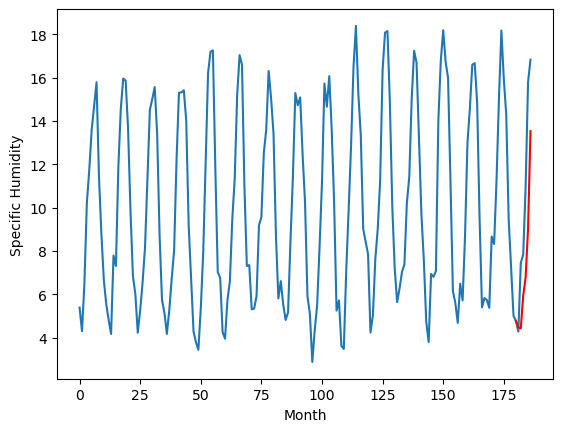

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.90		4.17		-0.73
5.61		4.12		-1.49
7.82		5.63		-2.19
8.04		6.47		-1.57
10.53		8.72		-1.81
15.28		13.22		-2.06
[180, 181, 182, 183, 184, 185, 186]
[7.05, 4.166250604391098, 4.115274219959974, 5.6275397829711435, 6.473851292580366, 8.722911446541548, 13.224692433327437]


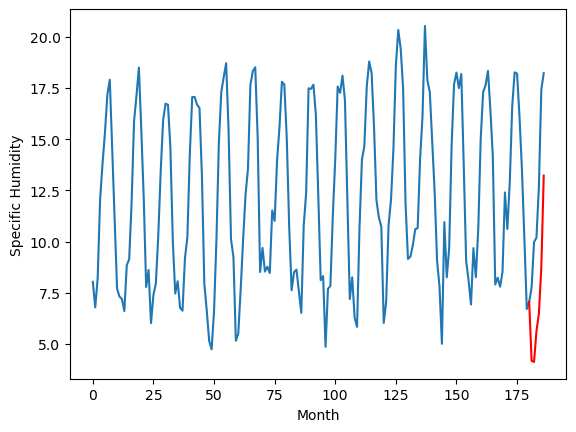

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.82		4.06		-0.76
4.97		4.01		-0.96
6.82		5.52		-1.30
7.06		6.36		-0.70
9.82		8.61		-1.21
14.44		13.11		-1.33
[180, 181, 182, 183, 184, 185, 186]
[5.06, 4.056250604391098, 4.005274219959975, 5.517539782971144, 6.3638512925803665, 8.612911446541549, 13.114692433327438]


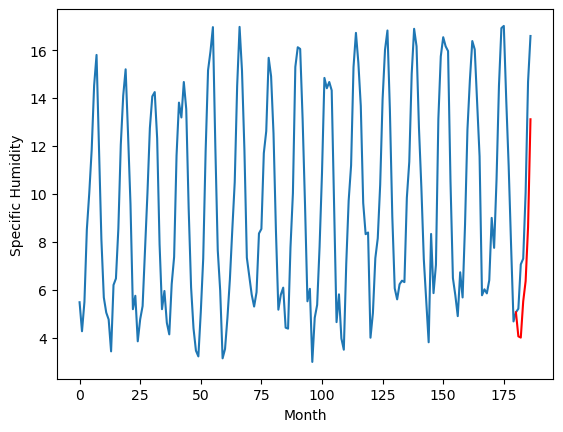

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.21		3.76		-0.45
4.12		3.71		-0.41
7.57		5.22		-2.35
8.14		6.06		-2.08
11.65		8.31		-3.34
15.55		12.81		-2.74
[180, 181, 182, 183, 184, 185, 186]
[7.05, 3.7562506043910977, 3.705274219959974, 5.217539782971143, 6.063851292580366, 8.312911446541548, 12.814692433327437]


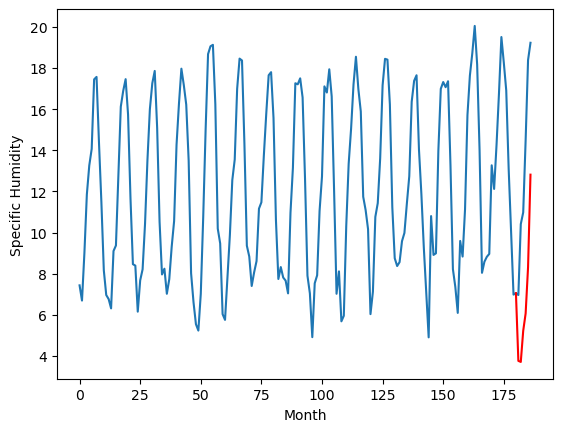

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.32		5.01		-0.31
4.92		4.96		0.04
7.76		6.47		-1.29
9.16		7.31		-1.85
13.17		9.56		-3.61
16.86		14.06		-2.80
[180, 181, 182, 183, 184, 185, 186]
[5.2, 5.006250604391098, 4.955274219959974, 6.467539782971143, 7.313851292580366, 9.562911446541548, 14.064692433327437]


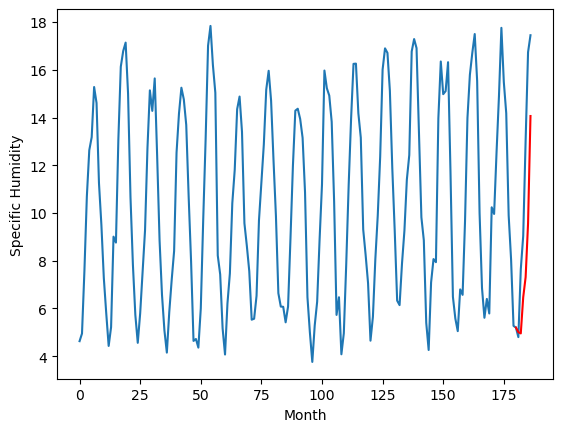

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.42		7.65		0.23
8.01		7.60		-0.41
9.58		9.11		-0.47
10.59		9.95		-0.64
13.09		12.20		-0.89
18.35		16.70		-1.65
[180, 181, 182, 183, 184, 185, 186]
[5.16, 7.646250604391097, 7.595274219959974, 9.107539782971143, 9.953851292580365, 12.202911446541547, 16.704692433327438]


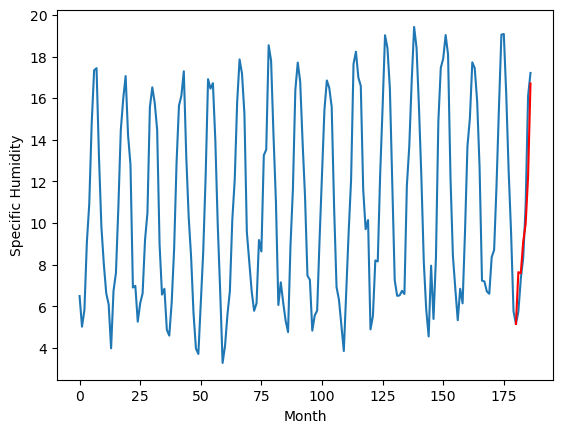

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.33		5.10		-0.23
5.38		5.05		-0.33
6.97		6.56		-0.41
7.57		7.40		-0.17
10.57		9.65		-0.92
14.95		14.15		-0.80
[180, 181, 182, 183, 184, 185, 186]
[4.05, 5.0962506043910984, 5.045274219959975, 6.557539782971144, 7.403851292580367, 9.652911446541548, 14.154692433327437]


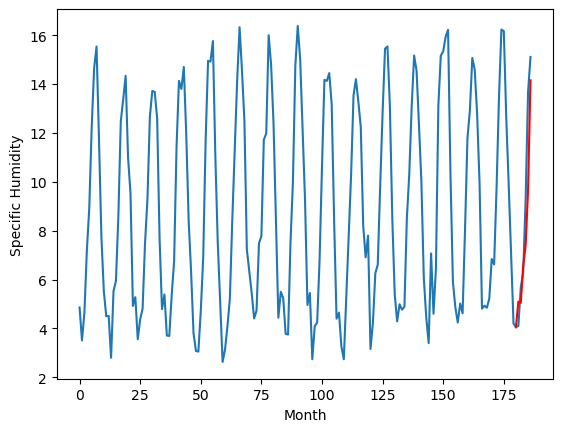

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.12		7.05		-0.07
7.15		7.00		-0.15
8.77		8.51		-0.26
9.47		9.35		-0.12
12.49		11.60		-0.89
16.76		16.10		-0.66
[180, 181, 182, 183, 184, 185, 186]
[3.64, 7.046250604391098, 6.995274219959974, 8.507539782971143, 9.353851292580366, 11.602911446541547, 16.104692433327436]


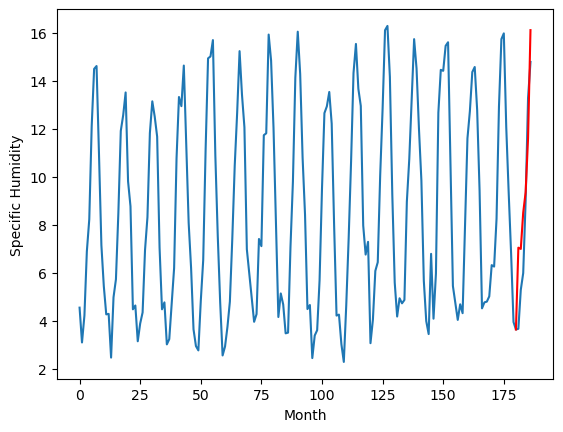

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.40		4.25		-0.15
3.72		4.20		0.48
6.78		5.71		-1.07
7.51		6.55		-0.96
10.42		8.80		-1.62
15.40		13.30		-2.10
[180, 181, 182, 183, 184, 185, 186]
[3.46, 4.246250604391098, 4.195274219959974, 5.707539782971144, 6.553851292580366, 8.802911446541547, 13.304692433327435]


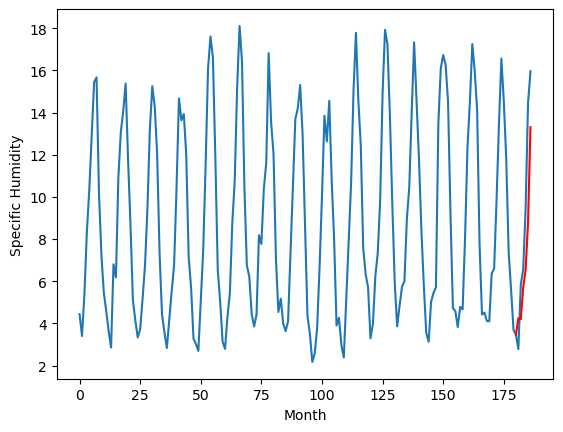

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.17		6.12		-0.05
5.72		6.07		0.35
7.52		7.58		0.06
8.84		8.42		-0.42
10.93		10.67		-0.26
15.70		15.17		-0.53
[180, 181, 182, 183, 184, 185, 186]
[2.93, 6.116250604391098, 6.065274219959974, 7.577539782971144, 8.423851292580366, 10.672911446541548, 15.174692433327436]


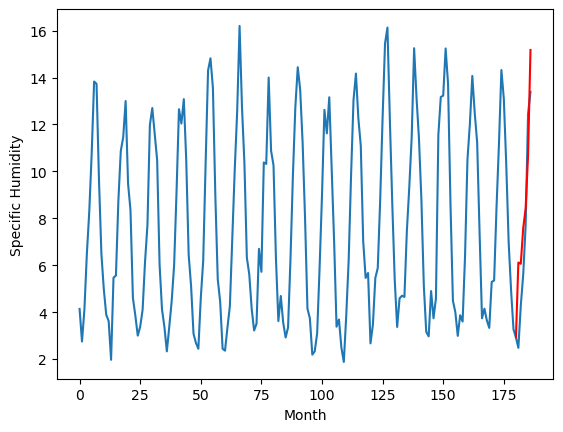

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.48		4.48		-0.00
3.74		4.43		0.69
5.36		5.94		0.58
6.96		6.78		-0.18
8.48		9.03		0.55
13.61		13.53		-0.08
[180, 181, 182, 183, 184, 185, 186]
[2.74, 4.476250604391098, 4.425274219959975, 5.937539782971144, 6.7838512925803665, 9.032911446541547, 13.534692433327436]


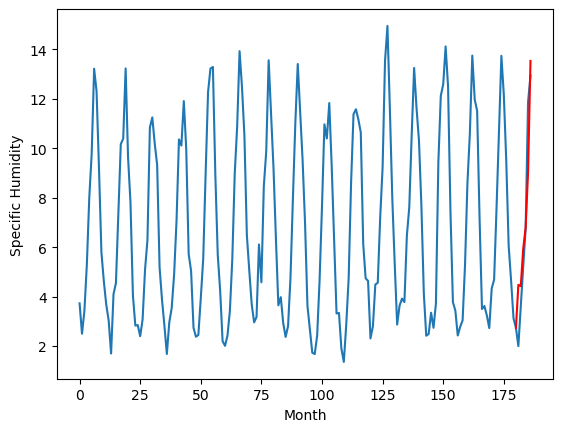

RangeIndex(start=1, stop=12, step=1)
[4.62, 4.899999999999999, 4.820000000000001, 4.209999999999998, 5.32, 7.42, 5.33, 7.119999999999999, 4.4, 6.170000000000001, 4.48]
[4.476250604391098, 4.166250604391098, 4.056250604391098, 3.7562506043910977, 5.006250604391098, 7.646250604391097, 5.0962506043910984, 7.046250604391098, 4.246250604391098, 6.116250604391098, 4.476250604391098]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.62   4.476251
1                 1    4.90   4.166251
2                 2    4.82   4.056251
3                 3    4.21   3.756251
4                 4    5.32   5.006251
5                 5    7.42   7.646251
6                 6    5.33   5.096251
7                 7    7.12   7.046251
8                 8    4.40   4.246251
9                 9    6.17   6.116251
10               10    4.48   4.476251


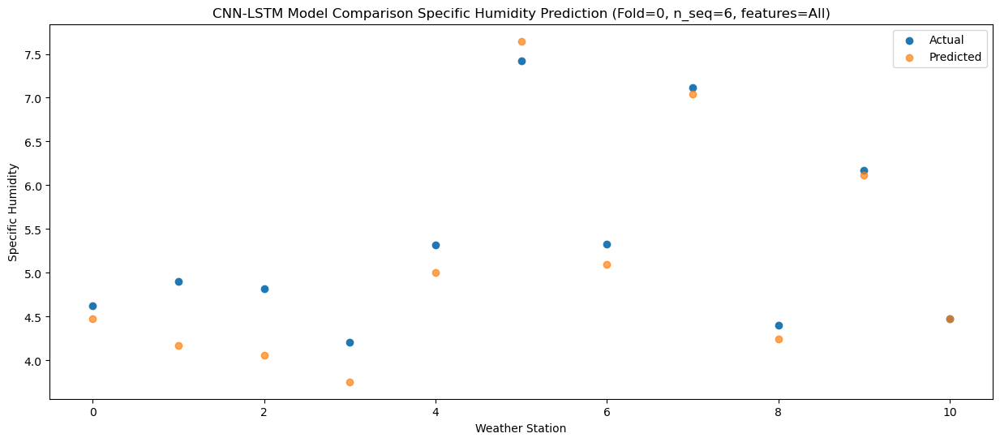

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.13   4.425274
1                 1    5.61   4.115274
2                 2    4.97   4.005274
3                 3    4.12   3.705274
4                 4    4.92   4.955274
5                 5    8.01   7.595274
6                 6    5.38   5.045274
7                 7    7.15   6.995274
8                 8    3.72   4.195274
9                 9    5.72   6.065274
10               10    3.74   4.425274


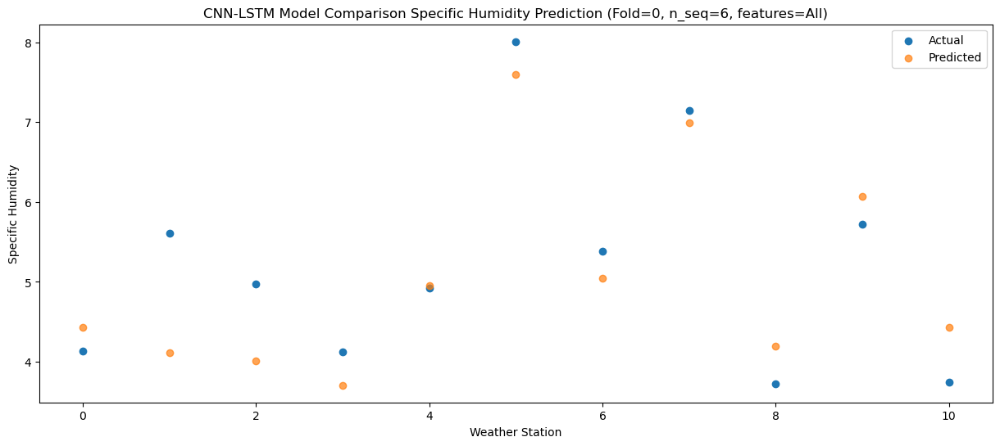

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.30    5.93754
1                 1    7.82    5.62754
2                 2    6.82    5.51754
3                 3    7.57    5.21754
4                 4    7.76    6.46754
5                 5    9.58    9.10754
6                 6    6.97    6.55754
7                 7    8.77    8.50754
8                 8    6.78    5.70754
9                 9    7.52    7.57754
10               10    5.36    5.93754


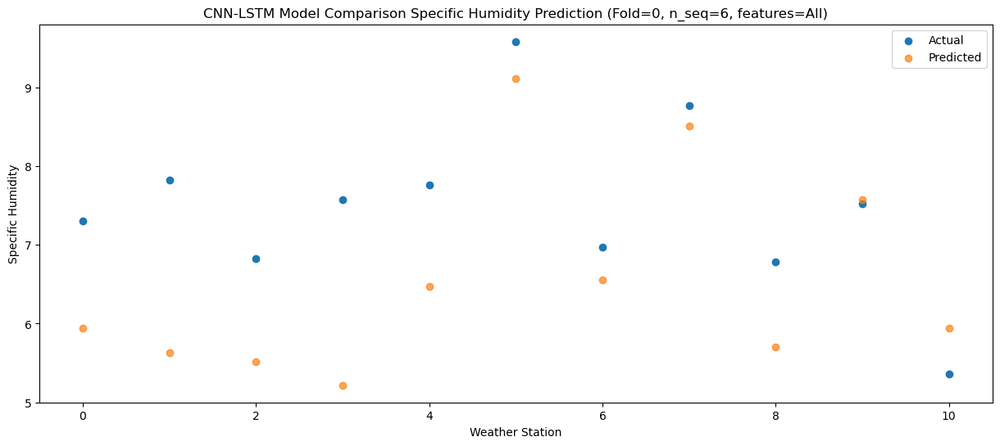

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.69   6.783851
1                 1    8.04   6.473851
2                 2    7.06   6.363851
3                 3    8.14   6.063851
4                 4    9.16   7.313851
5                 5   10.59   9.953851
6                 6    7.57   7.403851
7                 7    9.47   9.353851
8                 8    7.51   6.553851
9                 9    8.84   8.423851
10               10    6.96   6.783851


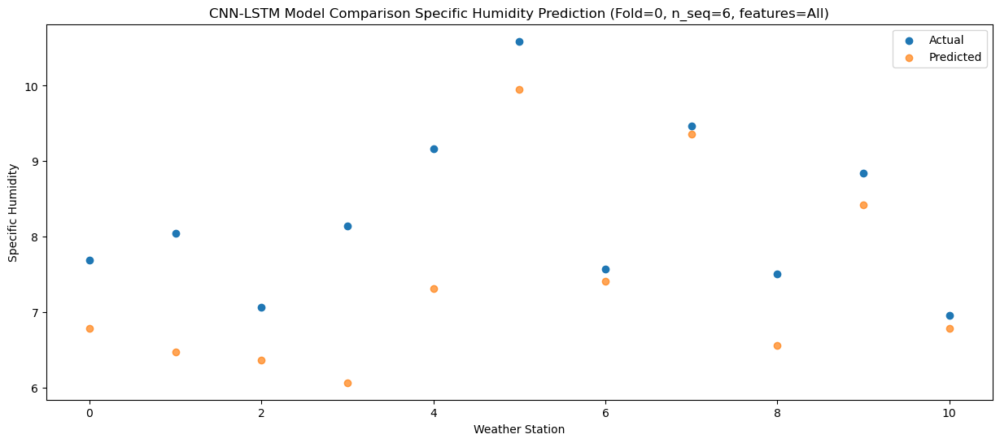

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.84   9.032911
1                 1   10.53   8.722911
2                 2    9.82   8.612911
3                 3   11.65   8.312911
4                 4   13.17   9.562911
5                 5   13.09  12.202911
6                 6   10.57   9.652911
7                 7   12.49  11.602911
8                 8   10.42   8.802911
9                 9   10.93  10.672911
10               10    8.48   9.032911


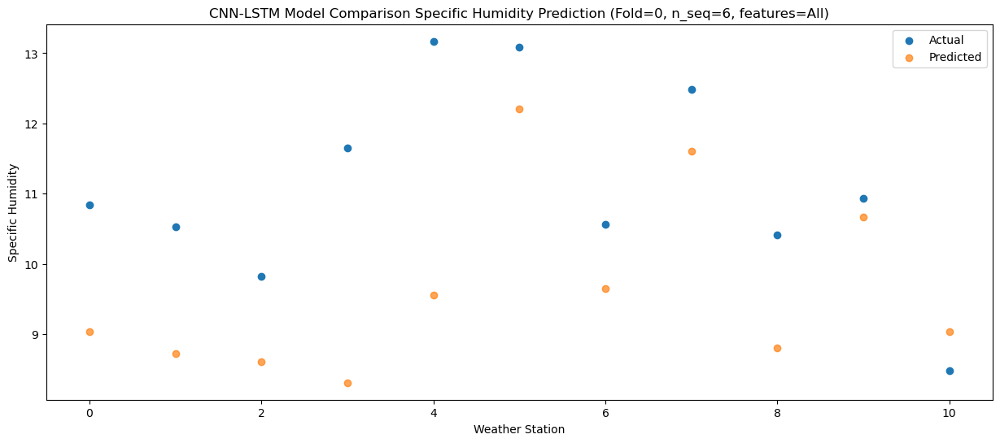

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   15.65  13.534692
1                 1   15.28  13.224692
2                 2   14.44  13.114692
3                 3   15.55  12.814692
4                 4   16.86  14.064692
5                 5   18.35  16.704692
6                 6   14.95  14.154692
7                 7   16.76  16.104692
8                 8   15.40  13.304692
9                 9   15.70  15.174692
10               10   13.61  13.534692


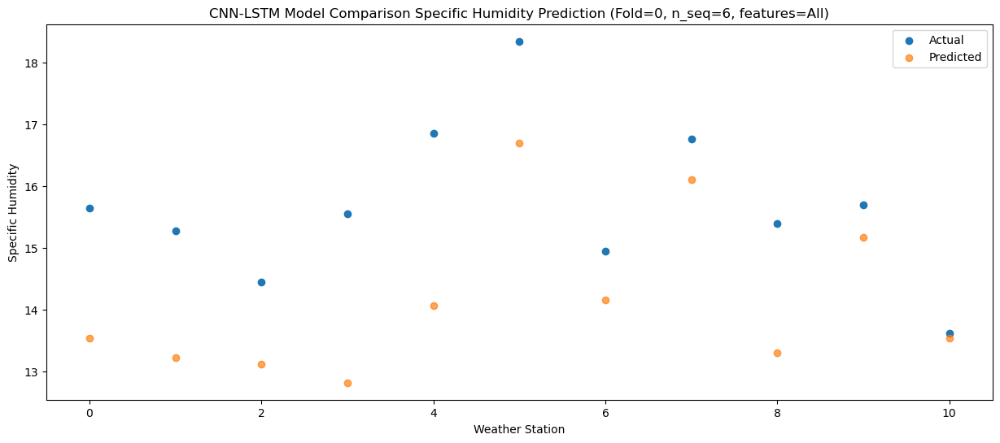

Model: "sequential_500"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_500 (Conv1D)         (None, 1, 256)            550144    
                                                                 
 max_pooling1d_500 (MaxPooli  (None, 1, 256)           0         
 ng1D)                                                           
                                                                 
 dropout_1500 (Dropout)      (None, 1, 256)            0         
                                                                 
 lstm_1000 (LSTM)            (None, 1, 1024)           5246976   
                                                                 
 dropout_1501 (Dropout)      (None, 1, 1024)           0         
                                                                 
 lstm_1001 (LSTM)            (None, 1024)              8392704   
                                                    

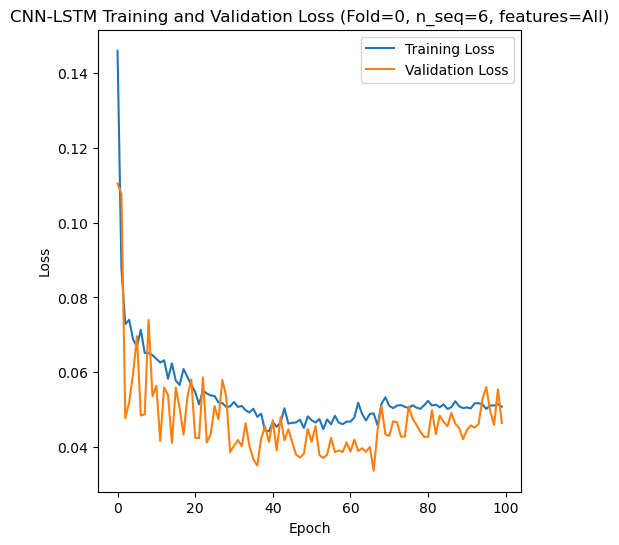

Epoch 1/100
84/84 [==============================] - 17s 116ms/step - loss: 0.1448 - val_loss: 0.0825
Epoch 2/100
84/84 [==============================] - 9s 107ms/step - loss: 0.0812 - val_loss: 0.0631
Epoch 3/100
84/84 [==============================] - 8s 99ms/step - loss: 0.0771 - val_loss: 0.0657
Epoch 4/100
84/84 [==============================] - 8s 99ms/step - loss: 0.0800 - val_loss: 0.0777
Epoch 5/100
84/84 [==============================] - 8s 91ms/step - loss: 0.0702 - val_loss: 0.1011
Epoch 6/100
84/84 [==============================] - 8s 94ms/step - loss: 0.0691 - val_loss: 0.0661
Epoch 7/100
84/84 [==============================] - 4s 51ms/step - loss: 0.0629 - val_loss: 0.0664
Epoch 8/100
84/84 [==============================] - 4s 50ms/step - loss: 0.0590 - val_loss: 0.0616
Epoch 9/100
84/84 [==============================] - 4s 50ms/step - loss: 0.0650 - val_loss: 0.0729
Epoch 10/100
84/84 [==============================] - 4s 47ms/step - loss: 0.0603 - val_loss: 0.0

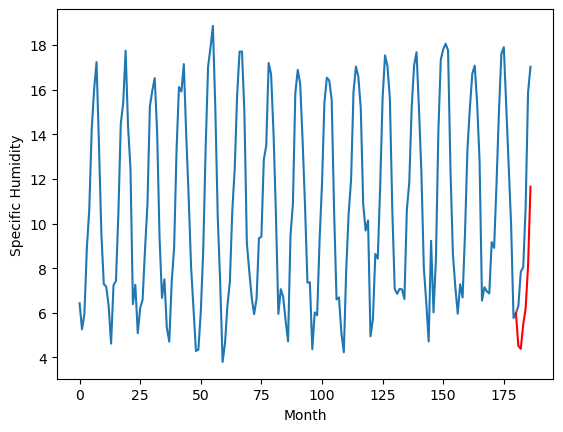

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.34		3.92		-0.42
4.53		3.83		-0.70
6.06		5.22		-0.84
6.42		6.13		-0.29
9.34		8.29		-1.05
13.32		12.36		-0.96
[180, 181, 182, 183, 184, 185, 186]
[4.15, 3.922563798427582, 3.8272297602891925, 5.221361659169197, 6.129489563107491, 8.287349603772164, 12.364313505291939]


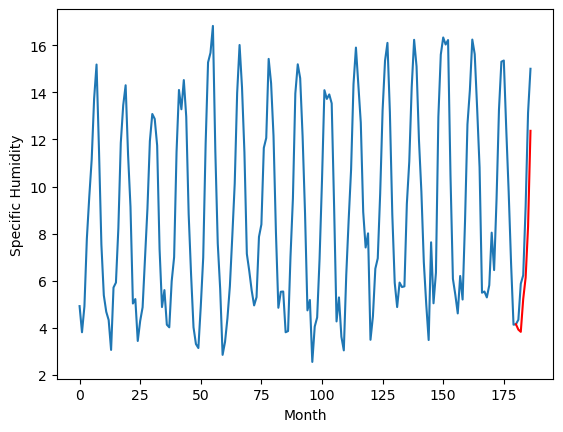

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.22		2.66		-0.56
3.22		2.56		-0.66
5.84		4.01		-1.83
5.55		4.94		-0.61
8.39		7.13		-1.26
12.91		11.27		-1.64
[180, 181, 182, 183, 184, 185, 186]
[5.12, 2.6629684340953825, 2.5632751506567, 4.010181002020836, 4.940783790946007, 7.13167434155941, 11.274669699072838]


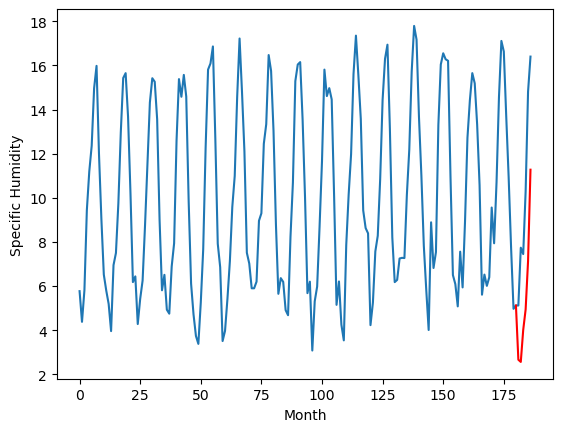

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.03		2.02		-0.01
2.10		1.92		-0.18
4.74		3.15		-1.59
6.08		3.96		-2.12
9.97		5.99		-3.98
13.16		9.80		-3.36
[180, 181, 182, 183, 184, 185, 186]
[6.35, 2.021262313127518, 1.9160921823978425, 3.1463642370700837, 3.962934459447861, 5.986500943899155, 9.800643647909165]


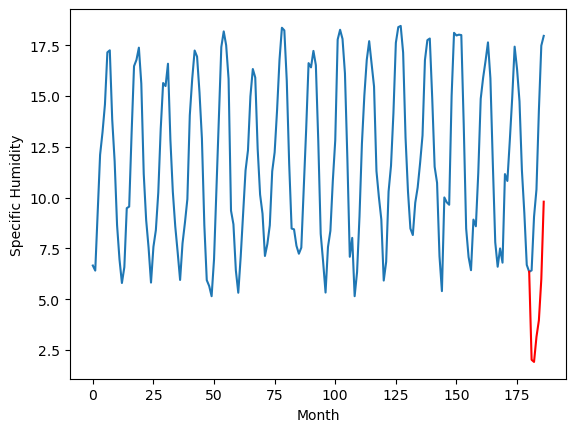

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.18		6.05		-0.13
6.22		5.95		-0.27
8.94		7.27		-1.67
10.20		8.15		-2.05
14.23		10.25		-3.98
17.64		14.22		-3.42
[180, 181, 182, 183, 184, 185, 186]
[6.08, 6.0494888353347775, 5.9546062874794, 7.274637811183929, 8.147017769813537, 10.25121741771698, 14.223835043907165]


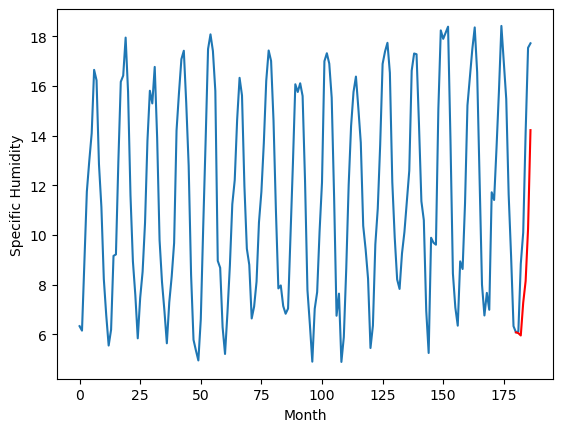

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.75		4.98		-0.77
5.12		4.76		-0.36
5.91		5.28		-0.63
7.21		5.59		-1.62
11.52		6.82		-4.70
13.69		9.23		-4.46
[180, 181, 182, 183, 184, 185, 186]
[3.92, 4.977974748313427, 4.758786073029041, 5.276186874210834, 5.586056133806705, 6.820143124163151, 9.231286188662052]


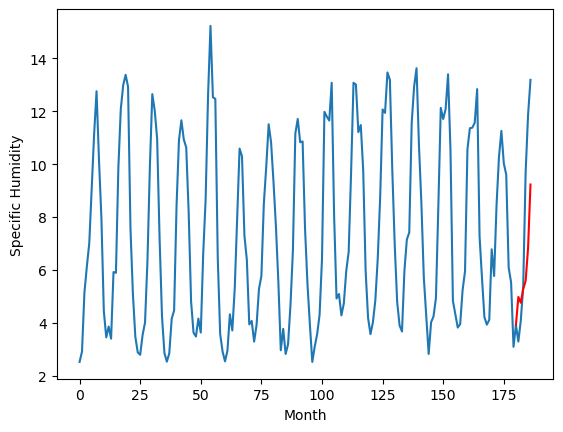

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.66		5.38		-0.28
5.78		5.29		-0.49
7.34		6.65		-0.69
7.96		7.54		-0.42
10.89		9.68		-1.21
15.24		13.72		-1.52
[180, 181, 182, 183, 184, 185, 186]
[4.16, 5.378442336320877, 5.285596322715282, 6.649049114882946, 7.544061553180217, 9.682651650607585, 13.721079480350017]


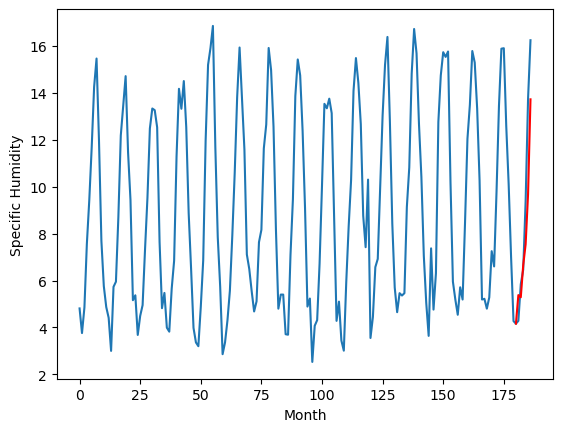

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.53		6.26		-0.27
6.01		6.14		0.13
8.74		7.85		-0.89
9.97		8.86		-1.11
13.18		11.18		-2.00
17.94		15.58		-2.36
[180, 181, 182, 183, 184, 185, 186]
[3.84, 6.260048691034317, 6.137929808199406, 7.846547018587589, 8.861212979853153, 11.178731214106083, 15.575366269648075]


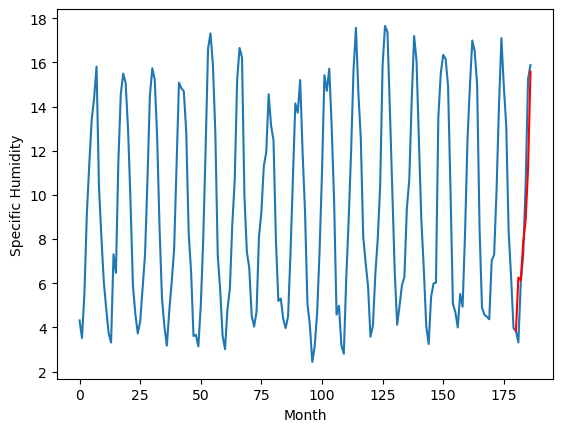

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.49		5.93		-0.56
5.68		5.83		0.15
8.29		7.25		-1.04
9.45		8.17		-1.28
13.67		10.34		-3.33
16.81		14.45		-2.36
[180, 181, 182, 183, 184, 185, 186]
[3.73, 5.928221957683563, 5.830961594283581, 7.248574742972851, 8.166714677512646, 10.339288482367992, 14.445668945014477]


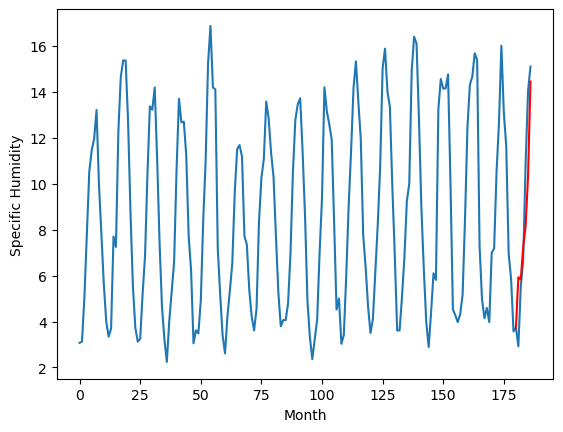

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.71		2.46		-0.25
1.97		2.26		0.29
3.79		2.95		-0.84
3.96		3.38		-0.58
9.11		4.80		-4.31
12.10		7.55		-4.55
[180, 181, 182, 183, 184, 185, 186]
[2.83, 2.4603157606720925, 2.260031160414219, 2.947157260477543, 3.37823941975832, 4.795180704891681, 7.545510437786579]


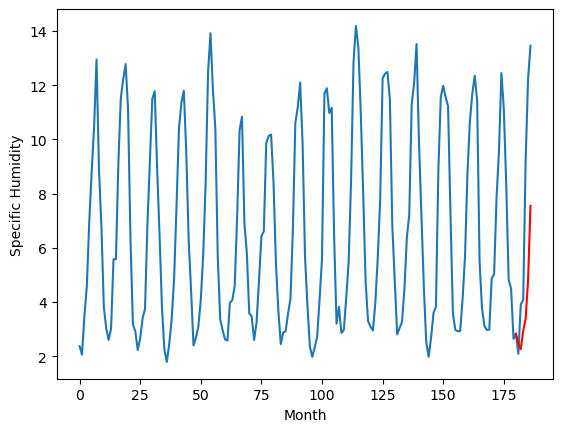

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.08		4.54		0.46
4.12		4.40		0.28
5.36		5.44		0.08
6.73		6.13		-0.60
8.26		7.97		-0.29
13.58		11.43		-2.15
[180, 181, 182, 183, 184, 185, 186]
[2.69, 4.540222254991531, 4.401142535209655, 5.438495097160339, 6.125798103809356, 7.965331790447235, 11.42683028936386]


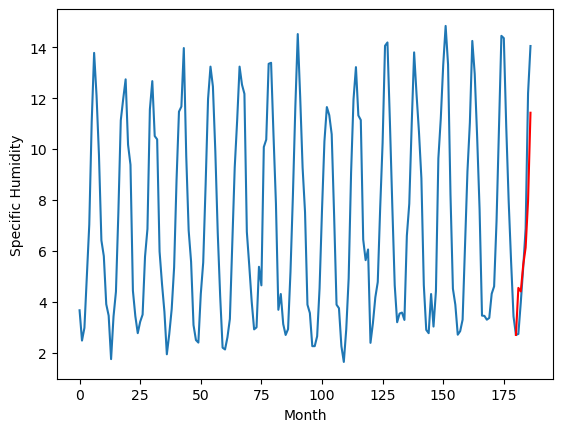

RangeIndex(start=1, stop=12, step=1)
[5.03, 4.340000000000002, 3.2199999999999998, 2.0299999999999994, 6.18, 5.75, 5.66, 6.529999999999999, 6.49, 2.7100000000000004, 4.079999999999999]
[4.515755293369293, 3.922563798427582, 2.6629684340953825, 2.021262313127518, 6.0494888353347775, 4.977974748313427, 5.378442336320877, 6.260048691034317, 5.928221957683563, 2.4603157606720925, 4.540222254991531]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    5.03   4.515755
1                 1    4.34   3.922564
2                 2    3.22   2.662968
3                 3    2.03   2.021262
4                 4    6.18   6.049489
5                 5    5.75   4.977975
6                 6    5.66   5.378442
7                 7    6.53   6.260049
8                 8    6.49   5.928222
9                 9    2.71   2.460316
10               10    4.08   4.540222


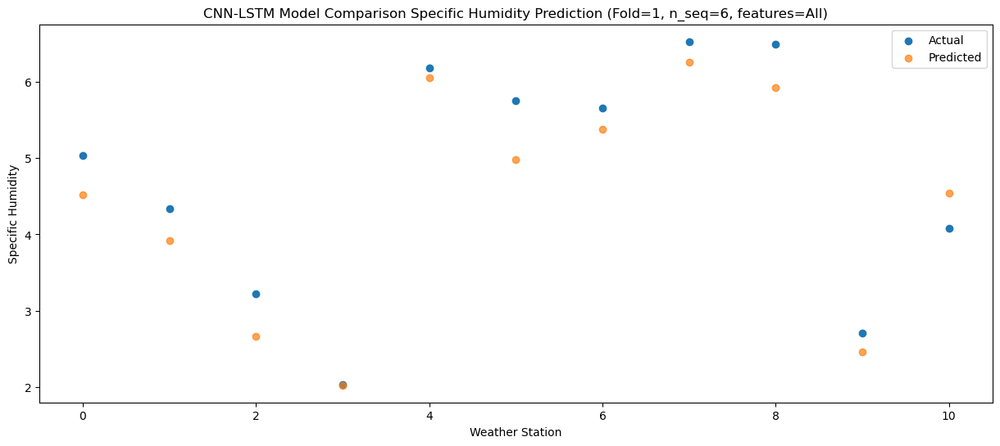

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    5.35   4.386165
1                 1    4.53   3.827230
2                 2    3.22   2.563275
3                 3    2.10   1.916092
4                 4    6.22   5.954606
5                 5    5.12   4.758786
6                 6    5.78   5.285596
7                 7    6.01   6.137930
8                 8    5.68   5.830962
9                 9    1.97   2.260031
10               10    4.12   4.401143


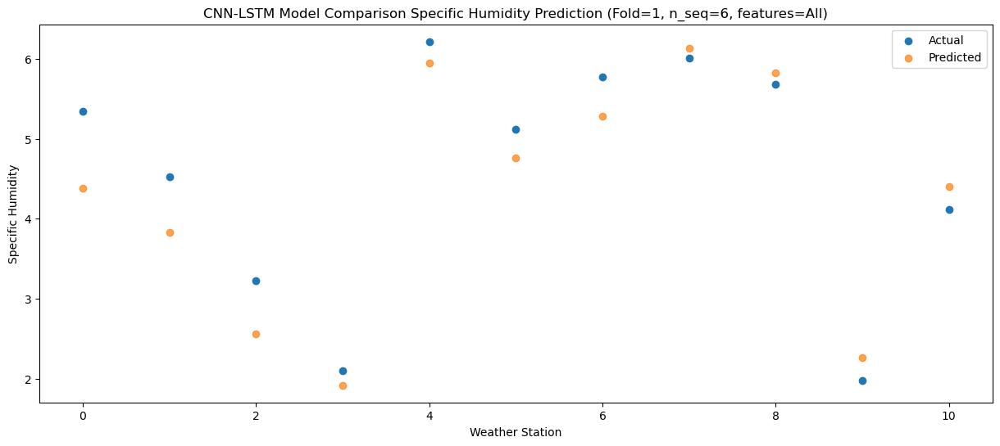

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.88   5.476176
1                 1    6.06   5.221362
2                 2    5.84   4.010181
3                 3    4.74   3.146364
4                 4    8.94   7.274638
5                 5    5.91   5.276187
6                 6    7.34   6.649049
7                 7    8.74   7.846547
8                 8    8.29   7.248575
9                 9    3.79   2.947157
10               10    5.36   5.438495


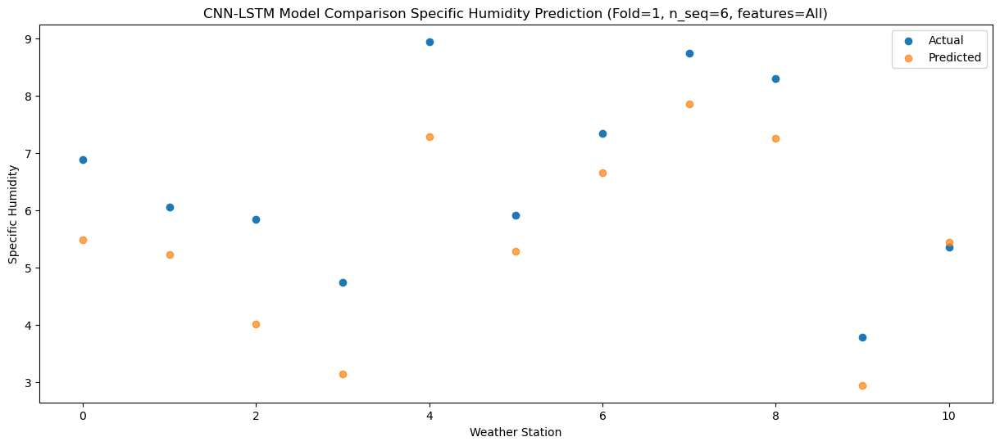

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.08   6.199883
1                 1    6.42   6.129490
2                 2    5.55   4.940784
3                 3    6.08   3.962934
4                 4   10.20   8.147018
5                 5    7.21   5.586056
6                 6    7.96   7.544062
7                 7    9.97   8.861213
8                 8    9.45   8.166715
9                 9    3.96   3.378239
10               10    6.73   6.125798


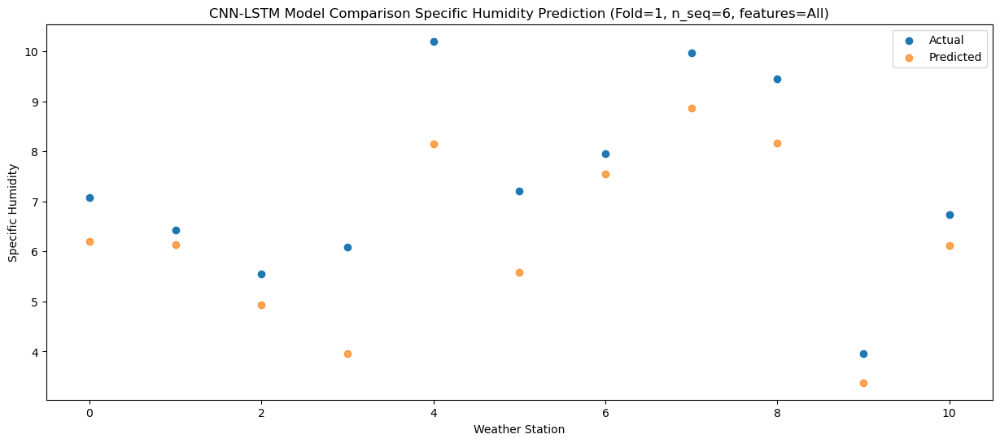

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    9.76   8.095651
1                 1    9.34   8.287350
2                 2    8.39   7.131674
3                 3    9.97   5.986501
4                 4   14.23  10.251217
5                 5   11.52   6.820143
6                 6   10.89   9.682652
7                 7   13.18  11.178731
8                 8   13.67  10.339288
9                 9    9.11   4.795181
10               10    8.26   7.965332


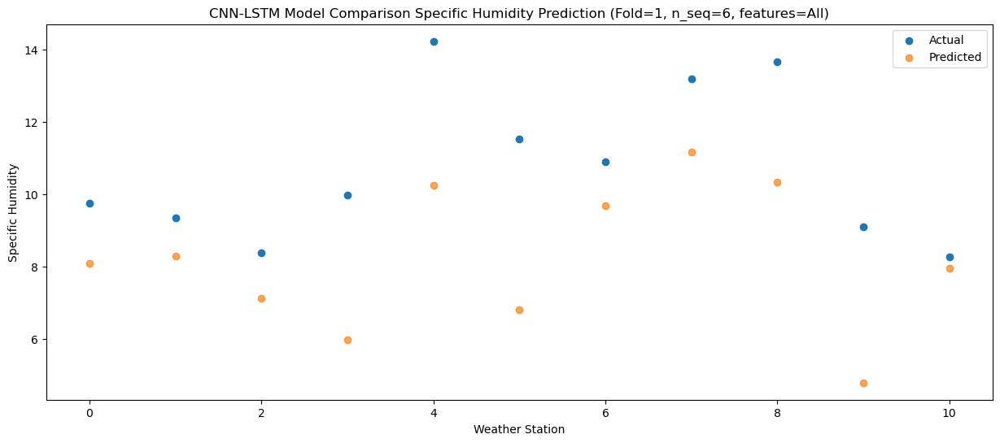

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.92  11.655986
1                 1   13.32  12.364314
2                 2   12.91  11.274670
3                 3   13.16   9.800644
4                 4   17.64  14.223835
5                 5   13.69   9.231286
6                 6   15.24  13.721079
7                 7   17.94  15.575366
8                 8   16.81  14.445669
9                 9   12.10   7.545510
10               10   13.58  11.426830


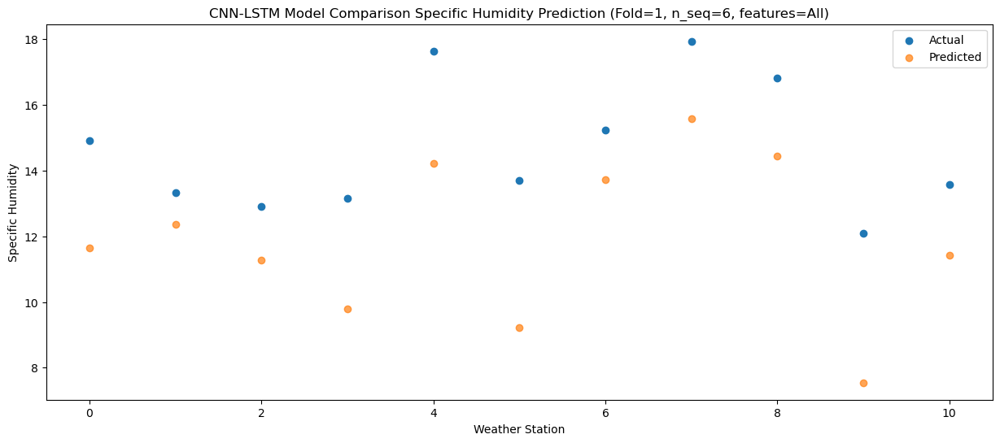

Model: "sequential_501"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_501 (Conv1D)         (None, 1, 256)            550144    
                                                                 
 max_pooling1d_501 (MaxPooli  (None, 1, 256)           0         
 ng1D)                                                           
                                                                 
 dropout_1503 (Dropout)      (None, 1, 256)            0         
                                                                 
 lstm_1002 (LSTM)            (None, 1, 1024)           5246976   
                                                                 
 dropout_1504 (Dropout)      (None, 1, 1024)           0         
                                                                 
 lstm_1003 (LSTM)            (None, 1024)              8392704   
                                                    

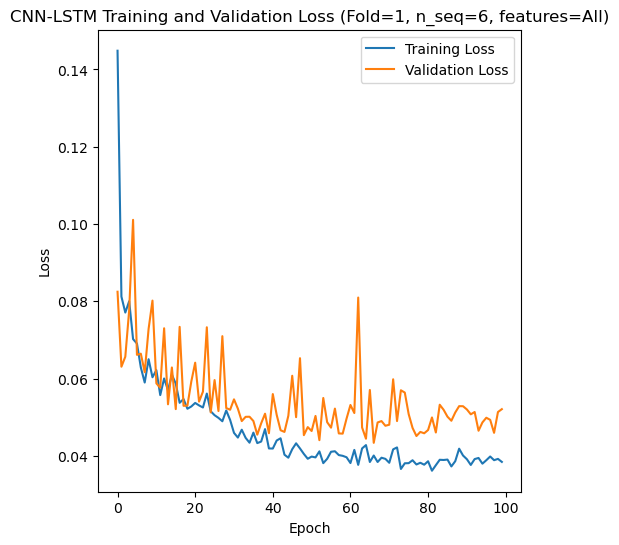

Epoch 1/100
84/84 [==============================] - 22s 119ms/step - loss: 0.1282 - val_loss: 0.0576
Epoch 2/100
84/84 [==============================] - 7s 82ms/step - loss: 0.0919 - val_loss: 0.1394
Epoch 3/100
84/84 [==============================] - 6s 71ms/step - loss: 0.0755 - val_loss: 0.0582
Epoch 4/100
84/84 [==============================] - 6s 71ms/step - loss: 0.0705 - val_loss: 0.0457
Epoch 5/100
84/84 [==============================] - 5s 65ms/step - loss: 0.0830 - val_loss: 0.0785
Epoch 6/100
84/84 [==============================] - 5s 58ms/step - loss: 0.0708 - val_loss: 0.0746
Epoch 7/100
84/84 [==============================] - 6s 66ms/step - loss: 0.0702 - val_loss: 0.0487
Epoch 8/100
84/84 [==============================] - 5s 58ms/step - loss: 0.0739 - val_loss: 0.0356
Epoch 9/100
84/84 [==============================] - 5s 58ms/step - loss: 0.0626 - val_loss: 0.0433
Epoch 10/100
84/84 [==============================] - 4s 51ms/step - loss: 0.0699 - val_loss: 0.04

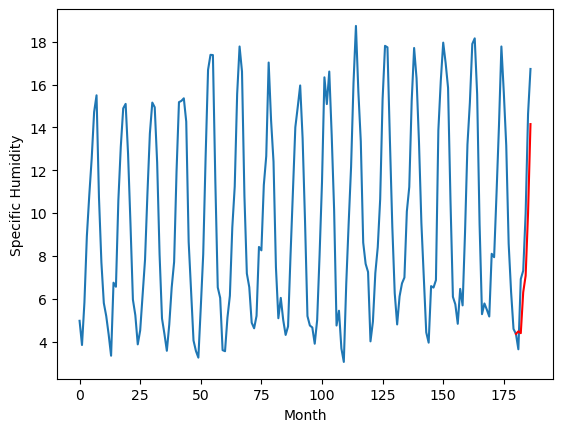

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.84		1.75		-0.09
1.16		1.66		0.50
3.01		3.57		0.56
3.13		4.34		1.21
8.25		7.28		-0.97
11.16		11.43		0.27
[180, 181, 182, 183, 184, 185, 186]
[2.82, 1.747497751712799, 1.6631822952628135, 3.5738033422827717, 4.34336552709341, 7.275569296777248, 11.425994730889798]


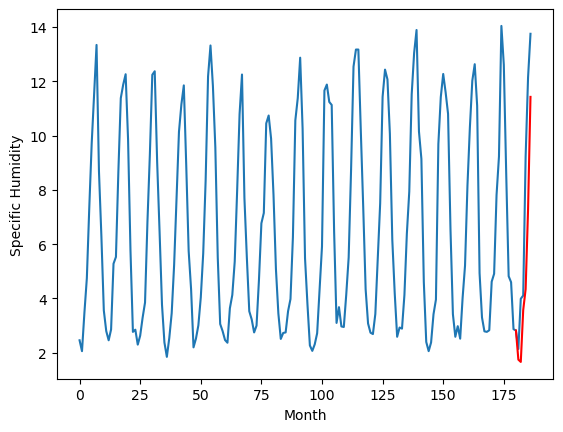

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.53		4.90		-0.63
7.66		4.81		-2.85
7.88		6.72		-1.16
8.85		7.49		-1.36
10.16		10.43		0.27
13.94		14.58		0.64
[180, 181, 182, 183, 184, 185, 186]
[9.16, 4.897497751712799, 4.813182295262814, 6.723803342282772, 7.4933655270934105, 10.425569296777248, 14.575994730889796]


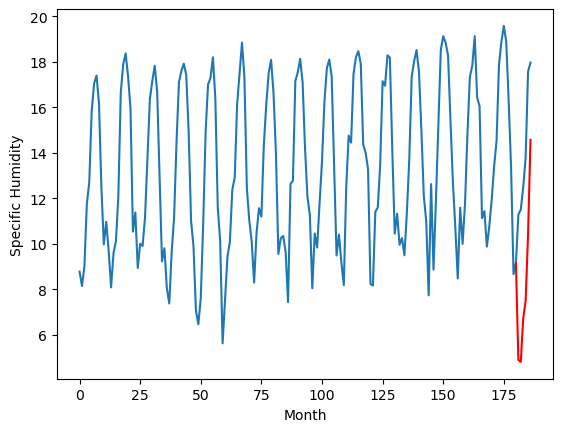

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.98		4.92		0.94
4.15		4.83		0.68
4.79		6.74		1.95
6.14		7.51		1.37
7.82		10.45		2.63
12.42		14.60		2.18
[180, 181, 182, 183, 184, 185, 186]
[2.44, 4.917497751712799, 4.833182295262813, 6.743803342282772, 7.51336552709341, 10.445569296777247, 14.595994730889796]


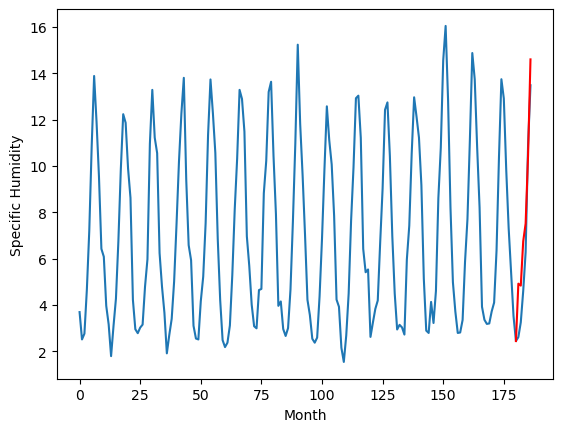

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.10		4.83		-0.27
5.08		4.74		-0.34
8.37		6.65		-1.72
8.39		7.42		-0.97
11.59		10.36		-1.23
15.48		14.51		-0.97
[180, 181, 182, 183, 184, 185, 186]
[6.65, 4.827497751712799, 4.743182295262813, 6.653803342282772, 7.42336552709341, 10.355569296777247, 14.505994730889796]


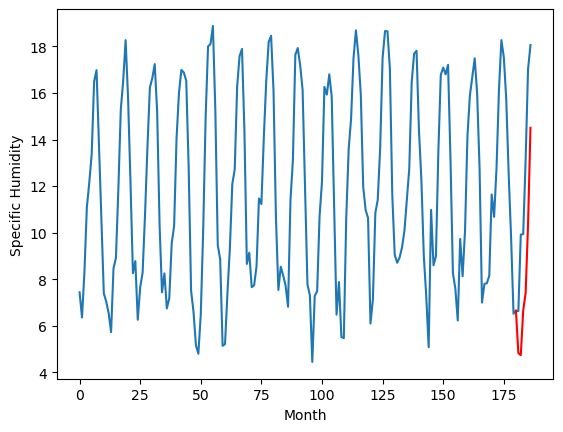

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.33		2.32		-0.01
2.28		2.23		-0.05
5.27		4.14		-1.13
6.84		4.91		-1.93
11.67		7.85		-3.82
14.31		12.00		-2.31
[180, 181, 182, 183, 184, 185, 186]
[6.19, 2.317497751712799, 2.2331822952628135, 4.143803342282772, 4.9133655270934105, 7.845569296777248, 11.995994730889798]


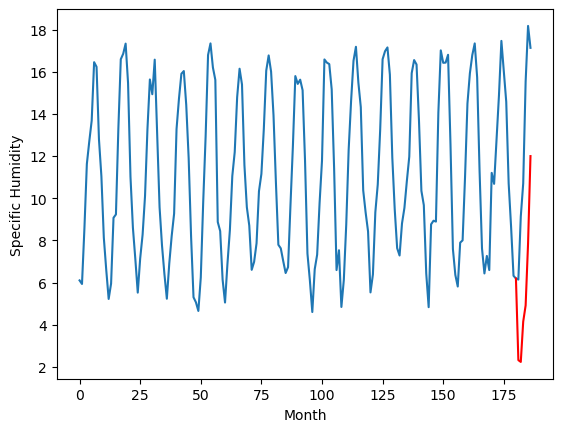

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.68		8.64		-0.04
8.35		8.55		0.20
11.21		10.46		-0.75
12.53		11.23		-1.30
16.73		14.17		-2.56
20.48		18.32		-2.16
[180, 181, 182, 183, 184, 185, 186]
[4.78, 8.637497751712798, 8.553182295262813, 10.463803342282771, 11.23336552709341, 14.165569296777248, 18.3159947308898]


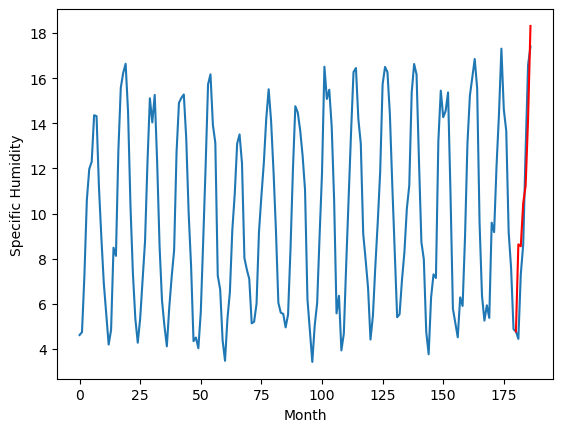

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.97		3.55		-0.42
3.84		3.46		-0.38
3.93		5.37		1.44
4.23		6.14		1.91
4.35		9.08		4.73
7.01		13.23		6.22
[180, 181, 182, 183, 184, 185, 186]
[2.61, 3.547497751712799, 3.4631822952628135, 5.373803342282772, 6.14336552709341, 9.075569296777248, 13.225994730889797]


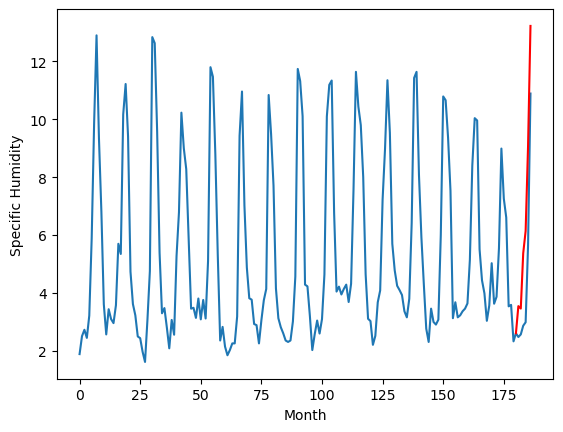

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.29		7.30		-0.99
8.82		7.21		-1.61
8.93		9.12		0.19
10.25		9.89		-0.36
11.73		12.83		1.10
12.98		16.98		4.00
[180, 181, 182, 183, 184, 185, 186]
[4.6, 7.2974977517127995, 7.213182295262814, 9.123803342282773, 9.893365527093412, 12.82556929677725, 16.9759947308898]


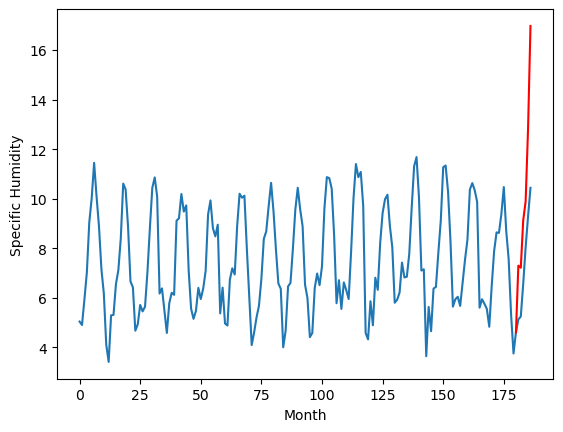

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.98		5.96		-0.02
6.05		5.87		-0.18
7.78		7.78		0.00
8.31		8.55		0.24
11.02		11.49		0.47
15.52		15.64		0.12
[180, 181, 182, 183, 184, 185, 186]
[4.27, 5.957497751712799, 5.873182295262813, 7.783803342282772, 8.55336552709341, 11.485569296777248, 15.635994730889797]


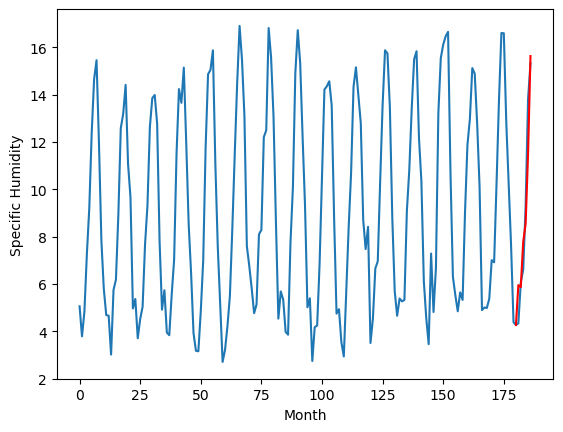

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.63		4.48		-0.15
4.87		4.39		-0.48
5.90		6.30		0.40
6.51		7.07		0.56
9.18		10.01		0.83
13.28		14.16		0.88
[180, 181, 182, 183, 184, 185, 186]
[3.91, 4.477497751712799, 4.393182295262814, 6.303803342282772, 7.073365527093411, 10.00556929677725, 14.155994730889798]


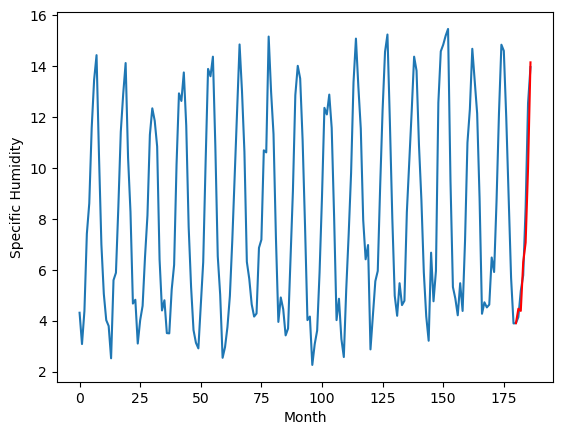

RangeIndex(start=1, stop=12, step=1)
[4.390000000000001, 1.8399999999999992, 5.529999999999999, 3.9799999999999995, 5.1, 2.33, 8.68, 3.9700000000000006, 8.29, 5.9799999999999995, 4.63]
[4.477497751712799, 1.747497751712799, 4.897497751712799, 4.917497751712799, 4.827497751712799, 2.317497751712799, 8.637497751712798, 3.547497751712799, 7.2974977517127995, 5.957497751712799, 4.477497751712799]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.39   4.477498
1                 1    1.84   1.747498
2                 2    5.53   4.897498
3                 3    3.98   4.917498
4                 4    5.10   4.827498
5                 5    2.33   2.317498
6                 6    8.68   8.637498
7                 7    3.97   3.547498
8                 8    8.29   7.297498
9                 9    5.98   5.957498
10               10    4.63   4.477498


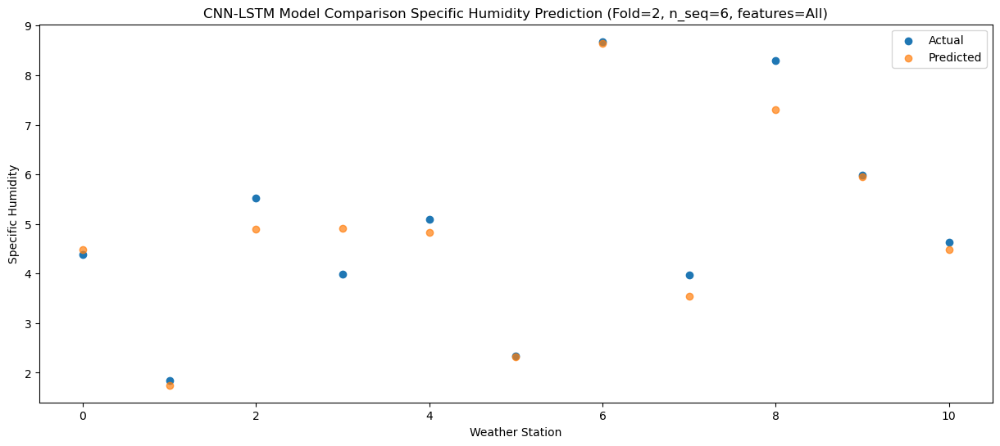

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.67   4.393182
1                 1    1.16   1.663182
2                 2    7.66   4.813182
3                 3    4.15   4.833182
4                 4    5.08   4.743182
5                 5    2.28   2.233182
6                 6    8.35   8.553182
7                 7    3.84   3.463182
8                 8    8.82   7.213182
9                 9    6.05   5.873182
10               10    4.87   4.393182


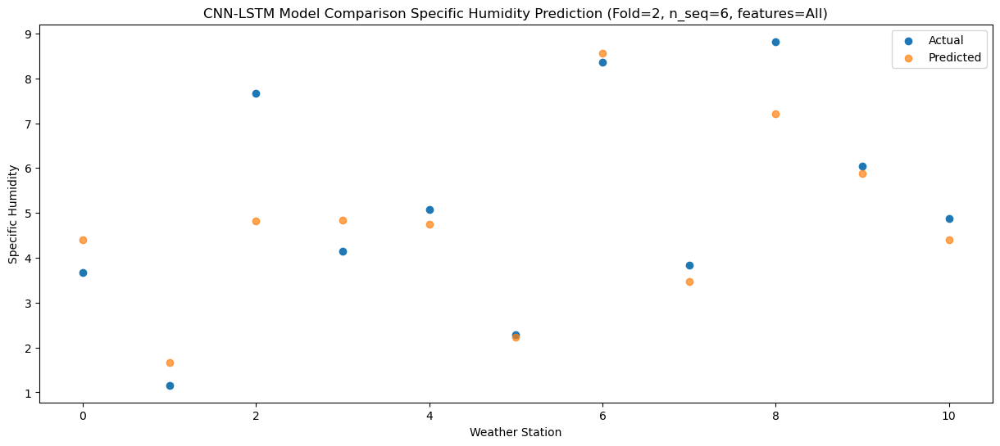

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.95   6.303803
1                 1    3.01   3.573803
2                 2    7.88   6.723803
3                 3    4.79   6.743803
4                 4    8.37   6.653803
5                 5    5.27   4.143803
6                 6   11.21  10.463803
7                 7    3.93   5.373803
8                 8    8.93   9.123803
9                 9    7.78   7.783803
10               10    5.90   6.303803


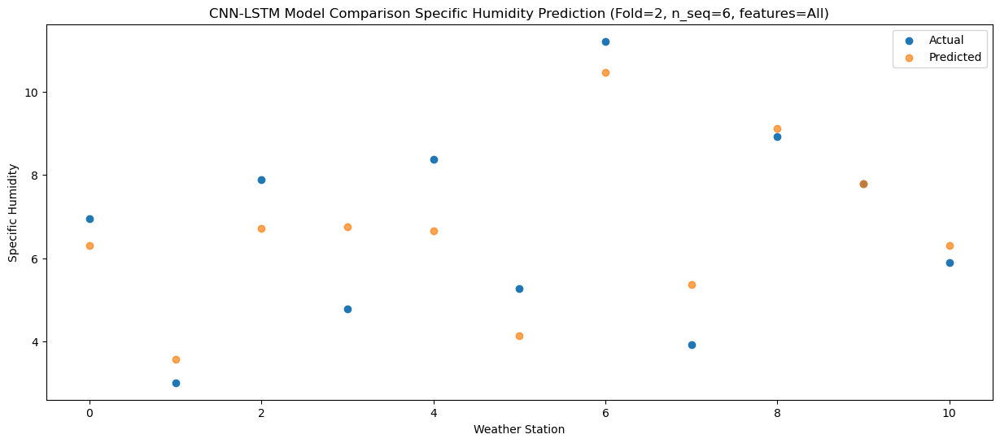

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.34   7.073366
1                 1    3.13   4.343366
2                 2    8.85   7.493366
3                 3    6.14   7.513366
4                 4    8.39   7.423366
5                 5    6.84   4.913366
6                 6   12.53  11.233366
7                 7    4.23   6.143366
8                 8   10.25   9.893366
9                 9    8.31   8.553366
10               10    6.51   7.073366


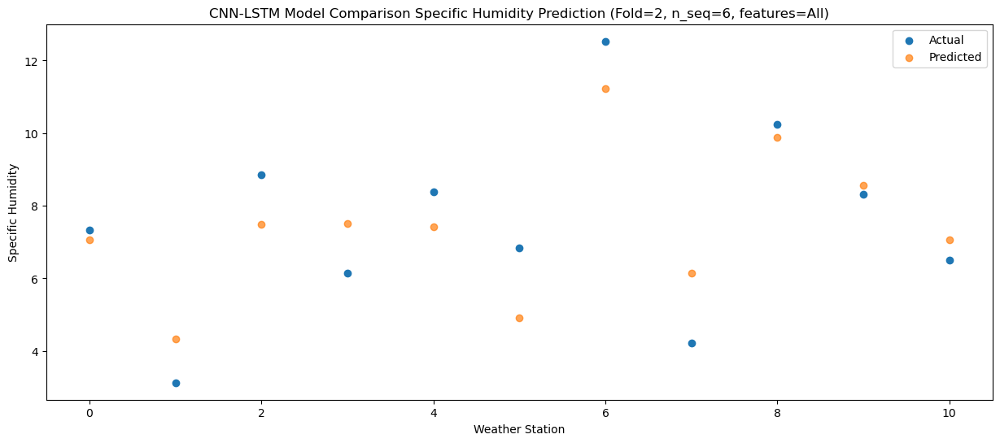

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.01  10.005569
1                 1    8.25   7.275569
2                 2   10.16  10.425569
3                 3    7.82  10.445569
4                 4   11.59  10.355569
5                 5   11.67   7.845569
6                 6   16.73  14.165569
7                 7    4.35   9.075569
8                 8   11.73  12.825569
9                 9   11.02  11.485569
10               10    9.18  10.005569


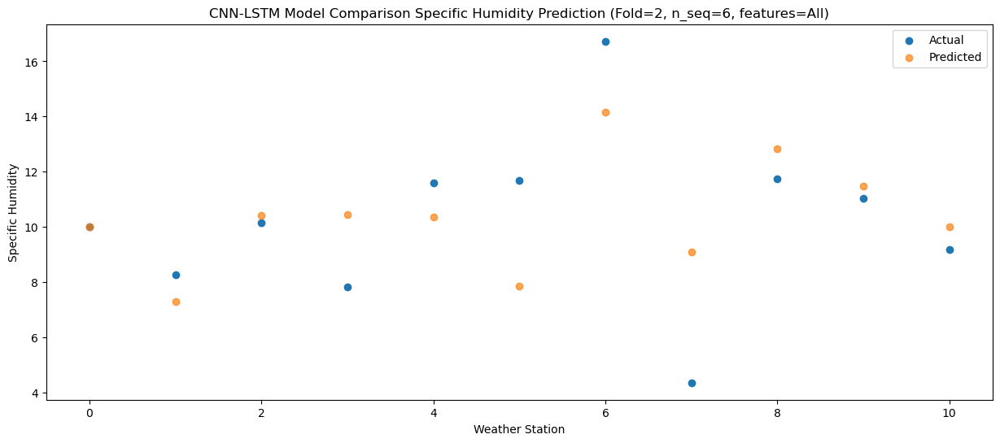

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.66  14.155995
1                 1   11.16  11.425995
2                 2   13.94  14.575995
3                 3   12.42  14.595995
4                 4   15.48  14.505995
5                 5   14.31  11.995995
6                 6   20.48  18.315995
7                 7    7.01  13.225995
8                 8   12.98  16.975995
9                 9   15.52  15.635995
10               10   13.28  14.155995


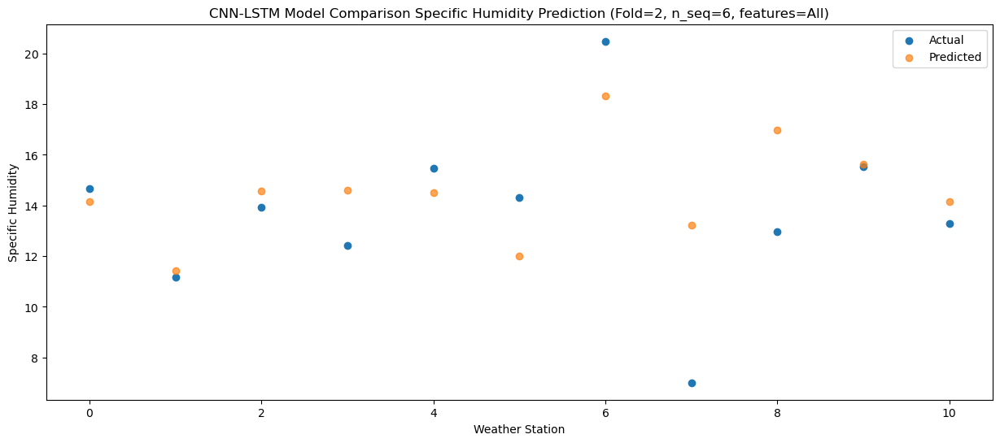

Model: "sequential_502"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_502 (Conv1D)         (None, 1, 256)            550144    
                                                                 
 max_pooling1d_502 (MaxPooli  (None, 1, 256)           0         
 ng1D)                                                           
                                                                 
 dropout_1506 (Dropout)      (None, 1, 256)            0         
                                                                 
 lstm_1004 (LSTM)            (None, 1, 1024)           5246976   
                                                                 
 dropout_1507 (Dropout)      (None, 1, 1024)           0         
                                                                 
 lstm_1005 (LSTM)            (None, 1024)              8392704   
                                                    

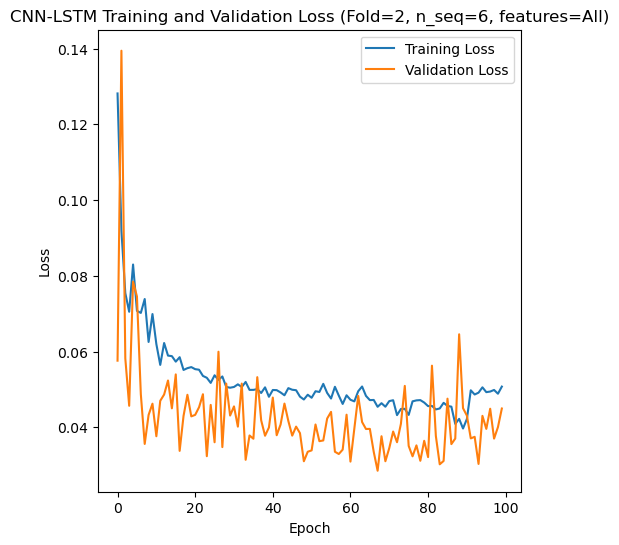

Epoch 1/100
84/84 [==============================] - 24s 120ms/step - loss: 0.1493 - val_loss: 0.1177
Epoch 2/100
84/84 [==============================] - 5s 64ms/step - loss: 0.0777 - val_loss: 0.0584
Epoch 3/100
84/84 [==============================] - 5s 57ms/step - loss: 0.0767 - val_loss: 0.1068
Epoch 4/100
84/84 [==============================] - 4s 51ms/step - loss: 0.0757 - val_loss: 0.0607
Epoch 5/100
84/84 [==============================] - 6s 68ms/step - loss: 0.0731 - val_loss: 0.0559
Epoch 6/100
84/84 [==============================] - 5s 64ms/step - loss: 0.0626 - val_loss: 0.0472
Epoch 7/100
84/84 [==============================] - 5s 63ms/step - loss: 0.0610 - val_loss: 0.0581
Epoch 8/100
84/84 [==============================] - 5s 57ms/step - loss: 0.0672 - val_loss: 0.0519
Epoch 9/100
84/84 [==============================] - 6s 68ms/step - loss: 0.0579 - val_loss: 0.0577
Epoch 10/100
84/84 [==============================] - 7s 86ms/step - loss: 0.0546 - val_loss: 0.05

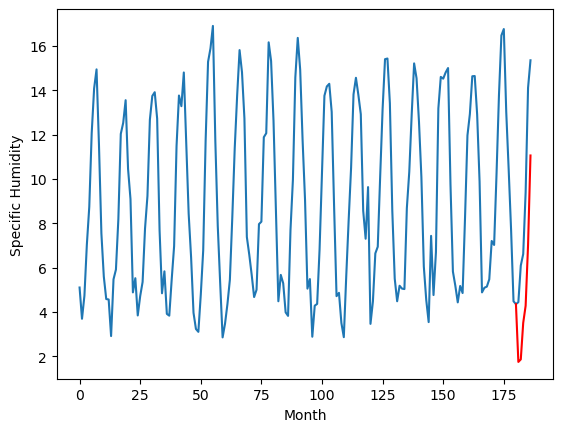

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.64		2.79		0.15
2.08		2.91		0.83
4.59		4.55		-0.04
5.76		5.33		-0.43
9.28		8.07		-1.21
13.81		12.11		-1.70
[180, 181, 182, 183, 184, 185, 186]
[3.43, 2.79355794519186, 2.907151970565319, 4.55402627915144, 5.3259657356143, 8.065602633655072, 12.10606655806303]


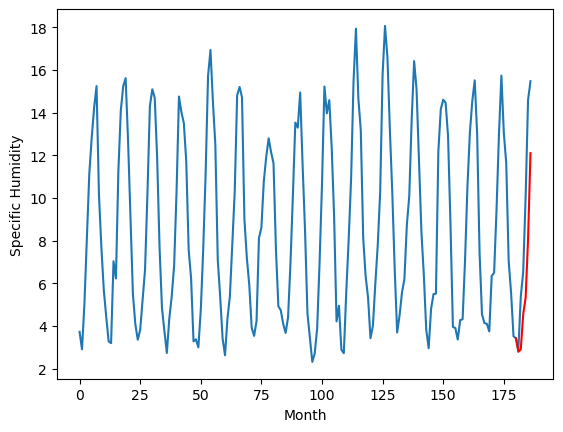

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.37		5.99		-0.38
6.31		6.11		-0.20
6.39		7.75		1.36
7.01		8.53		1.52
7.41		11.27		3.86
9.86		15.31		5.45
[180, 181, 182, 183, 184, 185, 186]
[5.43, 5.9935598748922345, 6.107156798541546, 7.75403003424406, 8.52596949070692, 11.265602574050426, 15.306063637435436]


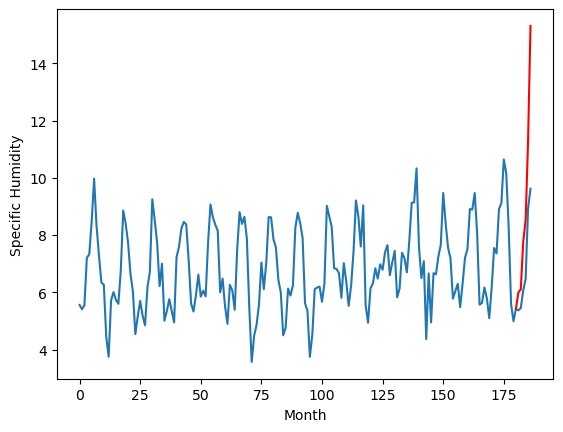

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.44		3.77		0.33
3.37		3.89		0.52
4.67		5.53		0.86
5.86		6.31		0.45
8.39		9.05		0.66
13.81		13.09		-0.72
[180, 181, 182, 183, 184, 185, 186]
[3.21, 3.77355794519186, 3.887152931690216, 5.534028193950653, 6.305967650413513, 9.045602641105653, 13.086064658164979]


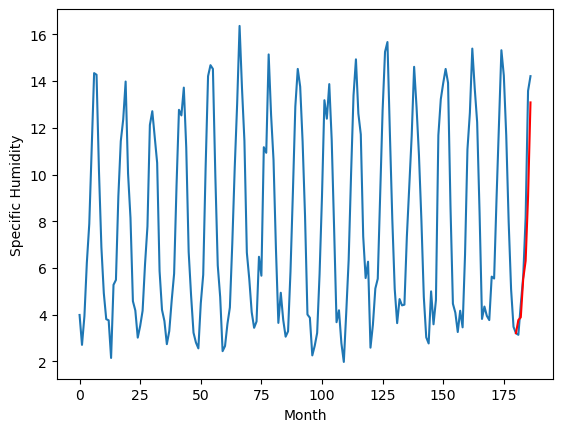

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.91		5.17		0.26
4.08		5.29		1.21
6.56		6.93		0.37
7.62		7.71		0.09
10.04		10.45		0.41
14.50		14.49		-0.01
[180, 181, 182, 183, 184, 185, 186]
[3.04, 5.1735579451918605, 5.287152931690216, 6.934028193950653, 7.7059676504135135, 10.445602641105651, 14.486064658164977]


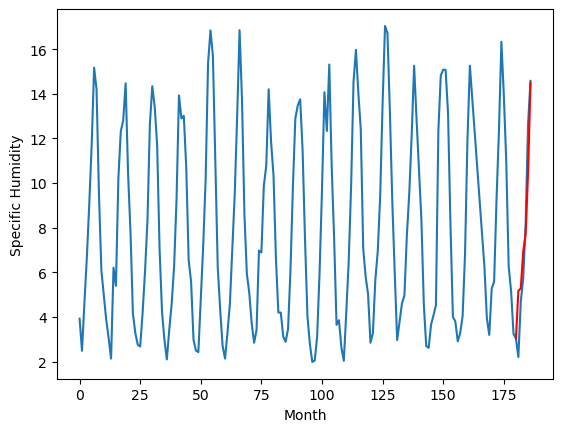

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.42		3.79		0.37
2.90		3.91		1.01
4.93		5.55		0.62
6.23		6.33		0.10
8.47		9.07		0.60
13.69		13.11		-0.58
[180, 181, 182, 183, 184, 185, 186]
[2.91, 3.79355794519186, 3.907152931690216, 5.5540281939506535, 6.325967650413514, 9.065602641105652, 13.106066565513611]


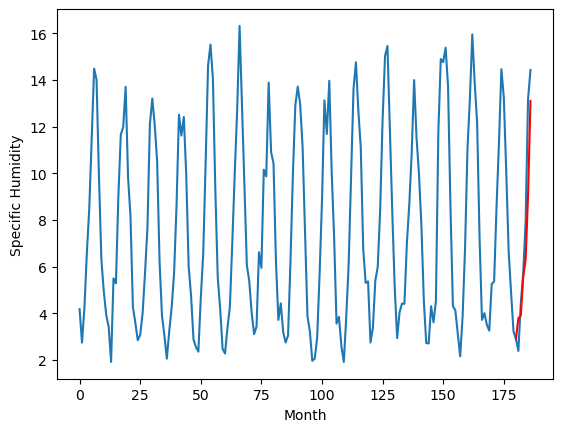

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.73		5.62		-0.11
5.79		5.74		-0.05
6.10		7.38		1.28
6.57		8.16		1.59
7.97		10.90		2.93
9.30		14.94		5.64
[180, 181, 182, 183, 184, 185, 186]
[1.6, 5.623559874892234, 5.73715486139059, 7.384028097093105, 8.155967553555964, 10.895602544248103, 14.936065514981745]


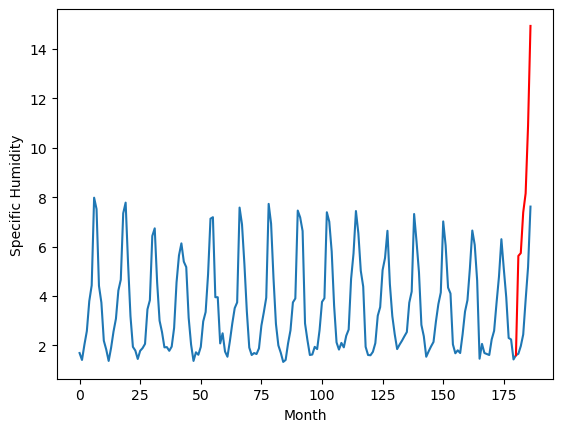

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.80		4.05		-0.75
4.32		4.17		-0.15
4.62		5.81		1.19
4.31		6.59		2.28
4.87		9.33		4.46
6.29		13.37		7.08
[180, 181, 182, 183, 184, 185, 186]
[2.86, 4.053558913767338, 4.167156805992127, 5.814030041694641, 6.585970451831818, 9.325603535175324, 13.36606555223465]


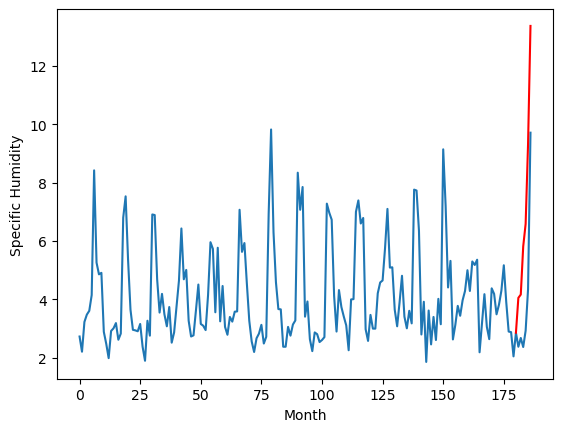

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.60		3.99		-0.61
4.25		4.11		-0.14
3.90		5.75		1.85
4.83		6.53		1.70
5.27		9.27		4.00
6.70		13.31		6.61
[180, 181, 182, 183, 184, 185, 186]
[5.65, 3.993559874892235, 4.107155829966068, 5.754029065668583, 6.525969475805759, 9.265602559149265, 13.306063622534275]


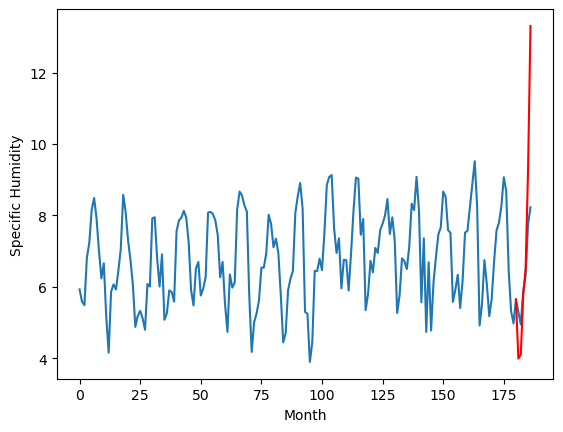

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.09		4.24		1.15
3.24		4.36		1.12
4.02		6.00		1.98
5.40		6.78		1.38
6.97		9.52		2.55
11.87		13.56		1.69
[180, 181, 182, 183, 184, 185, 186]
[2.54, 4.24355794519186, 4.357153900265693, 6.004027135968208, 6.775966592431068, 9.515601583123207, 13.55606455385685]


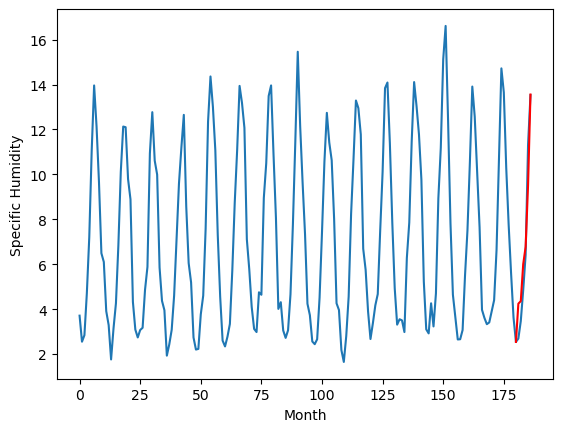

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.00		1.75		0.75
0.86		1.87		1.01
2.14		3.51		1.37
3.55		4.29		0.74
5.14		7.03		1.89
10.01		11.07		1.06
[180, 181, 182, 183, 184, 185, 186]
[2.51, 1.7535579451918601, 1.867151970565319, 3.514027232825756, 4.285966689288616, 7.025601679980754, 11.066064650714397]


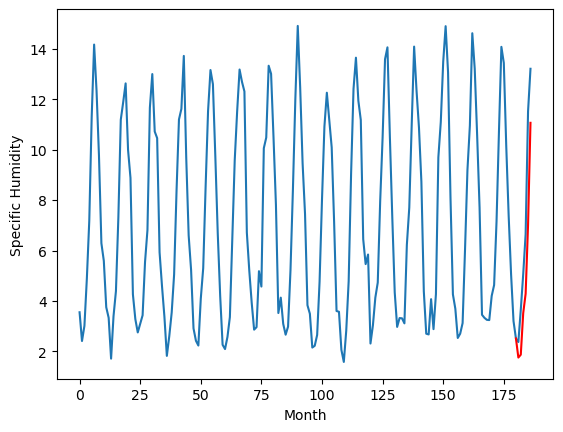

RangeIndex(start=1, stop=12, step=1)
[1.5600000000000005, 2.64, 6.369999999999998, 3.4399999999999995, 4.91, 3.42, 5.73, 4.800000000000001, 4.6, 3.09, 0.9999999999999993]
[1.7535579451918601, 2.79355794519186, 5.9935598748922345, 3.77355794519186, 5.1735579451918605, 3.79355794519186, 5.623559874892234, 4.053558913767338, 3.993559874892235, 4.24355794519186, 1.7535579451918601]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    1.56   1.753558
1                 1    2.64   2.793558
2                 2    6.37   5.993560
3                 3    3.44   3.773558
4                 4    4.91   5.173558
5                 5    3.42   3.793558
6                 6    5.73   5.623560
7                 7    4.80   4.053559
8                 8    4.60   3.993560
9                 9    3.09   4.243558
10               10    1.00   1.753558


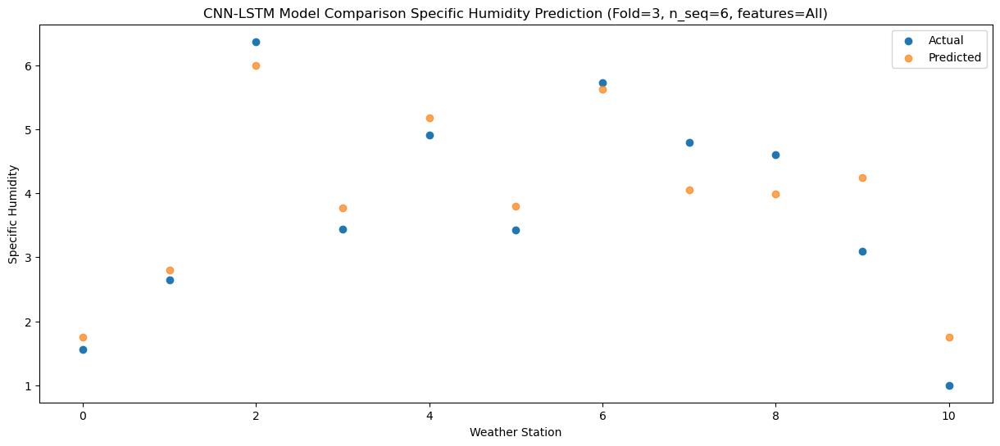

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.65   1.867153
1                 1    2.08   2.907152
2                 2    6.31   6.107157
3                 3    3.37   3.887153
4                 4    4.08   5.287153
5                 5    2.90   3.907153
6                 6    5.79   5.737155
7                 7    4.32   4.167157
8                 8    4.25   4.107156
9                 9    3.24   4.357154
10               10    0.86   1.867152


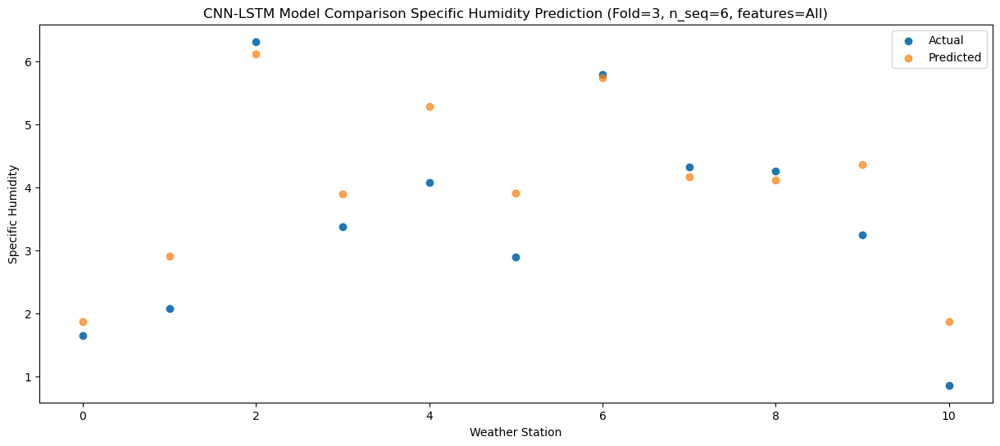

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    3.30   3.514028
1                 1    4.59   4.554026
2                 2    6.39   7.754030
3                 3    4.67   5.534028
4                 4    6.56   6.934028
5                 5    4.93   5.554028
6                 6    6.10   7.384028
7                 7    4.62   5.814030
8                 8    3.90   5.754029
9                 9    4.02   6.004027
10               10    2.14   3.514027


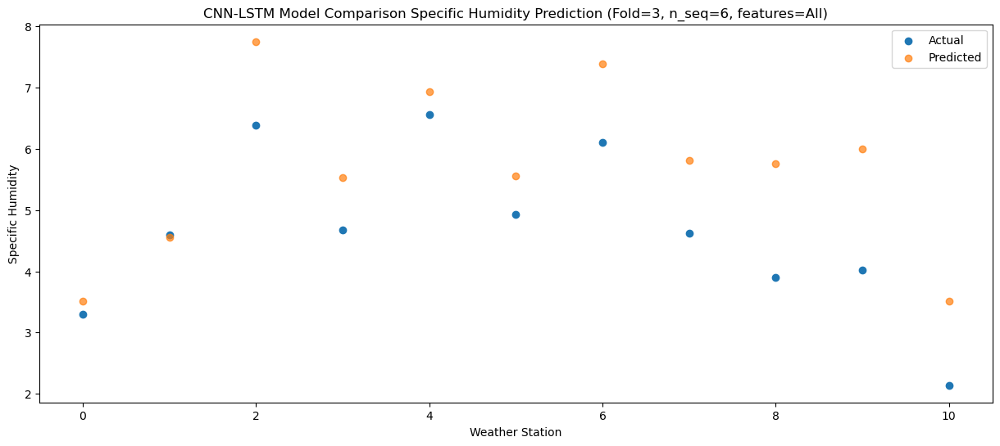

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    3.82   4.285968
1                 1    5.76   5.325966
2                 2    7.01   8.525969
3                 3    5.86   6.305968
4                 4    7.62   7.705968
5                 5    6.23   6.325968
6                 6    6.57   8.155968
7                 7    4.31   6.585970
8                 8    4.83   6.525969
9                 9    5.40   6.775967
10               10    3.55   4.285967


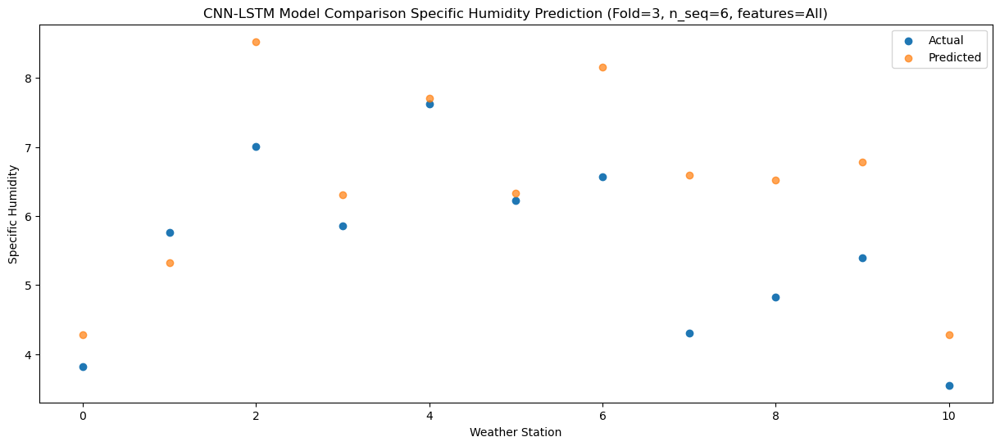

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    6.60   7.025603
1                 1    9.28   8.065603
2                 2    7.41  11.265603
3                 3    8.39   9.045603
4                 4   10.04  10.445603
5                 5    8.47   9.065603
6                 6    7.97  10.895603
7                 7    4.87   9.325604
8                 8    5.27   9.265603
9                 9    6.97   9.515602
10               10    5.14   7.025602


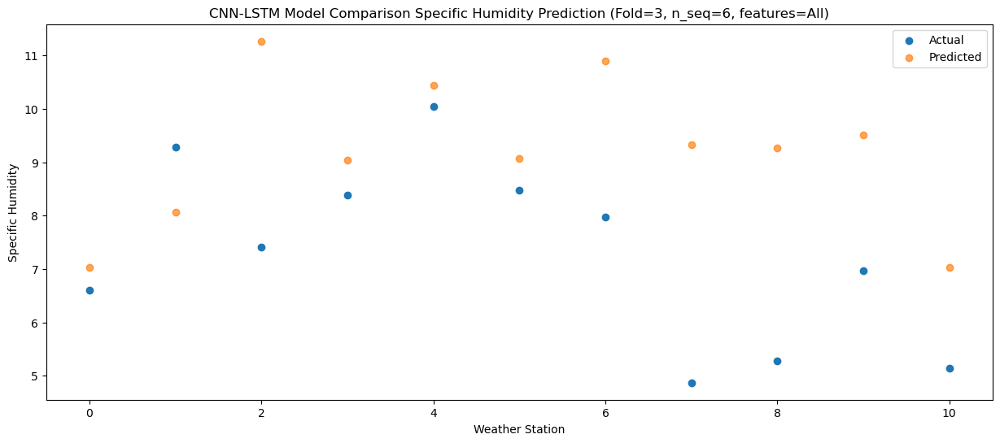

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   11.32  11.066065
1                 1   13.81  12.106067
2                 2    9.86  15.306064
3                 3   13.81  13.086065
4                 4   14.50  14.486065
5                 5   13.69  13.106067
6                 6    9.30  14.936066
7                 7    6.29  13.366066
8                 8    6.70  13.306064
9                 9   11.87  13.556065
10               10   10.01  11.066065


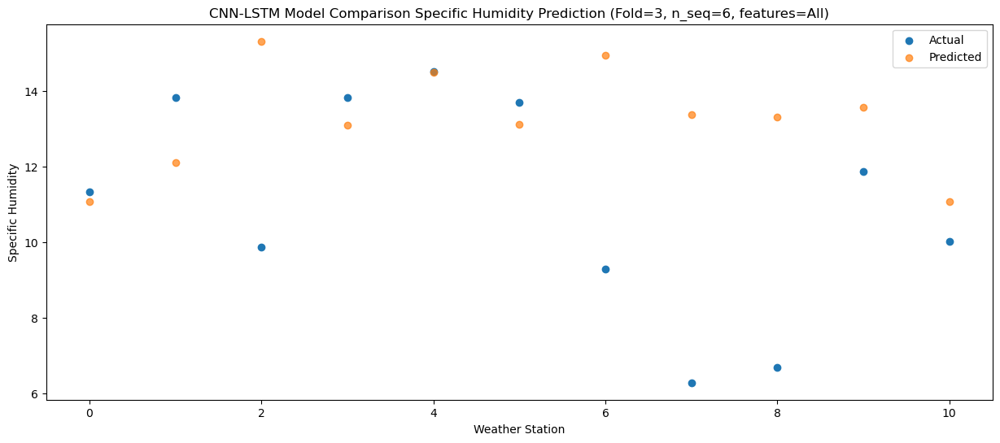

Model: "sequential_503"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_503 (Conv1D)         (None, 1, 256)            550144    
                                                                 
 max_pooling1d_503 (MaxPooli  (None, 1, 256)           0         
 ng1D)                                                           
                                                                 
 dropout_1509 (Dropout)      (None, 1, 256)            0         
                                                                 
 lstm_1006 (LSTM)            (None, 1, 1024)           5246976   
                                                                 
 dropout_1510 (Dropout)      (None, 1, 1024)           0         
                                                                 
 lstm_1007 (LSTM)            (None, 1024)              8392704   
                                                    

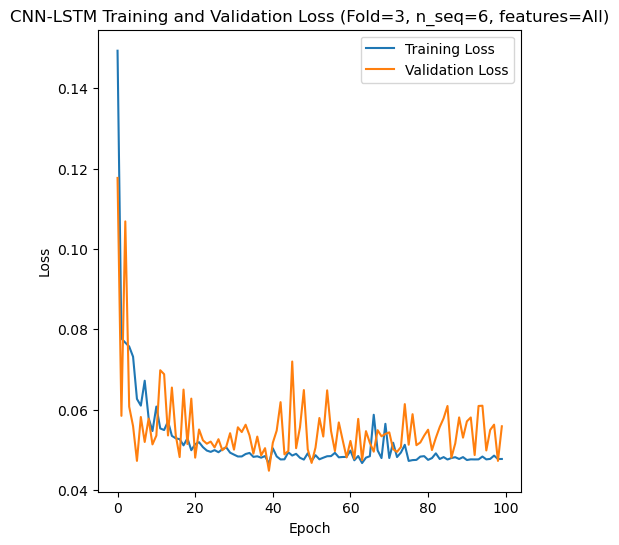

Epoch 1/100
84/84 [==============================] - 19s 72ms/step - loss: 0.1522 - val_loss: 0.1443
Epoch 2/100
84/84 [==============================] - 4s 49ms/step - loss: 0.0948 - val_loss: 0.0677
Epoch 3/100
84/84 [==============================] - 4s 48ms/step - loss: 0.0823 - val_loss: 0.1185
Epoch 4/100
84/84 [==============================] - 4s 48ms/step - loss: 0.0671 - val_loss: 0.0639
Epoch 5/100
84/84 [==============================] - 4s 52ms/step - loss: 0.0692 - val_loss: 0.0549
Epoch 6/100
84/84 [==============================] - 4s 50ms/step - loss: 0.0655 - val_loss: 0.0777
Epoch 7/100
84/84 [==============================] - 6s 72ms/step - loss: 0.0737 - val_loss: 0.0533
Epoch 8/100
84/84 [==============================] - 8s 98ms/step - loss: 0.0595 - val_loss: 0.0455
Epoch 9/100
84/84 [==============================] - 8s 93ms/step - loss: 0.0669 - val_loss: 0.0900
Epoch 10/100
84/84 [==============================] - 8s 96ms/step - loss: 0.0634 - val_loss: 0.055

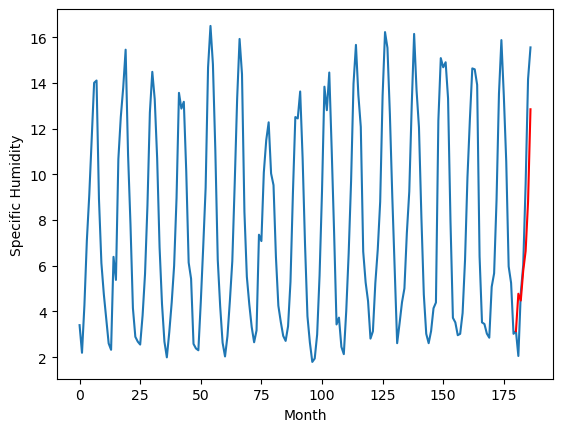

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.27		3.61		-0.66
6.26		3.36		-2.90
6.23		4.11		-2.12
6.98		4.83		-2.15
8.31		6.94		-1.37
12.60		10.08		-2.52
[180, 181, 182, 183, 184, 185, 186]
[7.79, 3.6094247829914092, 3.360931335091591, 4.112112877964973, 4.825905857682228, 6.9412592035532, 10.075734196305275]


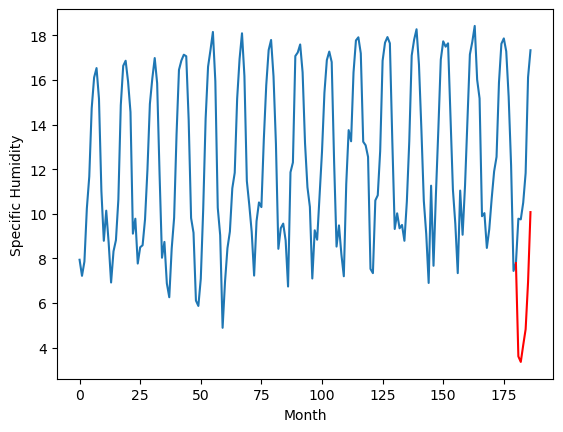

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.87		3.54		-0.33
3.75		3.24		-0.51
6.81		4.54		-2.27
7.06		5.40		-1.66
10.50		7.57		-2.93
14.74		11.61		-3.13
[180, 181, 182, 183, 184, 185, 186]
[5.03, 3.536448996067047, 3.2360405135154724, 4.536166827678681, 5.403575580120087, 7.566703717708588, 11.609885137081147]


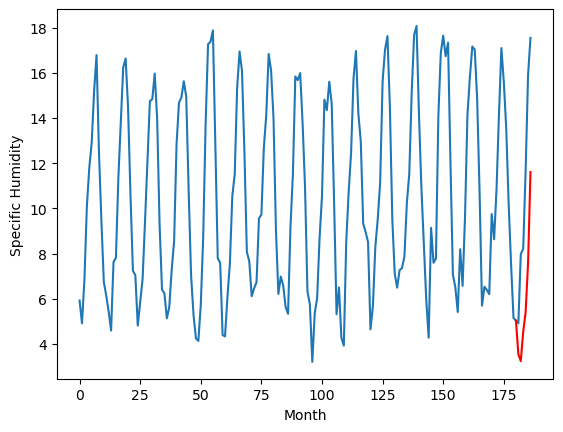

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.73		3.42		-0.31
3.41		3.13		-0.28
6.07		4.29		-1.78
7.36		5.12		-2.24
11.36		7.26		-4.10
15.05		11.07		-3.98
[180, 181, 182, 183, 184, 185, 186]
[4.41, 3.4215545320510863, 3.1296852195262908, 4.289456185102463, 5.119523700475693, 7.257840331792831, 11.066550668478012]


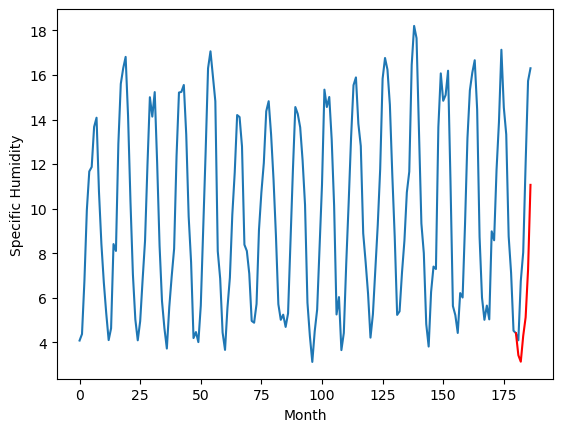

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.36		2.99		-0.37
2.91		2.71		-0.20
5.49		3.80		-1.69
6.85		4.61		-2.24
11.14		6.74		-4.40
15.02		10.44		-4.58
[180, 181, 182, 183, 184, 185, 186]
[4.29, 2.9937022268772124, 2.706080490350723, 3.7999591171741485, 4.611988359689713, 6.738193088769913, 10.43533235192299]


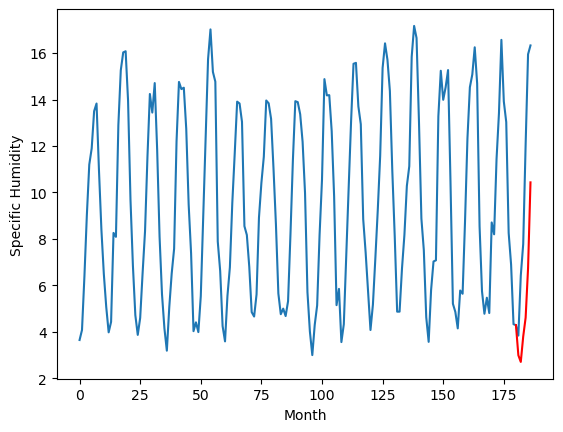

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.64		7.69		-0.95
8.00		7.47		-0.53
9.49		8.12		-1.37
10.45		8.81		-1.64
15.00		10.87		-4.13
17.30		13.87		-3.43
[180, 181, 182, 183, 184, 185, 186]
[3.47, 7.690169962644577, 7.469245898127556, 8.115975725054742, 8.813245343565942, 10.874924706816675, 13.86552123963833]


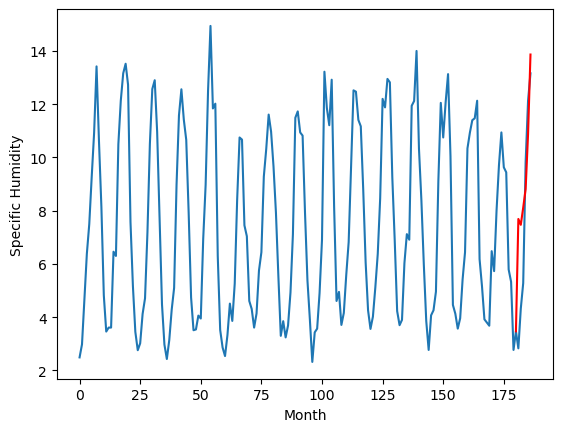

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.80		5.48		-0.32
6.05		5.19		-0.86
7.76		6.44		-1.32
8.17		7.30		-0.87
11.15		9.45		-1.70
15.84		13.42		-2.42
[180, 181, 182, 183, 184, 185, 186]
[4.52, 5.484382463693619, 5.186674220561981, 6.4407621455192565, 7.2964572739601135, 9.45212195634842, 13.419965488910675]


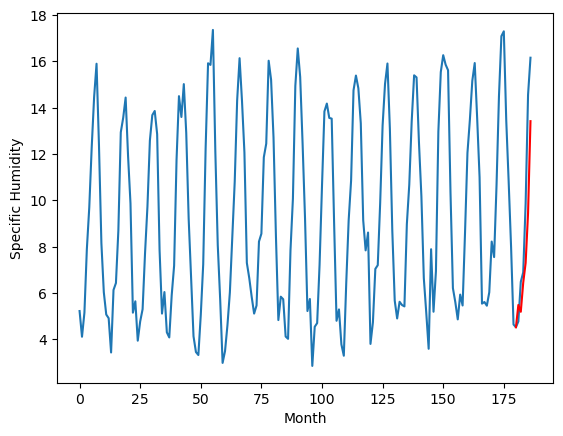

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.93		3.61		-0.32
3.30		3.29		-0.01
5.67		4.70		-0.97
6.59		5.58		-1.01
9.75		7.76		-1.99
14.35		11.98		-2.37
[180, 181, 182, 183, 184, 185, 186]
[3.4, 3.60672415971756, 3.289063857793808, 4.700078772306442, 5.584739850759506, 7.762037204504013, 11.977538989782333]


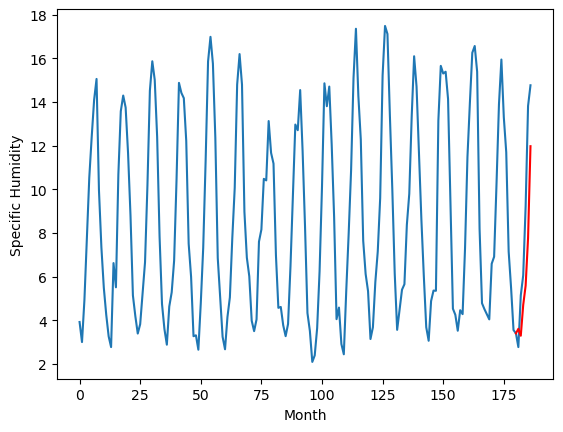

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.30		3.15		-0.15
2.73		2.83		0.10
4.67		4.29		-0.38
6.00		5.18		-0.82
8.29		7.37		-0.92
13.35		11.67		-1.68
[180, 181, 182, 183, 184, 185, 186]
[2.82, 3.154628241062164, 2.8255076348781585, 4.292338961362839, 5.184200638532639, 7.367669934034348, 11.6678003013134]


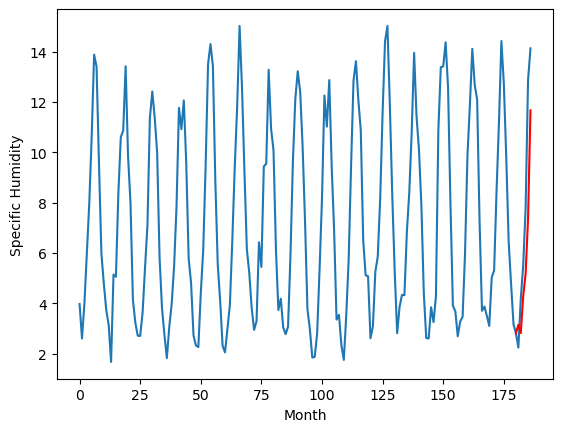

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.17		1.99		-0.18
1.53		1.66		0.13
3.90		3.14		-0.76
5.21		4.03		-1.18
7.83		6.22		-1.61
12.58		10.54		-2.04
[180, 181, 182, 183, 184, 185, 186]
[2.86, 1.9921010339260103, 1.6596464717388155, 3.1404952609539034, 4.033597310781479, 6.215262731313706, 10.537021955251694]


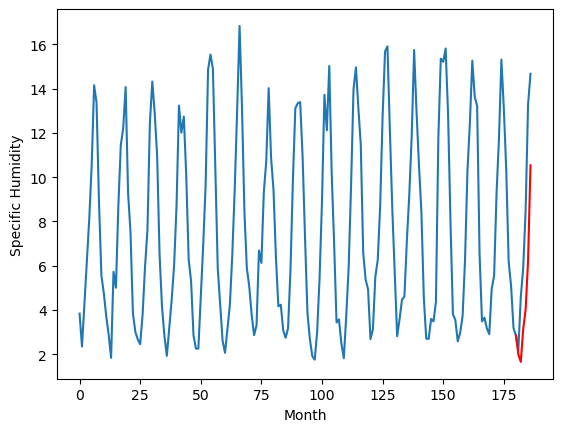

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.84		4.79		-0.05
4.27		4.49		0.22
5.56		5.73		0.17
7.23		6.58		-0.65
8.83		8.73		-0.10
13.84		12.68		-1.16
[180, 181, 182, 183, 184, 185, 186]
[2.61, 4.787185163497925, 4.490418584346771, 5.729032070636749, 6.580536158084869, 8.73335459947586, 12.675125868320464]


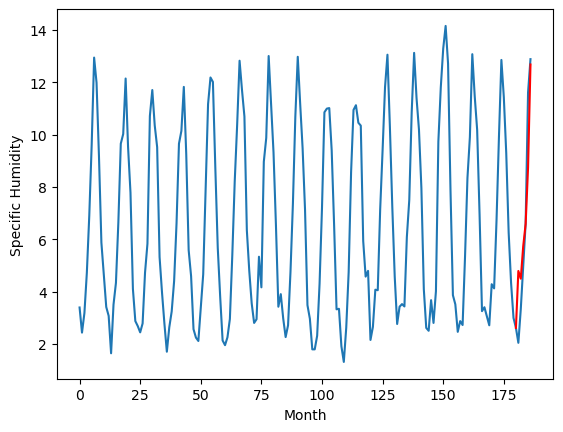

RangeIndex(start=1, stop=12, step=1)
[5.34, 4.269999999999999, 3.870000000000001, 3.7300000000000004, 3.3600000000000003, 8.64, 5.8, 3.93, 3.3000000000000003, 2.1699999999999995, 4.839999999999999]
[4.776391954421997, 3.6094247829914092, 3.536448996067047, 3.4215545320510863, 2.9937022268772124, 7.690169962644577, 5.484382463693619, 3.60672415971756, 3.154628241062164, 1.9921010339260103, 4.787185163497925]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    5.34   4.776392
1                 1    4.27   3.609425
2                 2    3.87   3.536449
3                 3    3.73   3.421555
4                 4    3.36   2.993702
5                 5    8.64   7.690170
6                 6    5.80   5.484382
7                 7    3.93   3.606724
8                 8    3.30   3.154628
9                 9    2.17   1.992101
10               10    4.84   4.787185


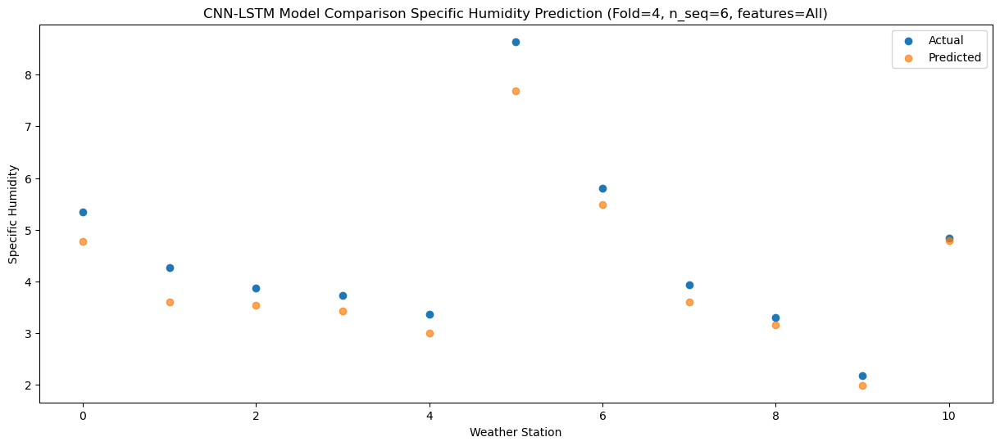

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.25   4.475964
1                 1    6.26   3.360931
2                 2    3.75   3.236041
3                 3    3.41   3.129685
4                 4    2.91   2.706080
5                 5    8.00   7.469246
6                 6    6.05   5.186674
7                 7    3.30   3.289064
8                 8    2.73   2.825508
9                 9    1.53   1.659646
10               10    4.27   4.490419


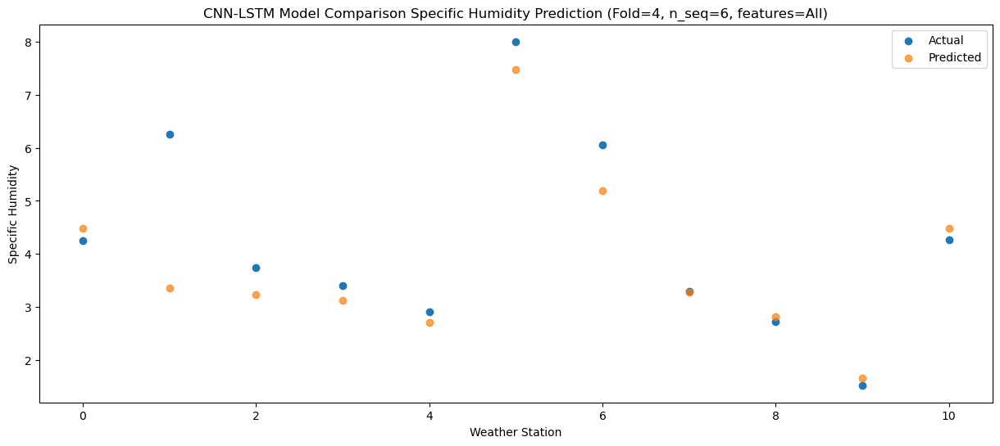

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.01   5.776428
1                 1    6.23   4.112113
2                 2    6.81   4.536167
3                 3    6.07   4.289456
4                 4    5.49   3.799959
5                 5    9.49   8.115976
6                 6    7.76   6.440762
7                 7    5.67   4.700079
8                 8    4.67   4.292339
9                 9    3.90   3.140495
10               10    5.56   5.729032


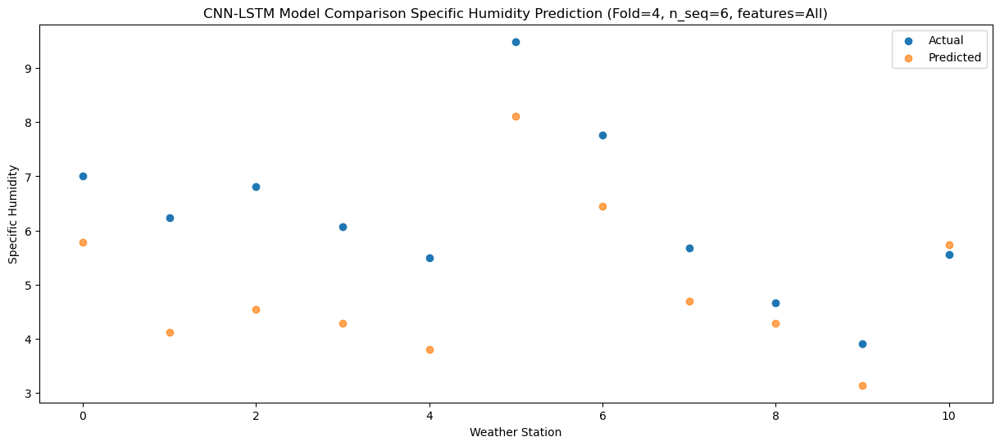

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    8.22   6.643921
1                 1    6.98   4.825906
2                 2    7.06   5.403576
3                 3    7.36   5.119524
4                 4    6.85   4.611988
5                 5   10.45   8.813245
6                 6    8.17   7.296457
7                 7    6.59   5.584740
8                 8    6.00   5.184201
9                 9    5.21   4.033597
10               10    7.23   6.580536


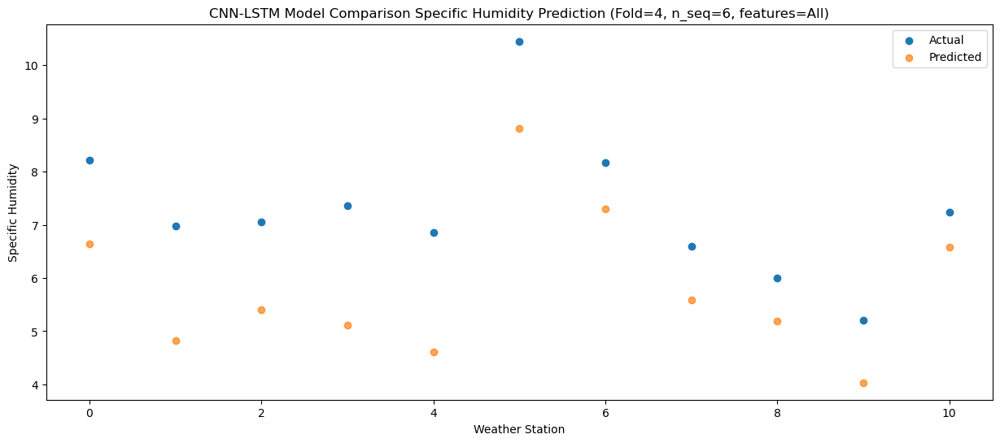

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   11.78   8.807101
1                 1    8.31   6.941259
2                 2   10.50   7.566704
3                 3   11.36   7.257840
4                 4   11.14   6.738193
5                 5   15.00  10.874925
6                 6   11.15   9.452122
7                 7    9.75   7.762037
8                 8    8.29   7.367670
9                 9    7.83   6.215263
10               10    8.83   8.733355


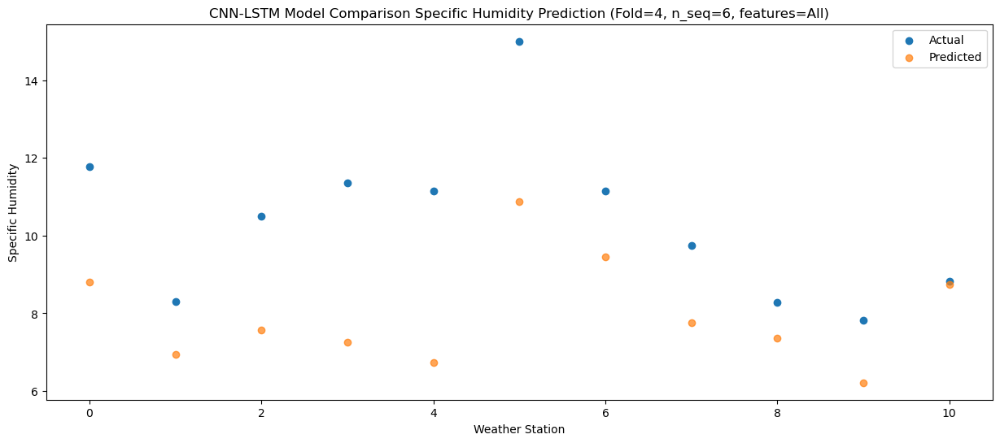

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   16.37  12.850828
1                 1   12.60  10.075734
2                 2   14.74  11.609885
3                 3   15.05  11.066551
4                 4   15.02  10.435332
5                 5   17.30  13.865521
6                 6   15.84  13.419965
7                 7   14.35  11.977539
8                 8   13.35  11.667800
9                 9   12.58  10.537022
10               10   13.84  12.675126


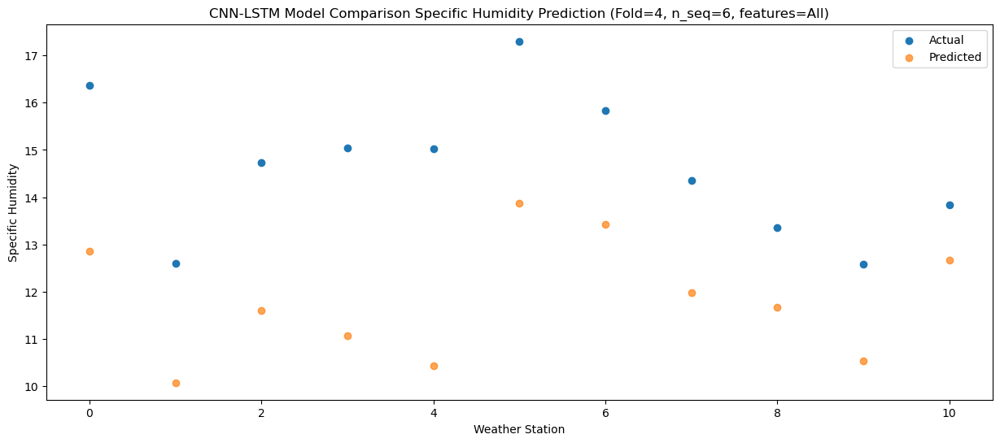

Model: "sequential_504"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_504 (Conv1D)         (None, 1, 256)            550144    
                                                                 
 max_pooling1d_504 (MaxPooli  (None, 1, 256)           0         
 ng1D)                                                           
                                                                 
 dropout_1512 (Dropout)      (None, 1, 256)            0         
                                                                 
 lstm_1008 (LSTM)            (None, 1, 1024)           5246976   
                                                                 
 dropout_1513 (Dropout)      (None, 1, 1024)           0         
                                                                 
 lstm_1009 (LSTM)            (None, 1024)              8392704   
                                                    

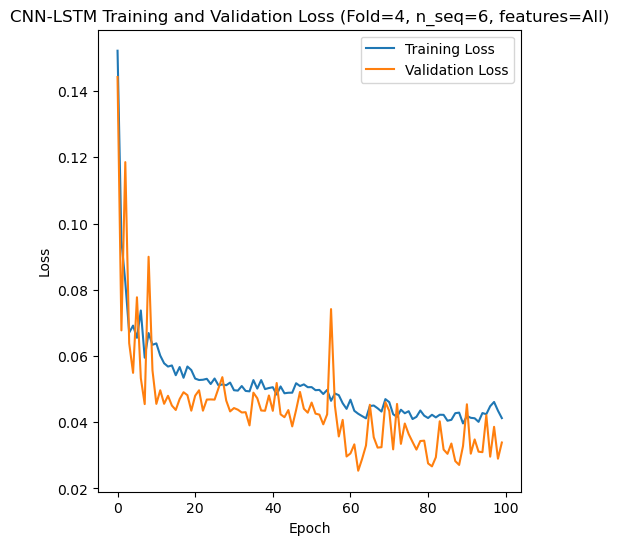

[[0.37953337645553287, 0.6430049562595741, 1.2617940382993897, 1.088845023593887, 1.8472862972008635, 1.7630505460646664], [0.4373481041237267, 0.48011677108893497, 1.160481168119975, 1.2179260322861727, 2.931181024049536, 2.9533525168520227], [0.482298099374678, 1.0654358732011302, 1.0848226207737073, 1.1970519334724194, 2.2374837105165404, 2.5555257110654495], [0.5525017524140738, 0.7274144474419619, 1.1878057421189037, 1.2032433644621177, 2.556322192097611, 3.848575147247489], [0.4529149809102716, 0.9506762190118159, 1.4308663448412646, 1.5614726559014052, 2.744214845822888, 2.970803751694476]]
[[0.2867040509527378, 0.5104296163672746, 1.0324746835638172, 0.8688759801469061, 1.5348906346478244, 1.528943930308926], [0.3839254624193367, 0.40711951984600603, 1.0465690268982544, 1.0516189172863968, 2.526025405444883, 2.7313463697379294], [0.3334105216373095, 0.7254957376555962, 0.9048912129347969, 1.0433304066278715, 1.6914153906161131, 1.8398167447881257], [0.46006064344536174, 0.58649

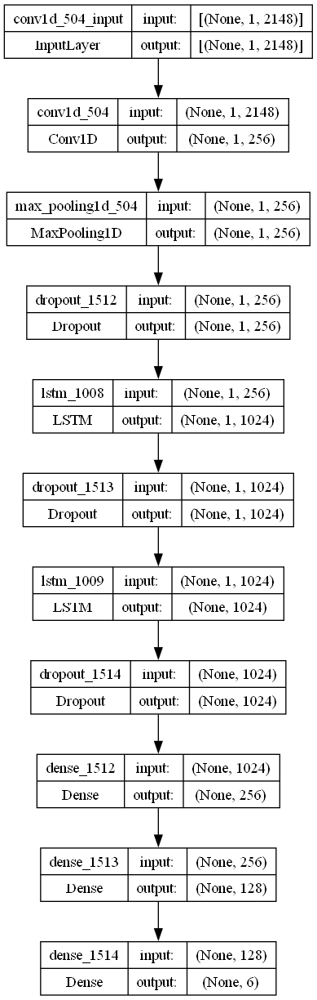

In [3]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit a CNN-LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    filters = trial.suggest_categorical('filters', [256, 512, 1024]) # Used for CNN-LSTM model
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM Only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "CNN-LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

# Make one forecast with a CNN-LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_cnnlstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_cnnlstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # Create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100

# Optimize and fit the model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)
    
rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (specific humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='CNN-LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=All)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'CNN-LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=All)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "cnnlstm_model_optimized_SH_S6.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)

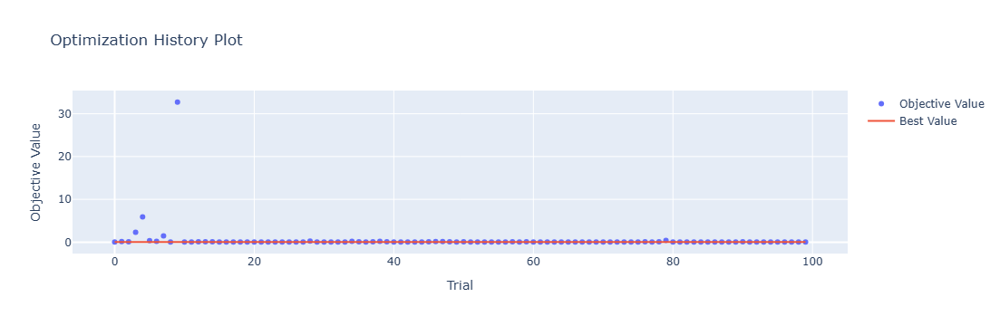

In [4]:
optuna.visualization.plot_optimization_history(study)

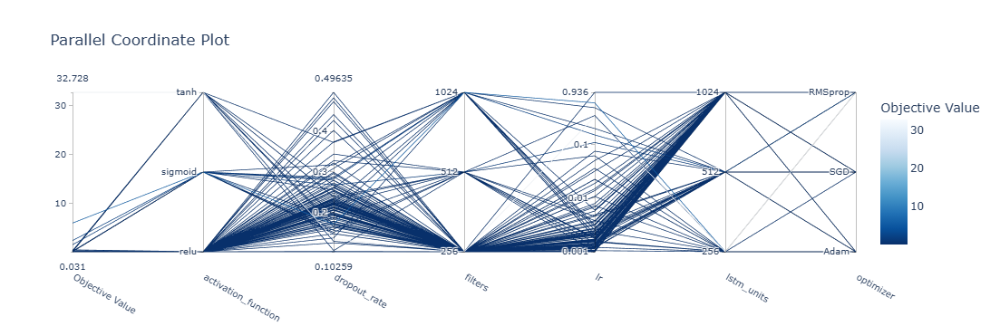

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

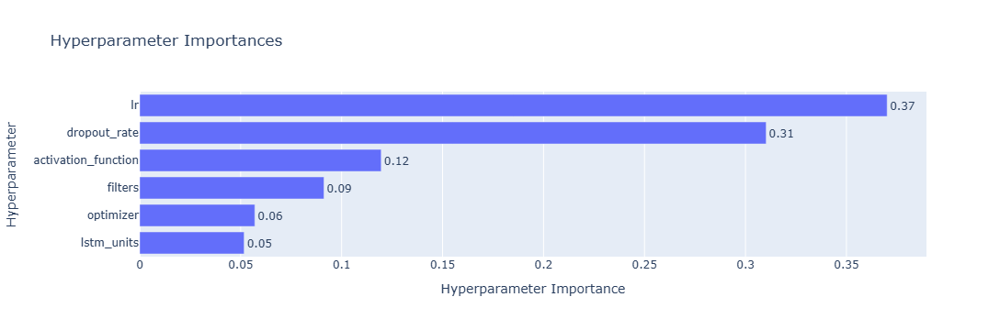

In [6]:
optuna.visualization.plot_param_importances(study)

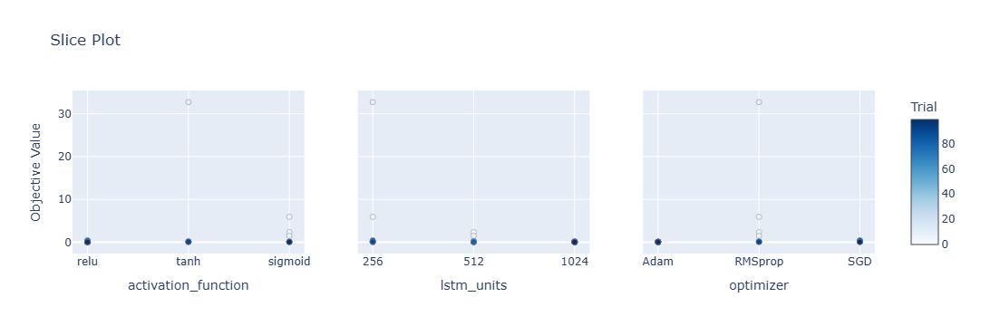

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

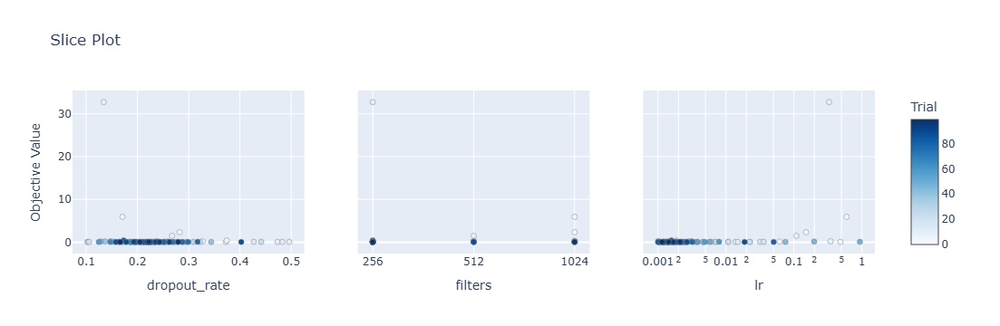

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate', 'filters'])

Epoch 1/100
84/84 [==============================] - 22s 86ms/step - loss: 0.1423 - accuracy: 0.5952 - mae: 0.1241 - rmse: 0.1423 - mape: 21.1863 - pearson: 0.5308 - val_loss: 0.0748 - val_accuracy: 0.8000 - val_mae: 0.0599 - val_rmse: 0.0748 - val_mape: 10.7713 - val_pearson: 0.7433
Epoch 2/100
84/84 [==============================] - 4s 53ms/step - loss: 0.0880 - accuracy: 0.6429 - mae: 0.0756 - rmse: 0.0880 - mape: 12.9205 - pearson: 0.6886 - val_loss: 0.0742 - val_accuracy: 0.8000 - val_mae: 0.0593 - val_rmse: 0.0742 - val_mape: 9.6541 - val_pearson: 0.7505
Epoch 3/100
84/84 [==============================] - 4s 53ms/step - loss: 0.0757 - accuracy: 0.7976 - mae: 0.0630 - rmse: 0.0757 - mape: 10.7585 - pearson: 0.7316 - val_loss: 0.0921 - val_accuracy: 0.8000 - val_mae: 0.0758 - val_rmse: 0.0921 - val_mape: 13.4904 - val_pearson: 0.7712
Epoch 4/100
84/84 [==============================] - 4s 52ms/step - loss: 0.0709 - accuracy: 0.7262 - mae: 0.0593 - rmse: 0.0709 - mape: 10.0555 - p

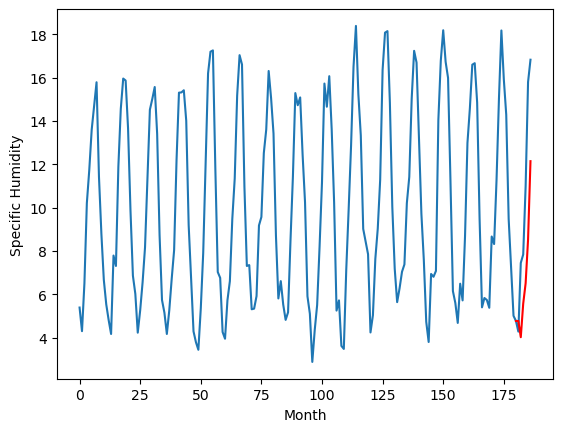

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.90		4.46		-0.44
5.61		3.72		-1.89
7.82		5.26		-2.56
8.04		6.20		-1.84
10.53		8.22		-2.31
15.28		11.83		-3.45
[180, 181, 182, 183, 184, 185, 186]
[7.05, 4.462526428699493, 3.718004810810089, 5.263087022304535, 6.199324238300323, 8.216520655155183, 11.827089893817902]


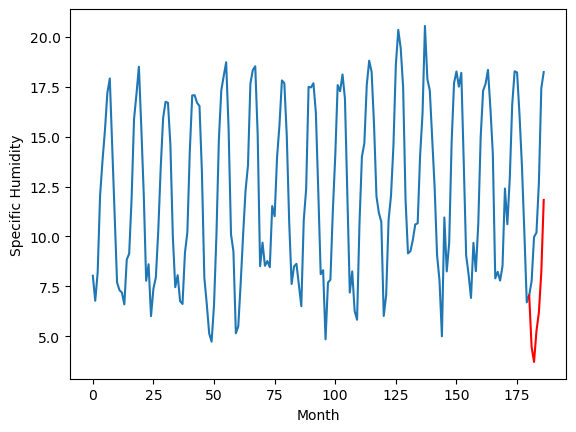

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.82		4.35		-0.47
4.97		3.60		-1.37
6.82		5.15		-1.67
7.06		6.09		-0.97
9.82		8.11		-1.71
14.44		11.73		-2.71
[180, 181, 182, 183, 184, 185, 186]
[5.06, 4.349220010042191, 3.601749213933945, 5.150484832525254, 6.091323944330216, 8.105311485528947, 11.725871654748918]


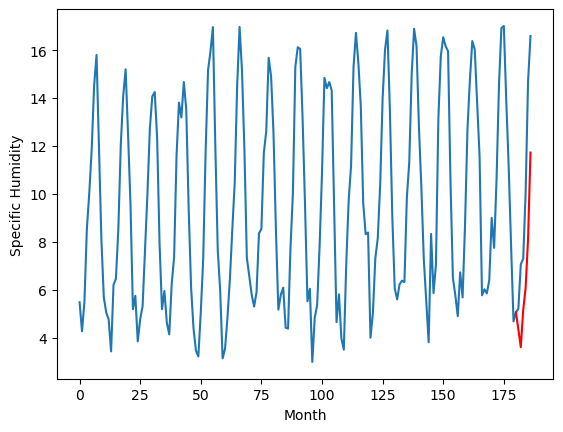

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.21		4.05		-0.16
4.12		3.31		-0.81
7.57		4.85		-2.72
8.14		5.79		-2.35
11.65		7.81		-3.84
15.55		11.42		-4.13
[180, 181, 182, 183, 184, 185, 186]
[7.05, 4.052243157625198, 3.307461961507797, 4.852839931249618, 5.789446457624435, 7.806332453489303, 11.417711838483811]


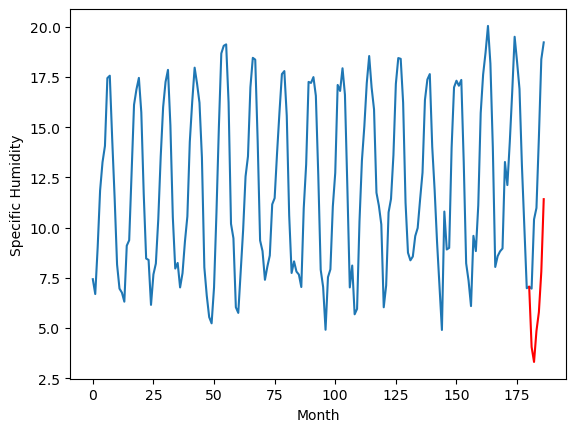

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.32		5.30		-0.02
4.92		4.56		-0.36
7.76		6.10		-1.66
9.16		7.04		-2.12
13.17		9.06		-4.11
16.86		12.67		-4.19
[180, 181, 182, 183, 184, 185, 186]
[5.2, 5.303080394268036, 4.559167876243591, 6.103871121406555, 7.039691641330719, 9.057895376682282, 12.6674515748024]


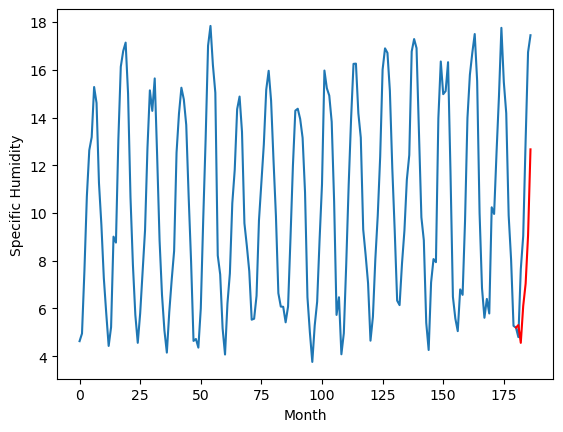

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.42		7.94		0.52
8.01		7.19		-0.82
9.58		8.74		-0.84
10.59		9.68		-0.91
13.09		11.70		-1.39
18.35		15.32		-3.03
[180, 181, 182, 183, 184, 185, 186]
[5.16, 7.938785924315452, 7.190930857062339, 8.74014605462551, 9.681591345667838, 11.695165230631828, 15.31704123198986]


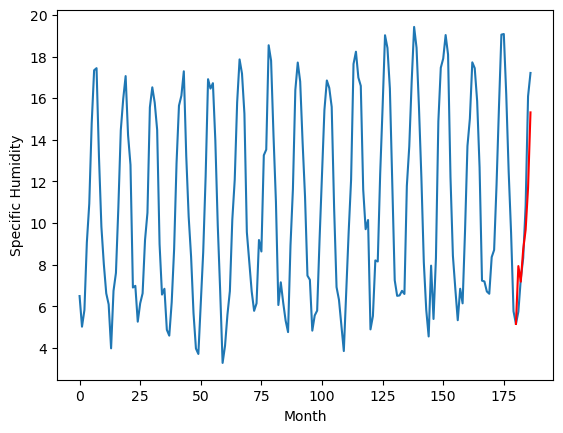

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.33		5.39		0.06
5.38		4.64		-0.74
6.97		6.19		-0.78
7.57		7.13		-0.44
10.57		9.15		-1.42
14.95		12.77		-2.18
[180, 181, 182, 183, 184, 185, 186]
[4.05, 5.388633172512055, 4.640640835762024, 6.190027098655701, 7.131688992977143, 9.145113866329194, 12.767456691265107]


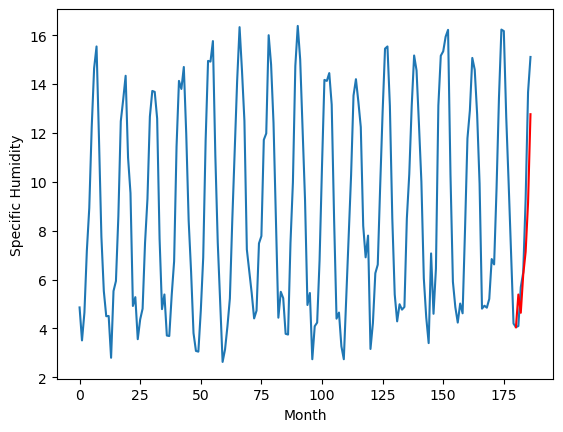

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.12		7.34		0.22
7.15		6.59		-0.56
8.77		8.14		-0.63
9.47		9.08		-0.39
12.49		11.09		-1.40
16.76		14.72		-2.04
[180, 181, 182, 183, 184, 185, 186]
[3.64, 7.3365371751785275, 6.586681299209594, 8.138393692970276, 9.082989745140075, 11.094403796195984, 14.72311192035675]


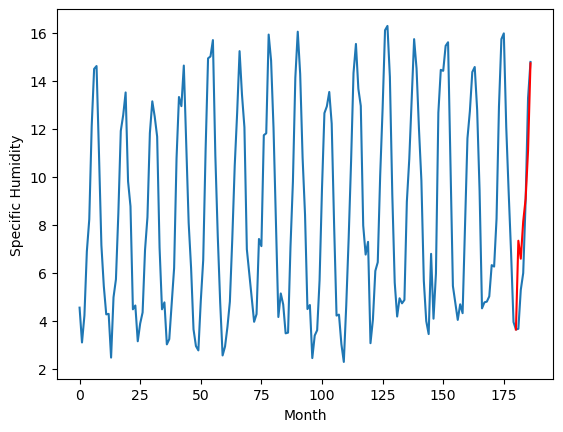

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.40		4.53		0.13
3.72		3.78		0.06
6.78		5.34		-1.44
7.51		6.28		-1.23
10.42		8.29		-2.13
15.40		11.93		-3.47
[180, 181, 182, 183, 184, 185, 186]
[3.46, 4.533933621942997, 3.7817637744545936, 5.336366874277592, 6.284606737196445, 8.293526453077792, 11.930140060484408]


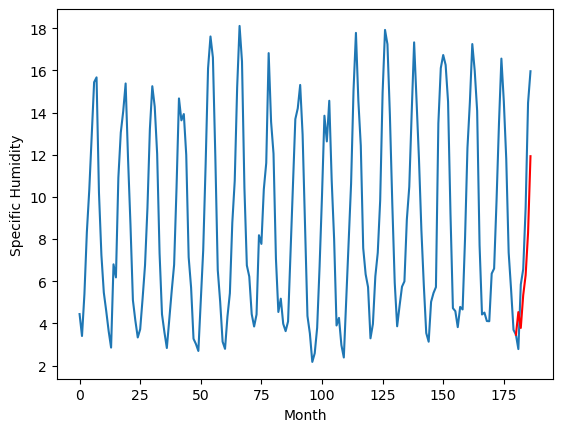

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.17		6.40		0.23
5.72		5.65		-0.07
7.52		7.20		-0.32
8.84		8.16		-0.68
10.93		10.16		-0.77
15.70		13.81		-1.89
[180, 181, 182, 183, 184, 185, 186]
[2.93, 6.4008708372712135, 5.645977057516575, 7.20398036390543, 8.156508900225163, 10.162491537630558, 13.808408476412296]


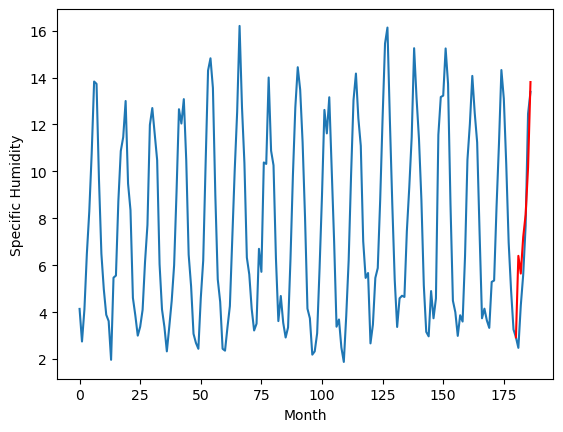

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.48		4.76		0.28
3.74		4.01		0.27
5.36		5.56		0.20
6.96		6.52		-0.44
8.48		8.52		0.04
13.61		12.17		-1.44
[180, 181, 182, 183, 184, 185, 186]
[2.74, 4.761071928441525, 4.006357499063015, 5.564136453568936, 6.516381748616696, 8.522557743489742, 12.167860754430293]


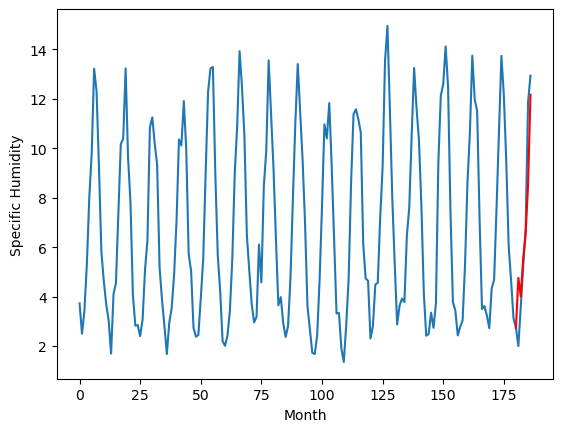

RangeIndex(start=1, stop=12, step=1)
[4.62, 4.899999999999999, 4.820000000000001, 4.209999999999998, 5.32, 7.42, 5.33, 7.119999999999999, 4.4, 6.170000000000001, 4.48]
[4.768811062574387, 4.462526428699493, 4.349220010042191, 4.052243157625198, 5.303080394268036, 7.938785924315452, 5.388633172512055, 7.3365371751785275, 4.533933621942997, 6.4008708372712135, 4.761071928441525]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.62   4.768811
1                 1    4.90   4.462526
2                 2    4.82   4.349220
3                 3    4.21   4.052243
4                 4    5.32   5.303080
5                 5    7.42   7.938786
6                 6    5.33   5.388633
7                 7    7.12   7.336537
8                 8    4.40   4.533934
9                 9    6.17   6.400871
10               10    4.48   4.761072


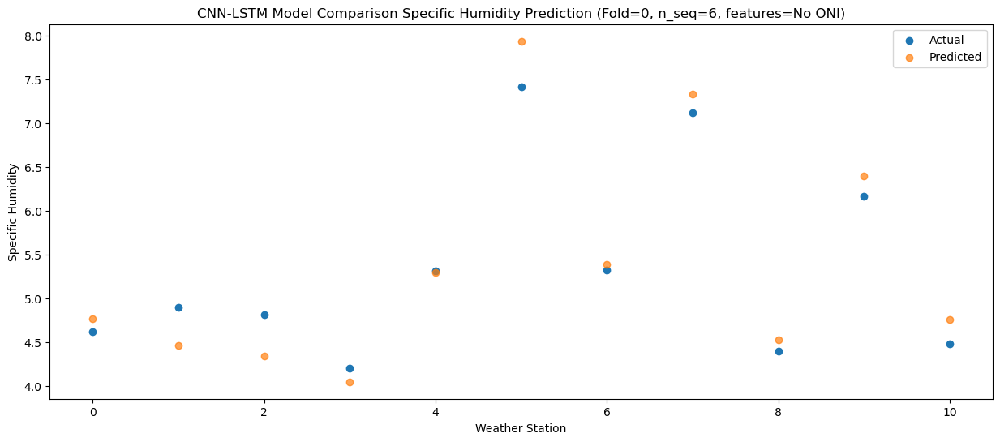

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.13   4.020978
1                 1    5.61   3.718005
2                 2    4.97   3.601749
3                 3    4.12   3.307462
4                 4    4.92   4.559168
5                 5    8.01   7.190931
6                 6    5.38   4.640641
7                 7    7.15   6.586681
8                 8    3.72   3.781764
9                 9    5.72   5.645977
10               10    3.74   4.006357


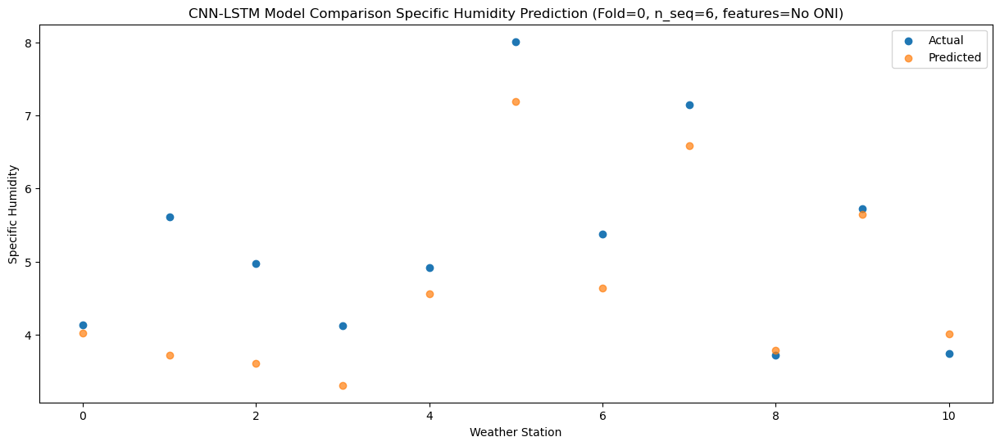

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.30   5.570165
1                 1    7.82   5.263087
2                 2    6.82   5.150485
3                 3    7.57   4.852840
4                 4    7.76   6.103871
5                 5    9.58   8.740146
6                 6    6.97   6.190027
7                 7    8.77   8.138394
8                 8    6.78   5.336367
9                 9    7.52   7.203980
10               10    5.36   5.564136


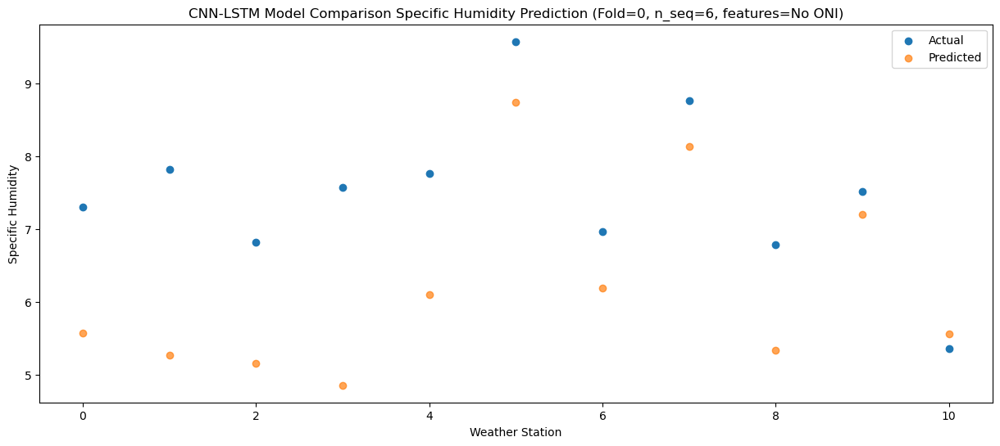

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.69   6.511577
1                 1    8.04   6.199324
2                 2    7.06   6.091324
3                 3    8.14   5.789446
4                 4    9.16   7.039692
5                 5   10.59   9.681591
6                 6    7.57   7.131689
7                 7    9.47   9.082990
8                 8    7.51   6.284607
9                 9    8.84   8.156509
10               10    6.96   6.516382


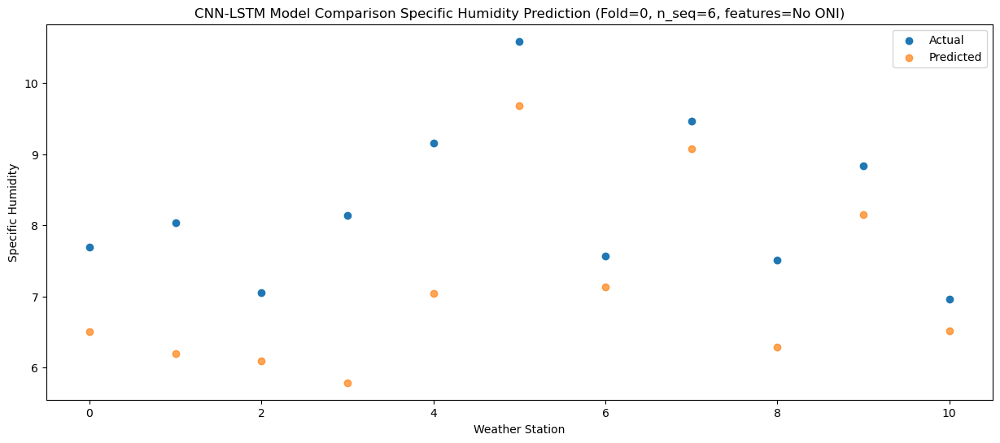

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.84   8.525173
1                 1   10.53   8.216521
2                 2    9.82   8.105311
3                 3   11.65   7.806332
4                 4   13.17   9.057895
5                 5   13.09  11.695165
6                 6   10.57   9.145114
7                 7   12.49  11.094404
8                 8   10.42   8.293526
9                 9   10.93  10.162492
10               10    8.48   8.522558


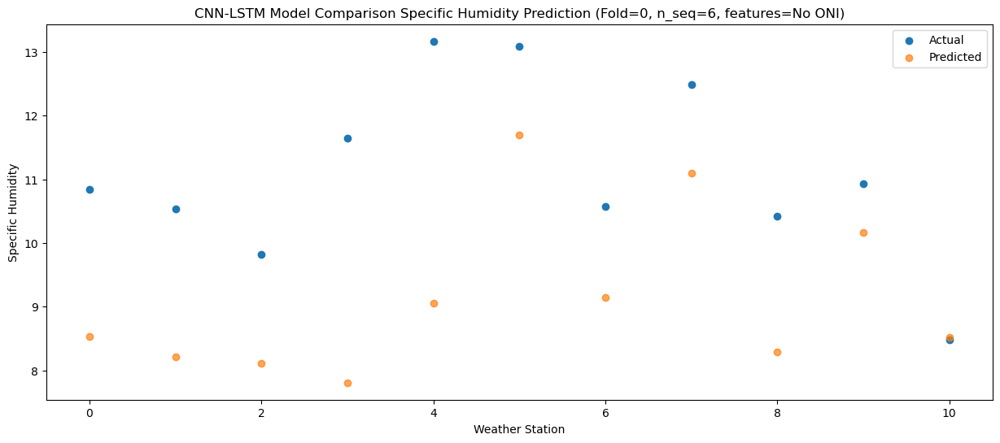

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   15.65  12.146973
1                 1   15.28  11.827090
2                 2   14.44  11.725872
3                 3   15.55  11.417712
4                 4   16.86  12.667452
5                 5   18.35  15.317041
6                 6   14.95  12.767457
7                 7   16.76  14.723112
8                 8   15.40  11.930140
9                 9   15.70  13.808408
10               10   13.61  12.167861


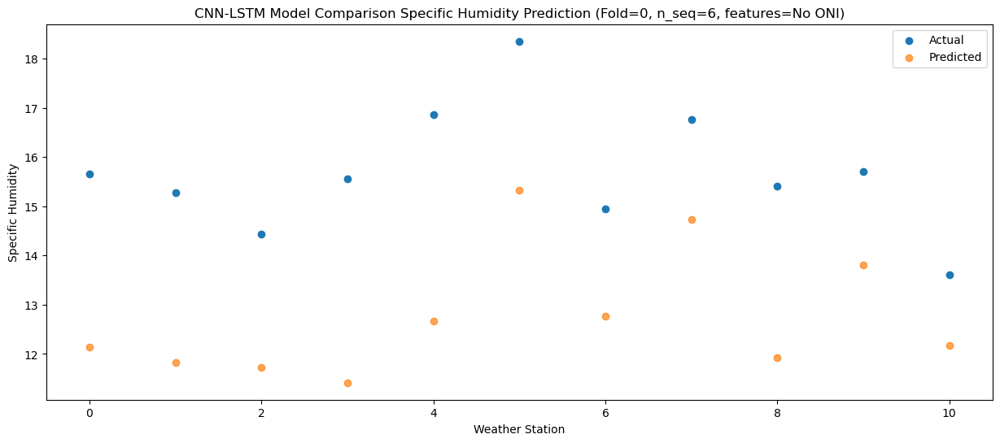

Model: "sequential_510"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_510 (Conv1D)         (None, 1, 256)            550144    
                                                                 
 max_pooling1d_510 (MaxPooli  (None, 1, 256)           0         
 ng1D)                                                           
                                                                 
 dropout_1530 (Dropout)      (None, 1, 256)            0         
                                                                 
 lstm_1020 (LSTM)            (None, 1, 1024)           5246976   
                                                                 
 dropout_1531 (Dropout)      (None, 1, 1024)           0         
                                                                 
 lstm_1021 (LSTM)            (None, 1024)              8392704   
                                                    

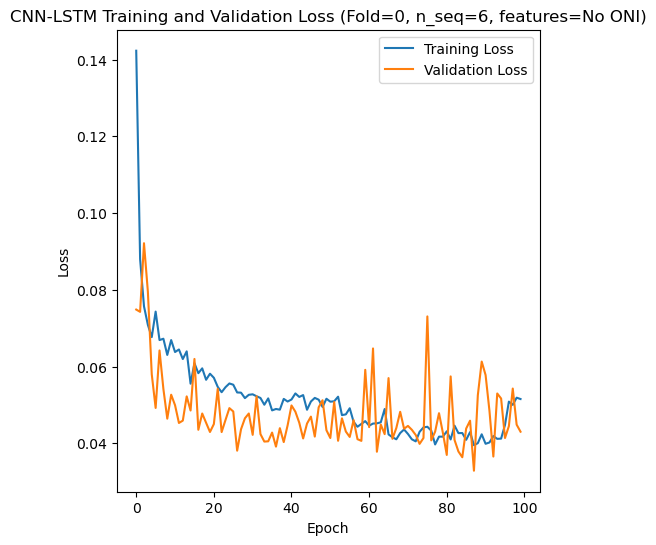

Epoch 1/100
84/84 [==============================] - 10s 66ms/step - loss: 0.1356 - accuracy: 0.6786 - mae: 0.1175 - rmse: 0.1356 - mape: 20.1127 - pearson: 0.5620 - val_loss: 0.0775 - val_accuracy: 0.7000 - val_mae: 0.0642 - val_rmse: 0.0775 - val_mape: 10.9336 - val_pearson: 0.4833
Epoch 2/100
84/84 [==============================] - 4s 49ms/step - loss: 0.0846 - accuracy: 0.7381 - mae: 0.0708 - rmse: 0.0846 - mape: 11.9559 - pearson: 0.6560 - val_loss: 0.0692 - val_accuracy: 0.7000 - val_mae: 0.0579 - val_rmse: 0.0692 - val_mape: 10.0864 - val_pearson: 0.6989
Epoch 3/100
84/84 [==============================] - 4s 52ms/step - loss: 0.0835 - accuracy: 0.8095 - mae: 0.0717 - rmse: 0.0835 - mape: 12.2098 - pearson: 0.7517 - val_loss: 0.0702 - val_accuracy: 0.7000 - val_mae: 0.0567 - val_rmse: 0.0702 - val_mape: 9.6105 - val_pearson: 0.5798
Epoch 4/100
84/84 [==============================] - 4s 48ms/step - loss: 0.0754 - accuracy: 0.8452 - mae: 0.0639 - rmse: 0.0754 - mape: 10.8125 - p

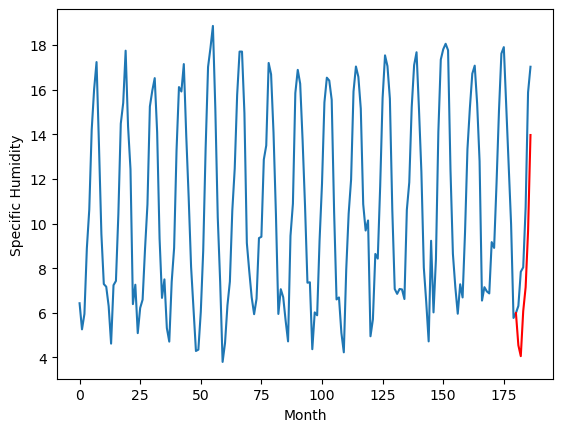

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.34		4.06		-0.28
4.53		3.57		-0.96
6.06		5.59		-0.47
6.42		6.66		0.24
9.34		9.18		-0.16
13.32		13.49		0.17
[180, 181, 182, 183, 184, 185, 186]
[4.15, 4.0572459769248965, 3.5688220334053042, 5.587791569232941, 6.659631378650666, 9.175569183826447, 13.489670403003693]


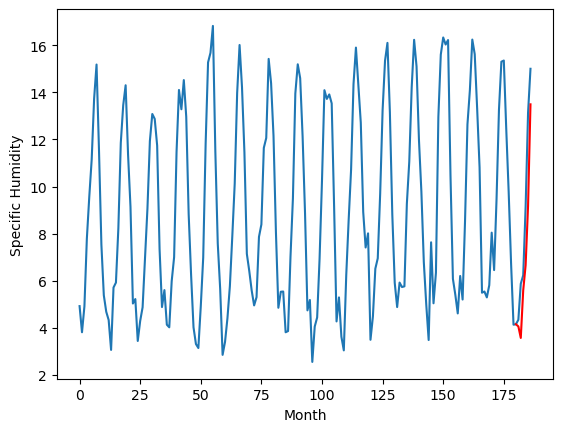

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.22		2.81		-0.41
3.22		2.32		-0.90
5.84		4.34		-1.50
5.55		5.41		-0.14
8.39		7.93		-0.46
12.91		12.24		-0.67
[180, 181, 182, 183, 184, 185, 186]
[5.12, 2.8073445630073546, 2.318791068792343, 4.339125550985337, 5.410694636106491, 7.927870072126389, 12.242739952802658]


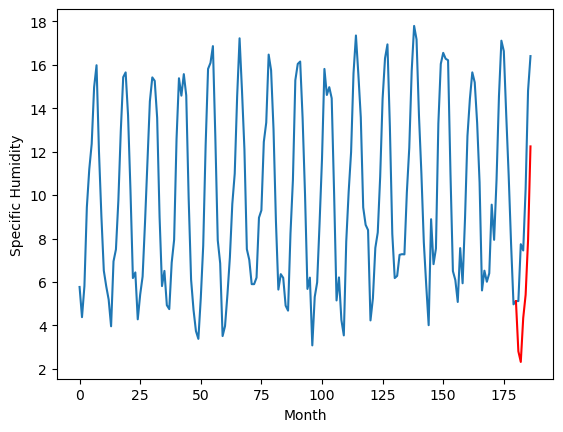

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.03		2.11		0.08
2.10		1.62		-0.48
4.74		3.64		-1.10
6.08		4.71		-1.37
9.97		7.22		-2.75
13.16		11.54		-1.62
[180, 181, 182, 183, 184, 185, 186]
[6.35, 2.1071599078178407, 1.6188476037979127, 3.63663076877594, 4.708704466819763, 7.223569149971008, 11.53700327396393]


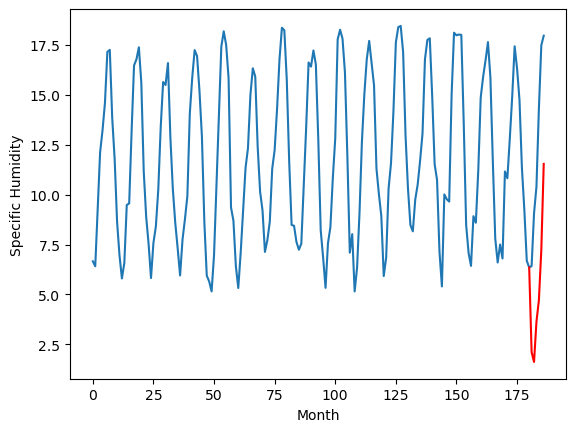

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.18		6.17		-0.01
6.22		5.68		-0.54
8.94		7.70		-1.24
10.20		8.77		-1.43
14.23		11.29		-2.94
17.64		15.60		-2.04
[180, 181, 182, 183, 184, 185, 186]
[6.08, 6.16724016547203, 5.6788224804401395, 7.697721444368362, 8.76957377076149, 11.285449825525284, 15.599511467218399]


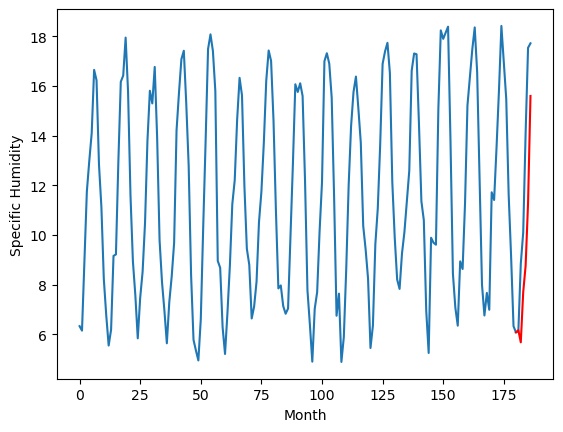

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.75		4.66		-1.09
5.12		4.17		-0.95
5.91		6.18		0.27
7.21		7.25		0.04
11.52		9.75		-1.77
13.69		14.06		0.37
[180, 181, 182, 183, 184, 185, 186]
[3.92, 4.65631688952446, 4.169108672142029, 6.175224585533142, 7.249607009887695, 9.753905696868896, 14.060769958496094]


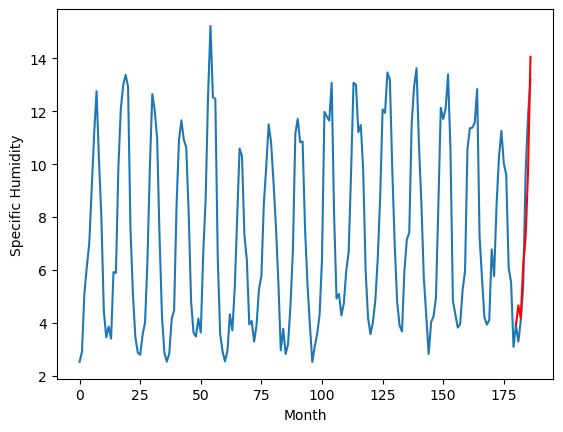

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.66		5.51		-0.15
5.78		5.02		-0.76
7.34		7.04		-0.30
7.96		8.11		0.15
10.89		10.62		-0.27
15.24		14.94		-0.30
[180, 181, 182, 183, 184, 185, 186]
[4.16, 5.507196654081344, 5.018835533857345, 7.037127245664596, 8.109100450277328, 10.62442528128624, 14.938145030736923]


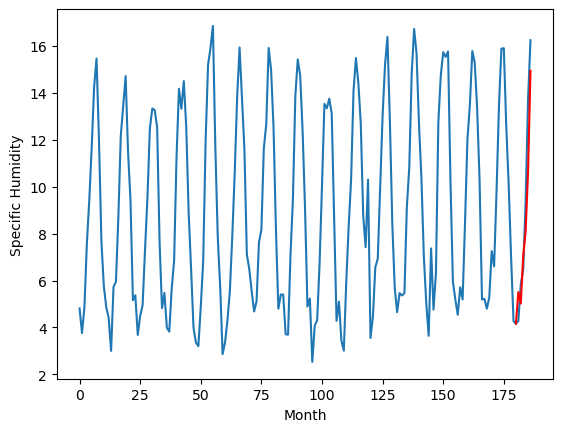

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.53		6.40		-0.13
6.01		5.91		-0.10
8.74		7.93		-0.81
9.97		9.00		-0.97
13.18		11.52		-1.66
17.94		15.84		-2.10
[180, 181, 182, 183, 184, 185, 186]
[3.84, 6.3975901341438295, 5.908715162277222, 7.9324430561065675, 9.00334123134613, 11.52358916759491, 15.8403697347641]


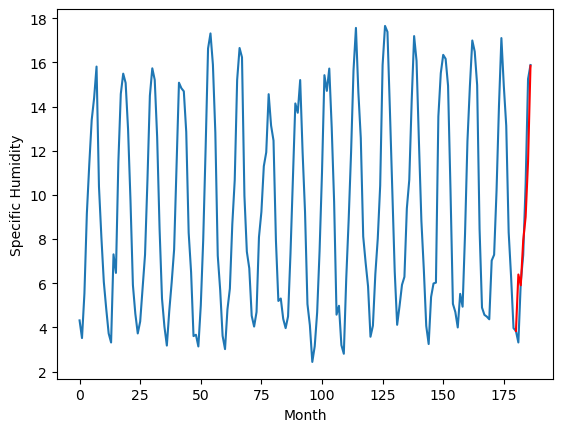

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.49		6.07		-0.42
5.68		5.58		-0.10
8.29		7.60		-0.69
9.45		8.67		-0.78
13.67		11.19		-2.48
16.81		15.50		-1.31
[180, 181, 182, 183, 184, 185, 186]
[3.73, 6.067248867750168, 5.578821049928665, 7.597830163240433, 8.669663177728653, 11.185639845132828, 15.499762521982193]


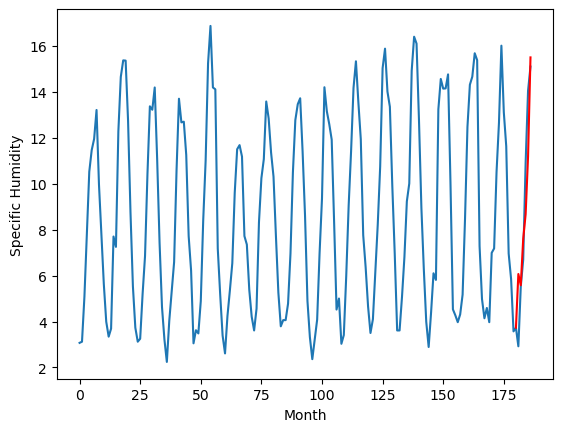

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.71		2.26		-0.45
1.97		1.77		-0.20
3.79		3.78		-0.01
3.96		4.85		0.89
9.11		7.36		-1.75
12.10		11.67		-0.43
[180, 181, 182, 183, 184, 185, 186]
[2.83, 2.256535370349884, 1.7690404844284058, 3.7781835985183716, 4.85196473121643, 7.359005231857299, 11.667574663162231]


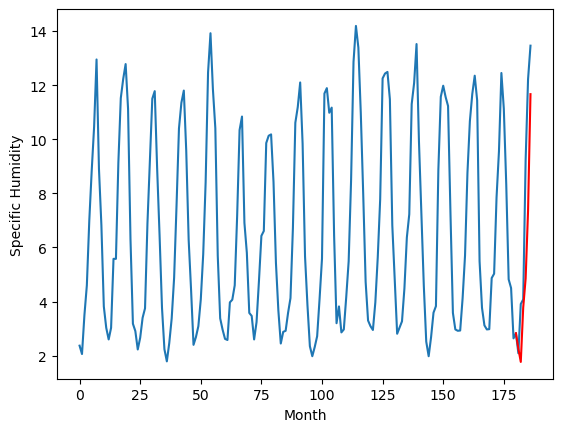

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.08		4.55		0.47
4.12		4.06		-0.06
5.36		6.07		0.71
6.73		7.14		0.41
8.26		9.65		1.39
13.58		13.96		0.38
[180, 181, 182, 183, 184, 185, 186]
[2.69, 4.546675560474395, 4.058998463153839, 6.070062515735626, 7.143463609218597, 9.652245280742644, 13.961894748210906]


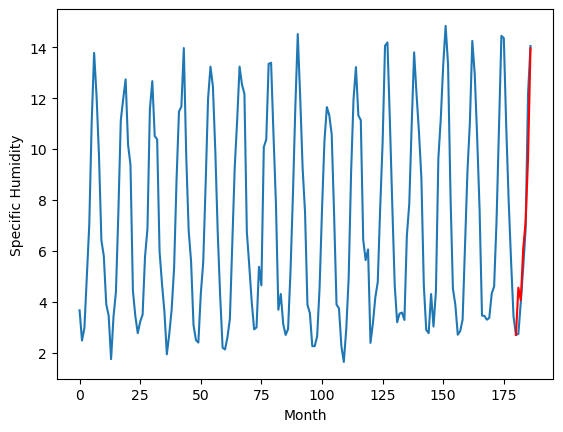

RangeIndex(start=1, stop=12, step=1)
[5.03, 4.340000000000002, 3.2199999999999998, 2.0299999999999994, 6.18, 5.75, 5.66, 6.529999999999999, 6.49, 2.7100000000000004, 4.079999999999999]
[4.546957848072052, 4.0572459769248965, 2.8073445630073546, 2.1071599078178407, 6.16724016547203, 4.65631688952446, 5.507196654081344, 6.3975901341438295, 6.067248867750168, 2.256535370349884, 4.546675560474395]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    5.03   4.546958
1                 1    4.34   4.057246
2                 2    3.22   2.807345
3                 3    2.03   2.107160
4                 4    6.18   6.167240
5                 5    5.75   4.656317
6                 6    5.66   5.507197
7                 7    6.53   6.397590
8                 8    6.49   6.067249
9                 9    2.71   2.256535
10               10    4.08   4.546676


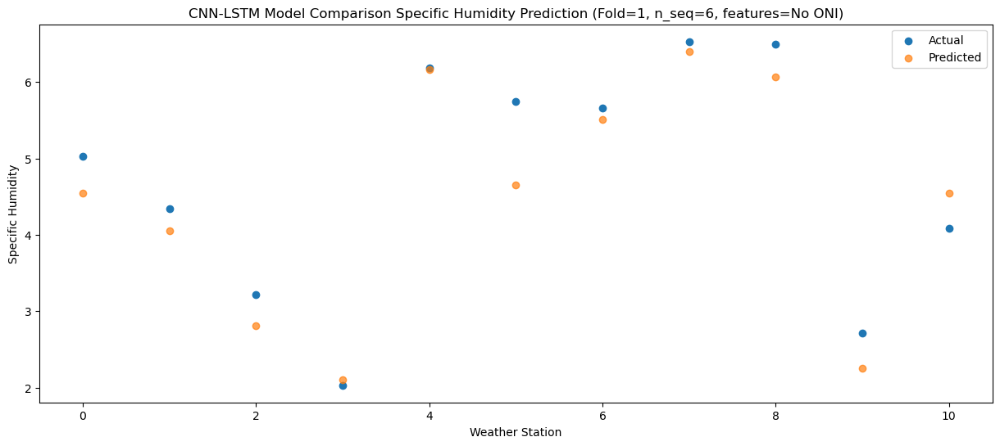

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    5.35   4.058912
1                 1    4.53   3.568822
2                 2    3.22   2.318791
3                 3    2.10   1.618848
4                 4    6.22   5.678822
5                 5    5.12   4.169109
6                 6    5.78   5.018836
7                 7    6.01   5.908715
8                 8    5.68   5.578821
9                 9    1.97   1.769040
10               10    4.12   4.058998


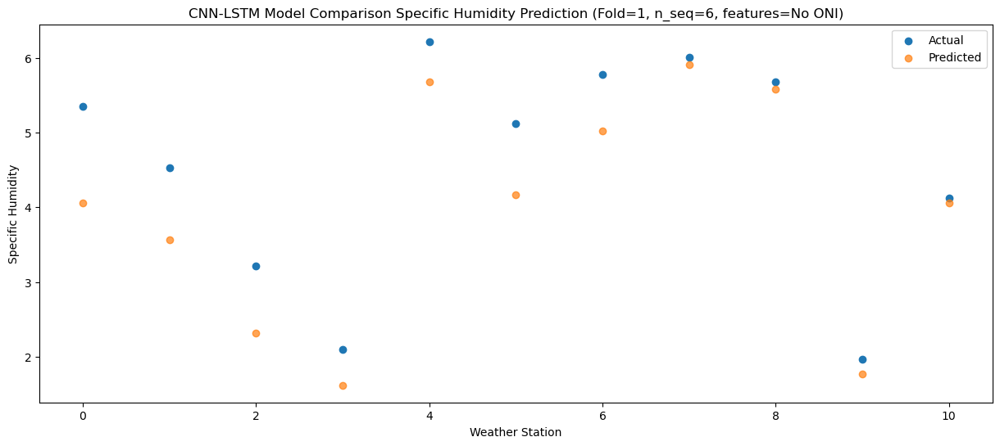

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.88   6.073878
1                 1    6.06   5.587792
2                 2    5.84   4.339126
3                 3    4.74   3.636631
4                 4    8.94   7.697721
5                 5    5.91   6.175225
6                 6    7.34   7.037127
7                 7    8.74   7.932443
8                 8    8.29   7.597830
9                 9    3.79   3.778184
10               10    5.36   6.070063


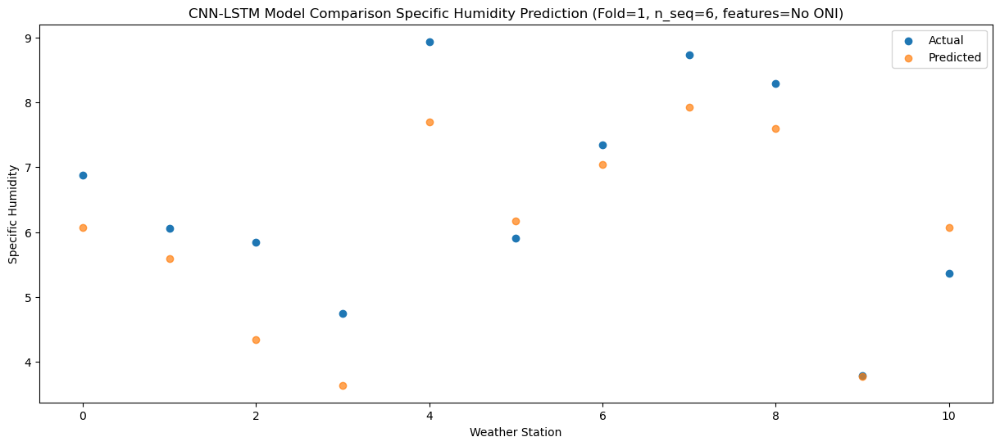

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.08   7.146509
1                 1    6.42   6.659631
2                 2    5.55   5.410695
3                 3    6.08   4.708704
4                 4   10.20   8.769574
5                 5    7.21   7.249607
6                 6    7.96   8.109100
7                 7    9.97   9.003341
8                 8    9.45   8.669663
9                 9    3.96   4.851965
10               10    6.73   7.143464


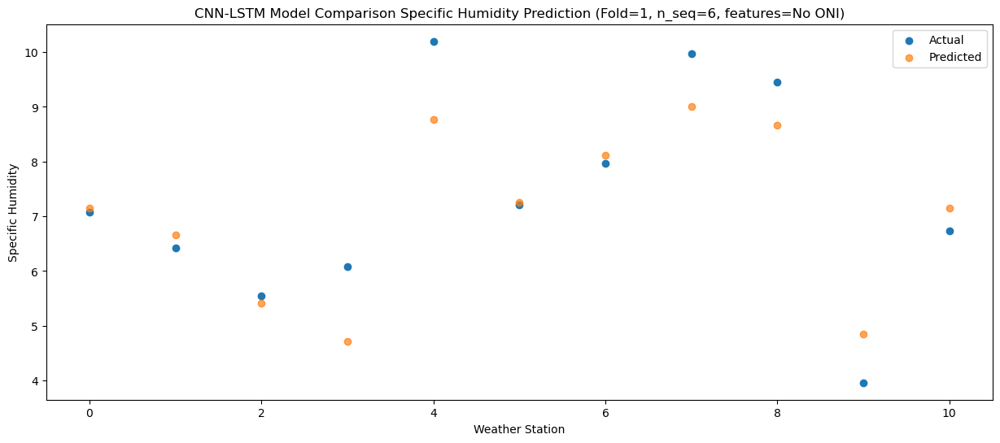

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    9.76   9.658821
1                 1    9.34   9.175569
2                 2    8.39   7.927870
3                 3    9.97   7.223569
4                 4   14.23  11.285450
5                 5   11.52   9.753906
6                 6   10.89  10.624425
7                 7   13.18  11.523589
8                 8   13.67  11.185640
9                 9    9.11   7.359005
10               10    8.26   9.652245


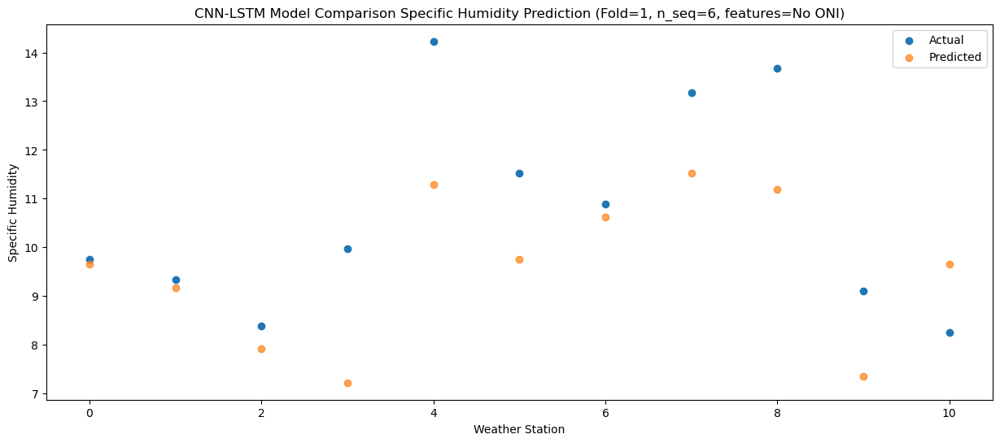

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.92  13.970668
1                 1   13.32  13.489670
2                 2   12.91  12.242740
3                 3   13.16  11.537003
4                 4   17.64  15.599511
5                 5   13.69  14.060770
6                 6   15.24  14.938145
7                 7   17.94  15.840370
8                 8   16.81  15.499763
9                 9   12.10  11.667575
10               10   13.58  13.961895


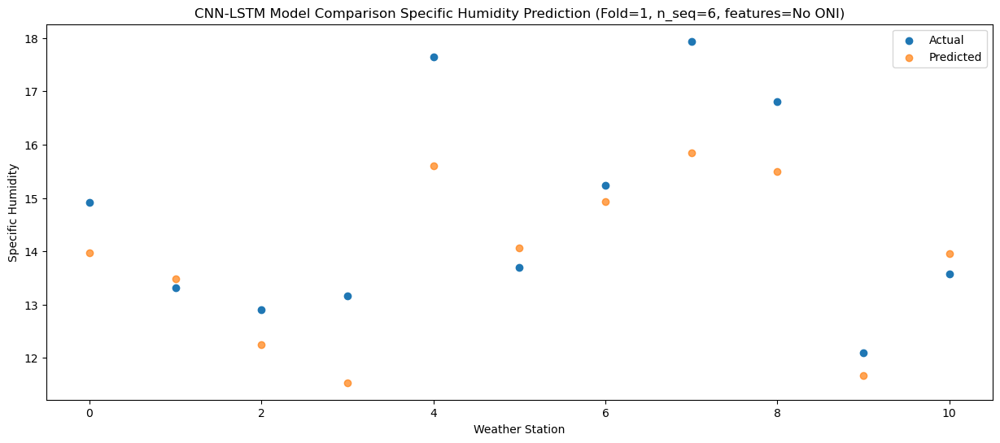

Model: "sequential_511"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_511 (Conv1D)         (None, 1, 256)            550144    
                                                                 
 max_pooling1d_511 (MaxPooli  (None, 1, 256)           0         
 ng1D)                                                           
                                                                 
 dropout_1533 (Dropout)      (None, 1, 256)            0         
                                                                 
 lstm_1022 (LSTM)            (None, 1, 1024)           5246976   
                                                                 
 dropout_1534 (Dropout)      (None, 1, 1024)           0         
                                                                 
 lstm_1023 (LSTM)            (None, 1024)              8392704   
                                                    

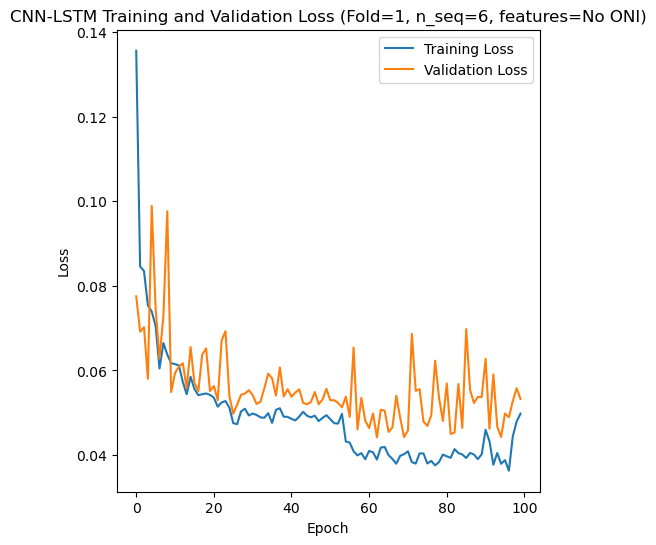

Epoch 1/100
84/84 [==============================] - 11s 66ms/step - loss: 0.1451 - accuracy: 0.5476 - mae: 0.1269 - rmse: 0.1451 - mape: 21.4988 - pearson: 0.5147 - val_loss: 0.0732 - val_accuracy: 1.0000 - val_mae: 0.0654 - val_rmse: 0.0732 - val_mape: 10.8064 - val_pearson: 0.7485
Epoch 2/100
84/84 [==============================] - 4s 47ms/step - loss: 0.0838 - accuracy: 0.7143 - mae: 0.0705 - rmse: 0.0838 - mape: 11.9389 - pearson: 0.7311 - val_loss: 0.0723 - val_accuracy: 1.0000 - val_mae: 0.0644 - val_rmse: 0.0723 - val_mape: 11.4731 - val_pearson: 0.9026
Epoch 3/100
84/84 [==============================] - 4s 47ms/step - loss: 0.0781 - accuracy: 0.7381 - mae: 0.0665 - rmse: 0.0781 - mape: 11.3159 - pearson: 0.7605 - val_loss: 0.0679 - val_accuracy: 1.0000 - val_mae: 0.0581 - val_rmse: 0.0679 - val_mape: 9.3084 - val_pearson: 0.6804
Epoch 4/100
84/84 [==============================] - 4s 47ms/step - loss: 0.0734 - accuracy: 0.7857 - mae: 0.0609 - rmse: 0.0734 - mape: 10.3079 - p

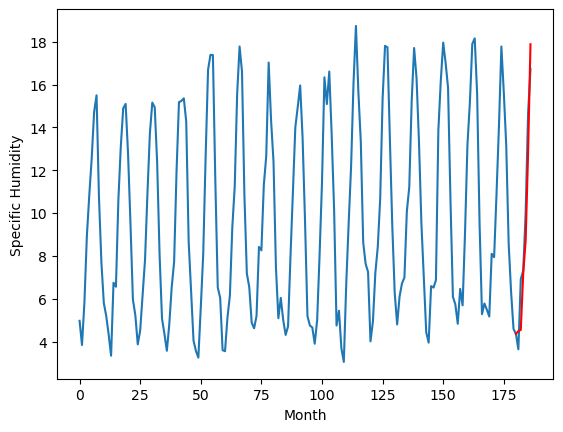

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.84		1.38		-0.46
1.16		1.04		-0.12
3.01		3.51		0.50
3.13		4.91		1.78
8.25		8.10		-0.15
11.16		13.57		2.41
[180, 181, 182, 183, 184, 185, 186]
[2.82, 1.3843953156471251, 1.0395824456214904, 3.509406759738922, 4.910366132259369, 8.099854066371918, 13.570164754390717]


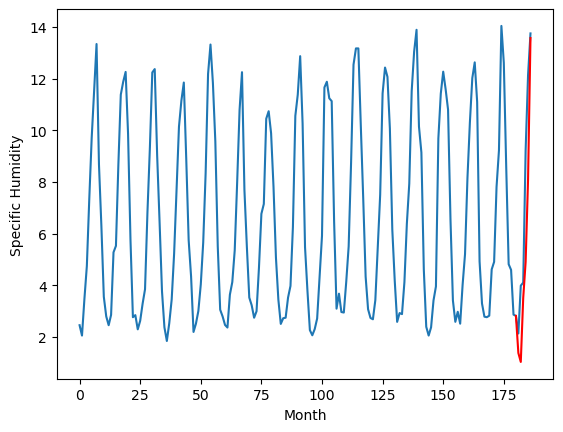

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.53		4.71		-0.82
7.66		4.53		-3.13
7.88		6.98		-0.90
8.85		8.39		-0.46
10.16		11.92		1.76
13.94		17.08		3.14
[180, 181, 182, 183, 184, 185, 186]
[9.16, 4.713061490058899, 4.528802880048752, 6.982335098981857, 8.38925040602684, 11.92279017806053, 17.07686961531639]


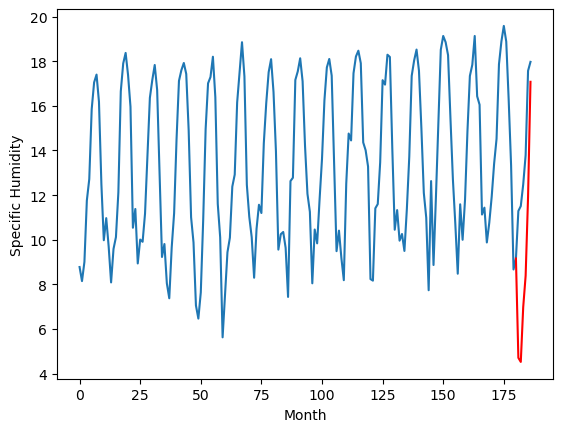

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.98		4.86		0.88
4.15		4.81		0.66
4.79		7.33		2.54
6.14		8.78		2.64
7.82		12.61		4.79
12.42		17.66		5.24
[180, 181, 182, 183, 184, 185, 186]
[2.44, 4.860066232681274, 4.812807468175888, 7.326703218221664, 8.783284810781478, 12.606203464269637, 17.664327529668807]


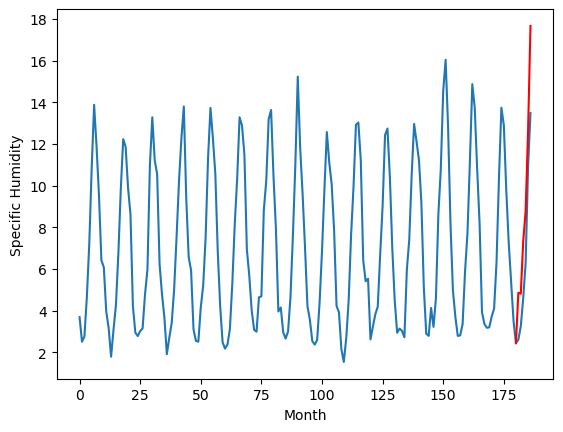

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.10		4.79		-0.31
5.08		4.77		-0.31
8.37		7.31		-1.06
8.39		8.78		0.39
11.59		12.66		1.07
15.48		17.73		2.25
[180, 181, 182, 183, 184, 185, 186]
[6.65, 4.786333338618278, 4.765998685061931, 7.3087612029910085, 8.777873360812663, 12.660242640674113, 17.7317257758975]


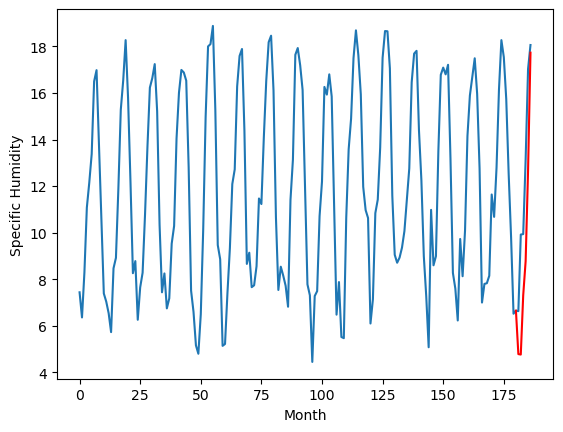

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.33		2.21		-0.12
2.28		2.11		-0.17
5.27		4.56		-0.71
6.84		6.00		-0.84
11.67		9.68		-1.99
14.31		14.73		0.42
[180, 181, 182, 183, 184, 185, 186]
[6.19, 2.212419114112854, 2.1075564166903495, 4.564651801288128, 5.999802543818951, 9.67727990359068, 14.729254676997662]


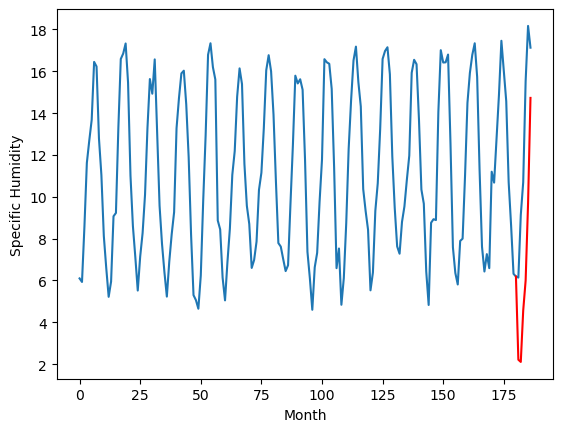

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.68		8.56		-0.12
8.35		8.48		0.13
11.21		10.96		-0.25
12.53		12.41		-0.12
16.73		16.16		-0.57
20.48		21.21		0.73
[180, 181, 182, 183, 184, 185, 186]
[4.78, 8.558470620512962, 8.48058375597, 10.963995068073272, 12.407239644527435, 16.15622207403183, 21.205709187984468]


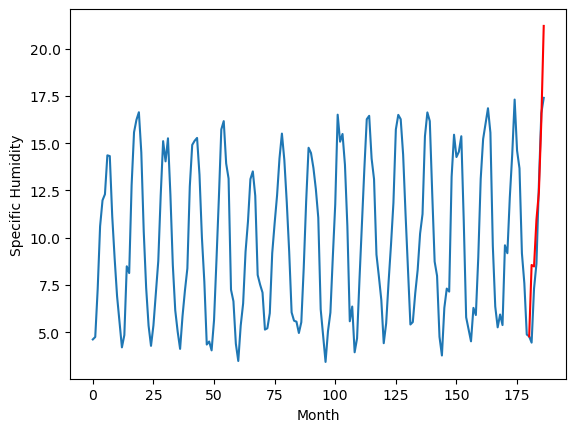

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.97		3.18		-0.79
3.84		2.84		-1.00
3.93		5.31		1.38
4.23		6.71		2.48
4.35		9.90		5.55
7.01		15.37		8.36
[180, 181, 182, 183, 184, 185, 186]
[2.61, 3.1839154386520385, 2.83936500787735, 5.310566666126251, 6.712212922573089, 9.901385905742645, 15.374100806713104]


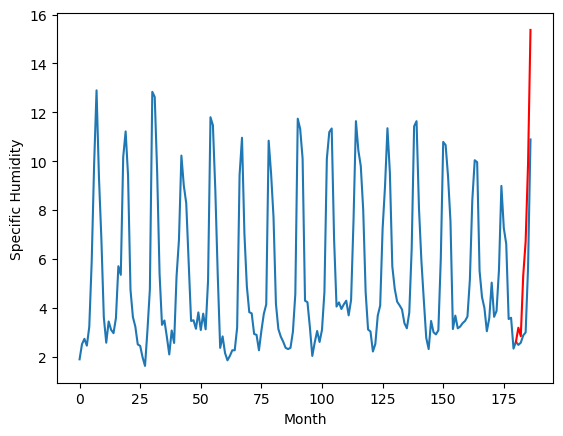

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.29		6.93		-1.36
8.82		6.59		-2.23
8.93		9.06		0.13
10.25		10.46		0.21
11.73		13.65		1.92
12.98		19.12		6.14
[180, 181, 182, 183, 184, 185, 186]
[4.6, 6.933915438652039, 6.58936500787735, 9.060566666126252, 10.46221292257309, 13.651385905742647, 19.124100806713106]


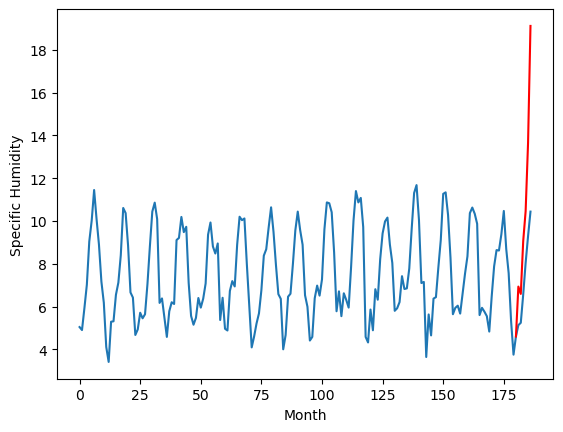

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.98		5.96		-0.02
6.05		6.00		-0.05
7.78		8.62		0.84
8.31		10.13		1.82
11.02		14.15		3.13
15.52		19.26		3.74
[180, 181, 182, 183, 184, 185, 186]
[4.27, 5.955385705828666, 6.001649169623851, 8.621065168082714, 10.12736859768629, 14.149526266753673, 19.261016039550306]


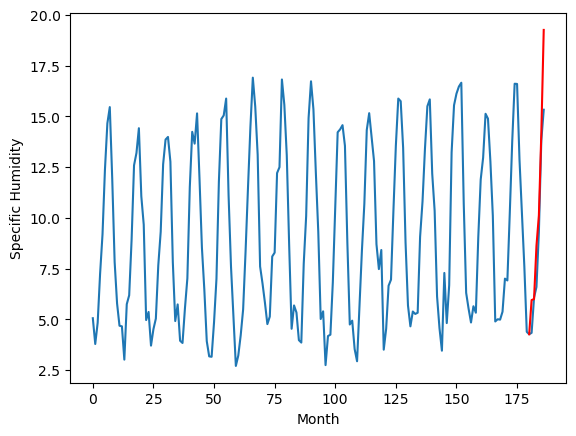

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.63		4.48		-0.15
4.87		4.53		-0.34
5.90		7.16		1.26
6.51		8.67		2.16
9.18		12.71		3.53
13.28		17.82		4.54
[180, 181, 182, 183, 184, 185, 186]
[3.91, 4.481437380313873, 4.531789894104004, 7.158723945617676, 8.669218893051148, 12.70596158027649, 17.82327401161194]


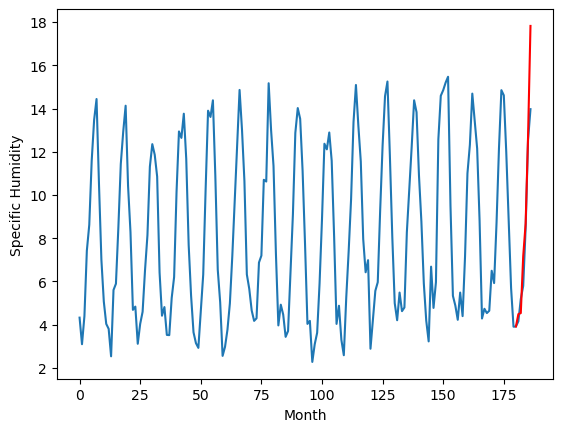

RangeIndex(start=1, stop=12, step=1)
[4.390000000000001, 1.8399999999999992, 5.529999999999999, 3.9799999999999995, 5.1, 2.33, 8.68, 3.9700000000000006, 8.29, 5.9799999999999995, 4.63]
[4.490053216814995, 1.3843953156471251, 4.713061490058899, 4.860066232681274, 4.786333338618278, 2.212419114112854, 8.558470620512962, 3.1839154386520385, 6.933915438652039, 5.955385705828666, 4.481437380313873]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.39   4.490053
1                 1    1.84   1.384395
2                 2    5.53   4.713061
3                 3    3.98   4.860066
4                 4    5.10   4.786333
5                 5    2.33   2.212419
6                 6    8.68   8.558471
7                 7    3.97   3.183915
8                 8    8.29   6.933915
9                 9    5.98   5.955386
10               10    4.63   4.481437


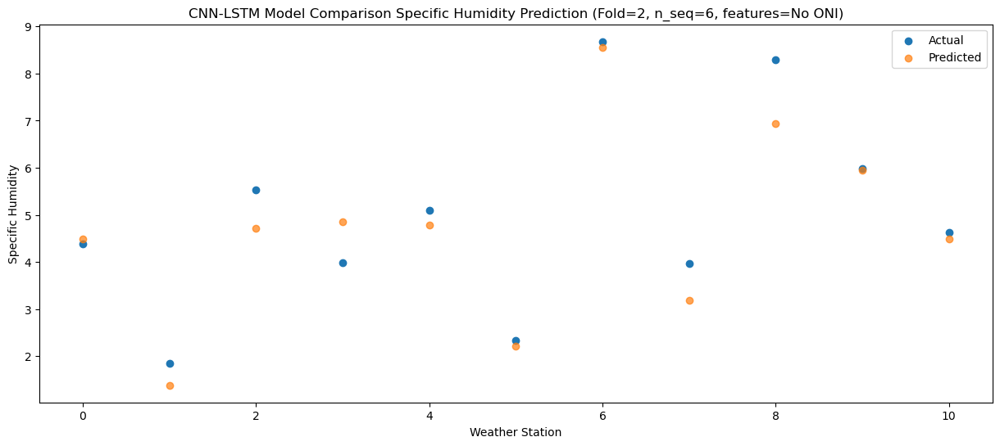

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.67   4.545496
1                 1    1.16   1.039582
2                 2    7.66   4.528803
3                 3    4.15   4.812807
4                 4    5.08   4.765999
5                 5    2.28   2.107556
6                 6    8.35   8.480584
7                 7    3.84   2.839365
8                 8    8.82   6.589365
9                 9    6.05   6.001649
10               10    4.87   4.531790


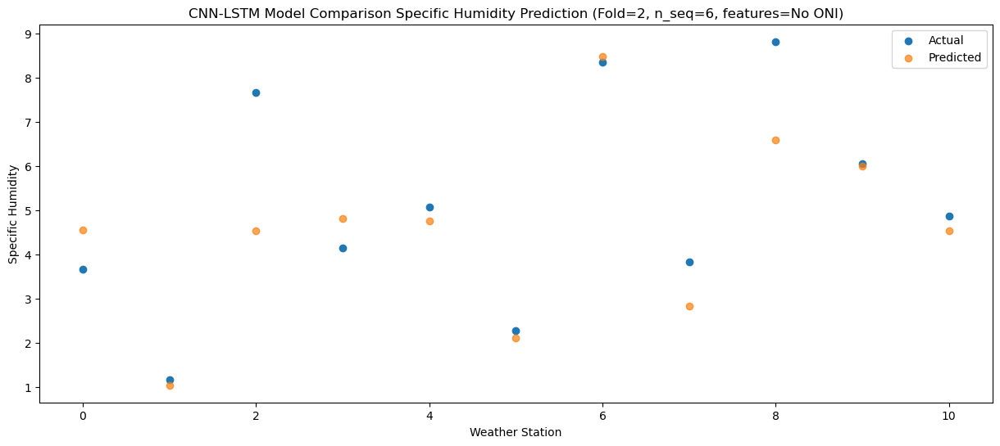

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.95   7.183228
1                 1    3.01   3.509407
2                 2    7.88   6.982335
3                 3    4.79   7.326703
4                 4    8.37   7.308761
5                 5    5.27   4.564652
6                 6   11.21  10.963995
7                 7    3.93   5.310567
8                 8    8.93   9.060567
9                 9    7.78   8.621065
10               10    5.90   7.158724


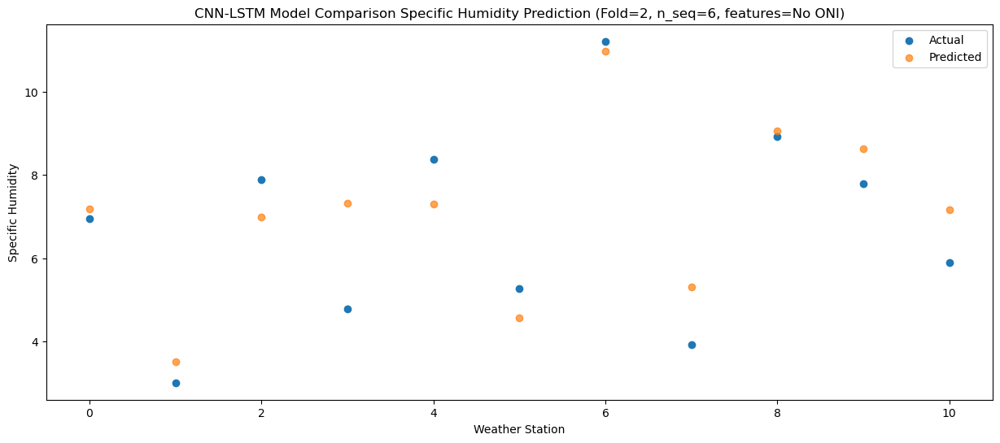

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.34   8.699551
1                 1    3.13   4.910366
2                 2    8.85   8.389250
3                 3    6.14   8.783285
4                 4    8.39   8.777873
5                 5    6.84   5.999803
6                 6   12.53  12.407240
7                 7    4.23   6.712213
8                 8   10.25  10.462213
9                 9    8.31  10.127369
10               10    6.51   8.669219


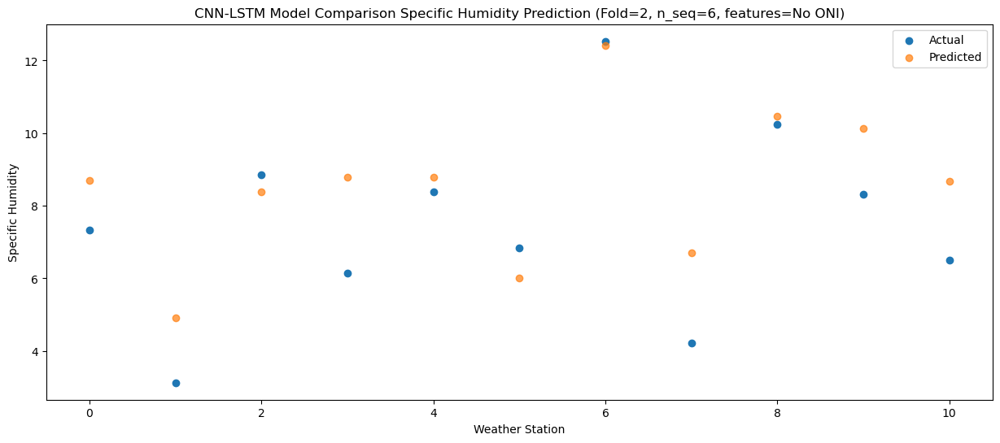

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.01  12.756978
1                 1    8.25   8.099854
2                 2   10.16  11.922790
3                 3    7.82  12.606203
4                 4   11.59  12.660243
5                 5   11.67   9.677280
6                 6   16.73  16.156222
7                 7    4.35   9.901386
8                 8   11.73  13.651386
9                 9   11.02  14.149526
10               10    9.18  12.705962


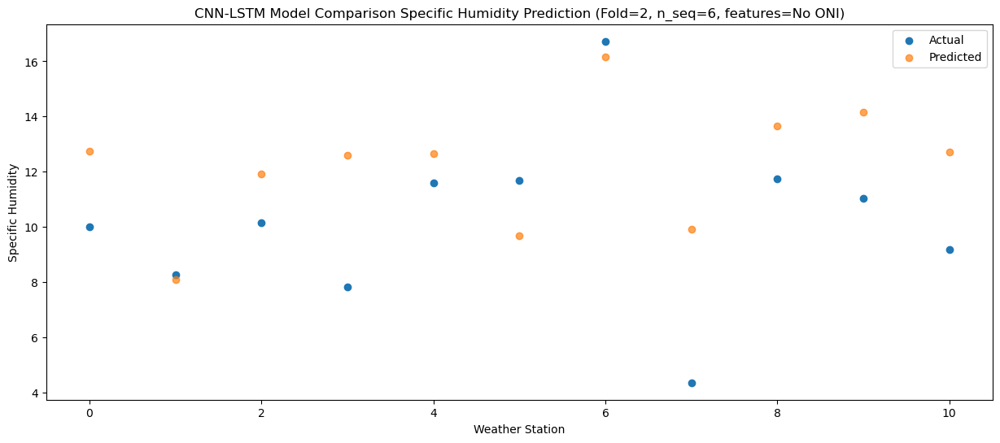

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.66  17.882919
1                 1   11.16  13.570165
2                 2   13.94  17.076870
3                 3   12.42  17.664328
4                 4   15.48  17.731726
5                 5   14.31  14.729255
6                 6   20.48  21.205709
7                 7    7.01  15.374101
8                 8   12.98  19.124101
9                 9   15.52  19.261016
10               10   13.28  17.823274


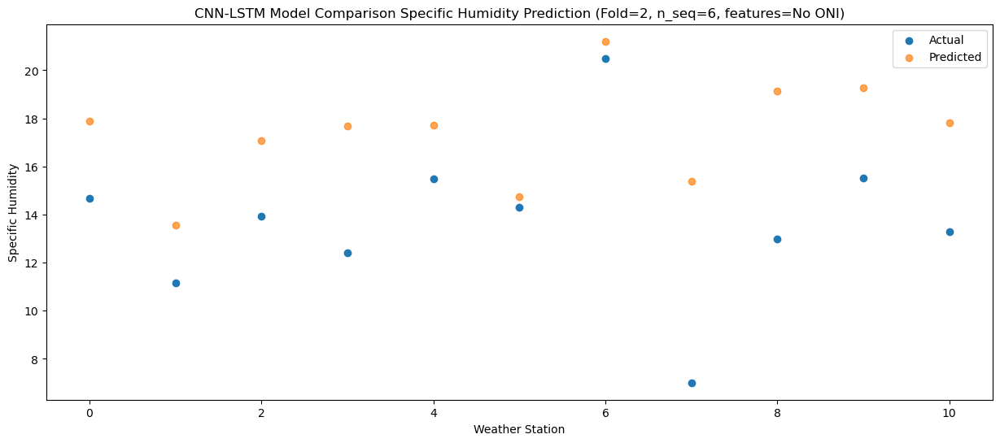

Model: "sequential_512"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_512 (Conv1D)         (None, 1, 256)            550144    
                                                                 
 max_pooling1d_512 (MaxPooli  (None, 1, 256)           0         
 ng1D)                                                           
                                                                 
 dropout_1536 (Dropout)      (None, 1, 256)            0         
                                                                 
 lstm_1024 (LSTM)            (None, 1, 1024)           5246976   
                                                                 
 dropout_1537 (Dropout)      (None, 1, 1024)           0         
                                                                 
 lstm_1025 (LSTM)            (None, 1024)              8392704   
                                                    

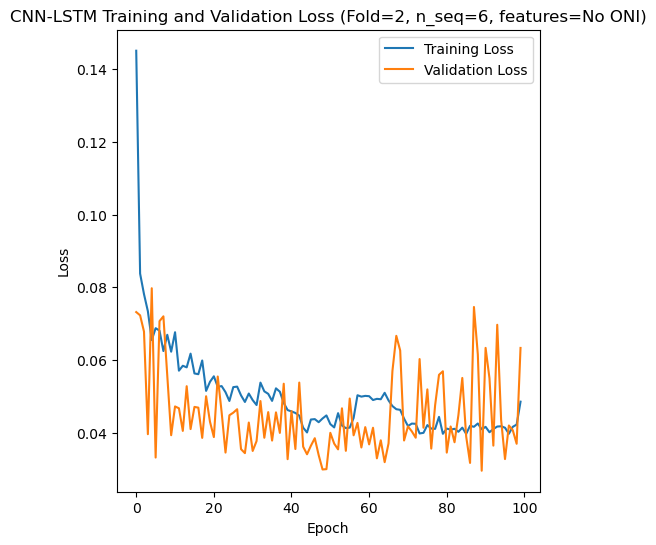

Epoch 1/100
84/84 [==============================] - 10s 63ms/step - loss: 0.1448 - accuracy: 0.6071 - mae: 0.1268 - rmse: 0.1448 - mape: 21.6808 - pearson: 0.5746 - val_loss: 0.0705 - val_accuracy: 0.9000 - val_mae: 0.0630 - val_rmse: 0.0705 - val_mape: 11.1532 - val_pearson: 0.6711
Epoch 2/100
84/84 [==============================] - 4s 46ms/step - loss: 0.0755 - accuracy: 0.7500 - mae: 0.0628 - rmse: 0.0755 - mape: 10.5726 - pearson: 0.7422 - val_loss: 0.0893 - val_accuracy: 0.9000 - val_mae: 0.0788 - val_rmse: 0.0893 - val_mape: 13.4913 - val_pearson: 0.7412
Epoch 3/100
84/84 [==============================] - 4s 47ms/step - loss: 0.0852 - accuracy: 0.7381 - mae: 0.0717 - rmse: 0.0852 - mape: 12.1079 - pearson: 0.7534 - val_loss: 0.0771 - val_accuracy: 0.9000 - val_mae: 0.0684 - val_rmse: 0.0771 - val_mape: 12.5432 - val_pearson: 0.6581
Epoch 4/100
84/84 [==============================] - 4s 46ms/step - loss: 0.0804 - accuracy: 0.7381 - mae: 0.0684 - rmse: 0.0804 - mape: 11.6282 - 

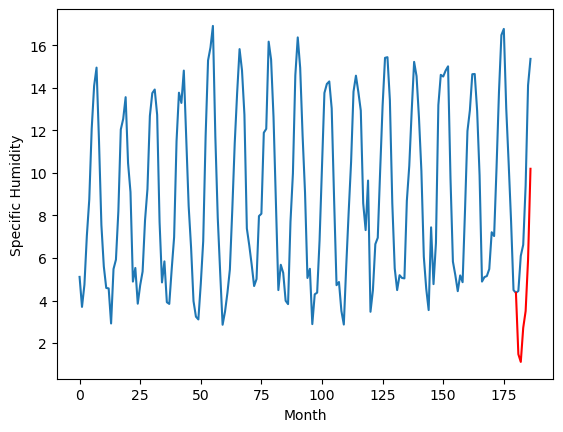

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.64		2.51		-0.13
2.08		2.15		0.07
4.59		3.75		-0.84
5.76		4.54		-1.22
9.28		6.96		-2.32
13.81		11.23		-2.58
[180, 181, 182, 183, 184, 185, 186]
[3.43, 2.5144889760017395, 2.15238786816597, 3.752226005792618, 4.543639432191849, 6.963111172914505, 11.233329068422318]


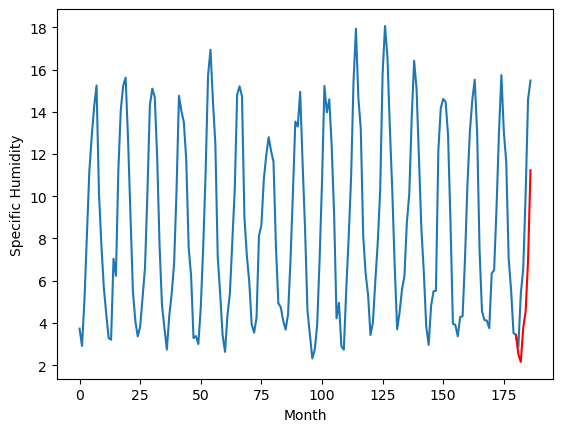

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.37		5.71		-0.66
6.31		5.35		-0.96
6.39		6.95		0.56
7.01		7.74		0.73
7.41		10.16		2.75
9.86		14.43		4.57
[180, 181, 182, 183, 184, 185, 186]
[5.43, 5.714517019987106, 5.352336161136627, 6.952009909152984, 7.743463985919952, 10.162974588871002, 14.433237783908844]


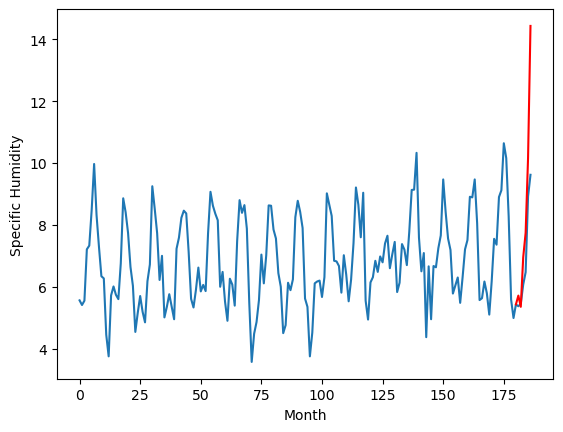

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.44		3.49		0.05
3.37		3.13		-0.24
4.67		4.73		0.06
5.86		5.52		-0.34
8.39		7.94		-0.45
13.81		12.21		-1.60
[180, 181, 182, 183, 184, 185, 186]
[3.21, 3.4944918817281723, 3.132386422753334, 4.732214904427528, 5.523630297780037, 7.9431029921770095, 12.213322795033456]


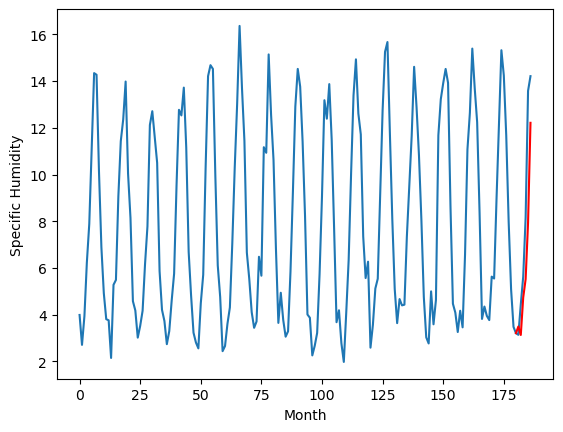

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.91		4.89		-0.02
4.08		4.53		0.45
6.56		6.13		-0.43
7.62		6.92		-0.70
10.04		9.34		-0.70
14.50		13.61		-0.89
[180, 181, 182, 183, 184, 185, 186]
[3.04, 4.894491881728173, 4.532385469079018, 6.132213950753212, 6.923629344105721, 9.343102038502693, 13.613321841359138]


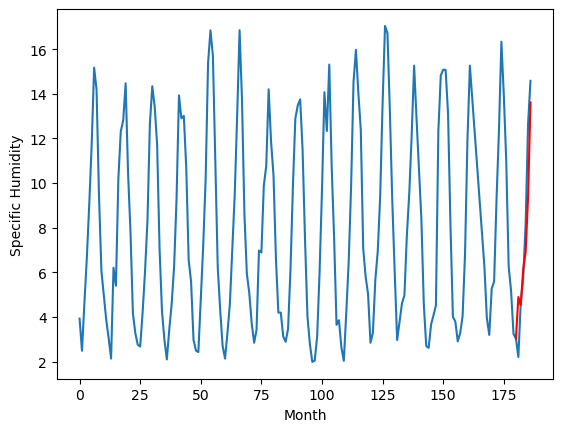

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.42		3.51		0.09
2.90		3.15		0.25
4.93		4.75		-0.18
6.23		5.54		-0.69
8.47		7.96		-0.51
13.69		12.23		-1.46
[180, 181, 182, 183, 184, 185, 186]
[2.91, 3.514489944577217, 3.1523854690790176, 4.752216811776162, 5.543631251454354, 7.963103945851326, 12.233323748707772]


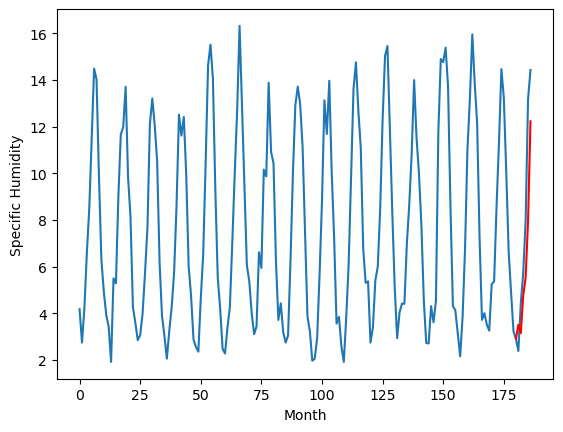

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.73		5.34		-0.39
5.79		4.98		-0.81
6.10		6.58		0.48
6.57		7.37		0.80
7.97		9.79		1.82
9.30		14.06		4.76
[180, 181, 182, 183, 184, 185, 186]
[1.6, 5.3445063805580135, 4.98235791683197, 6.582098422050476, 7.373535094261169, 9.793030200004576, 14.06327432155609]


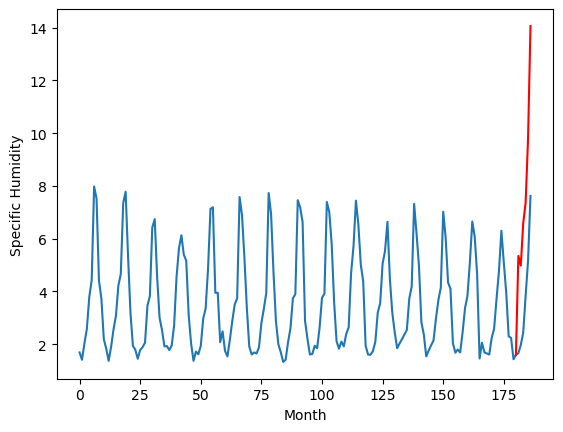

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.80		3.77		-1.03
4.32		3.41		-0.91
4.62		5.01		0.39
4.31		5.80		1.49
4.87		8.22		3.35
6.29		12.49		6.20
[180, 181, 182, 183, 184, 185, 186]
[2.86, 3.7745141142606737, 3.412341957688332, 5.012033110260964, 5.803483312726021, 8.222989862561226, 12.49324733555317]


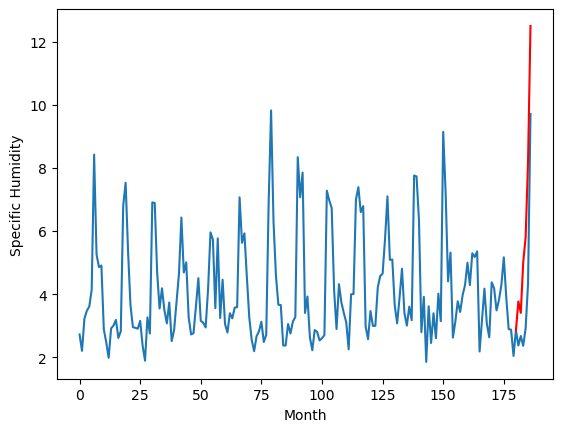

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.60		3.71		-0.89
4.25		3.35		-0.90
3.90		4.95		1.05
4.83		5.74		0.91
5.27		8.16		2.89
6.70		12.43		5.73
[180, 181, 182, 183, 184, 185, 186]
[5.65, 3.7145170199871065, 3.352334223985672, 4.9520041573047635, 5.743460141420364, 8.16297169804573, 12.433235846757889]


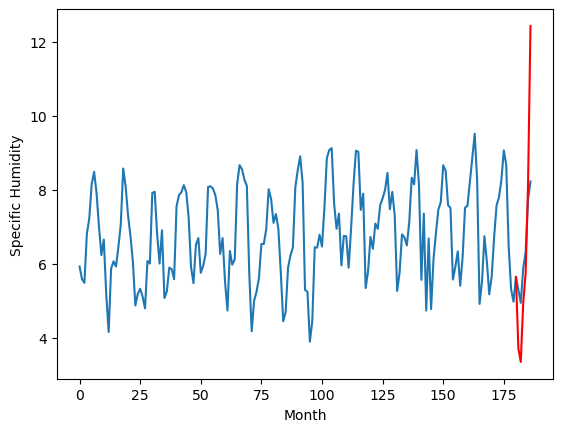

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.09		3.96		0.87
3.24		3.60		0.36
4.02		5.20		1.18
5.40		5.99		0.59
6.97		8.41		1.44
11.87		12.68		0.81
[180, 181, 182, 183, 184, 185, 186]
[2.54, 3.964498646855354, 3.6023694950342176, 5.202149577736854, 5.993576534390449, 8.413059003949165, 12.683291681408882]


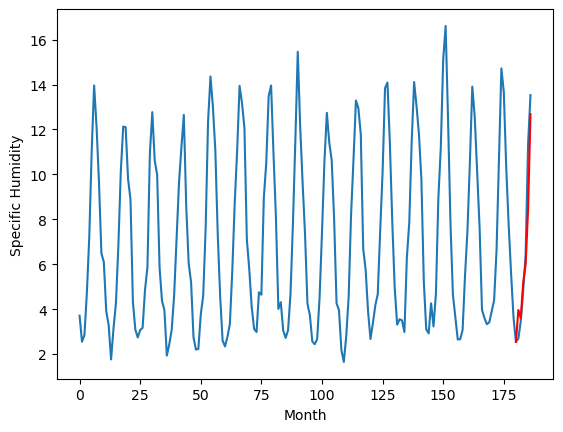

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.00		1.47		0.47
0.86		1.11		0.25
2.14		2.71		0.57
3.55		3.50		-0.05
5.14		5.92		0.78
10.01		10.19		0.18
[180, 181, 182, 183, 184, 185, 186]
[2.51, 1.4744957411289215, 1.112374814748764, 2.712172302007675, 3.503593477010727, 5.923072131872177, 10.19330051779747]


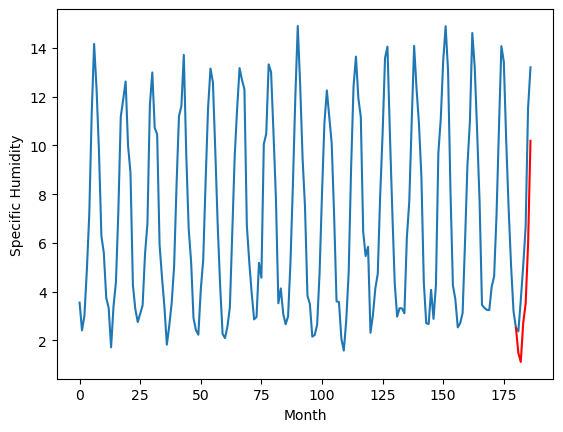

RangeIndex(start=1, stop=12, step=1)
[1.5600000000000005, 2.64, 6.369999999999998, 3.4399999999999995, 4.91, 3.42, 5.73, 4.800000000000001, 4.6, 3.09, 0.9999999999999993]
[1.474489944577217, 2.5144889760017395, 5.714517019987106, 3.4944918817281723, 4.894491881728173, 3.514489944577217, 5.3445063805580135, 3.7745141142606737, 3.7145170199871065, 3.964498646855354, 1.4744957411289215]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    1.56   1.474490
1                 1    2.64   2.514489
2                 2    6.37   5.714517
3                 3    3.44   3.494492
4                 4    4.91   4.894492
5                 5    3.42   3.514490
6                 6    5.73   5.344506
7                 7    4.80   3.774514
8                 8    4.60   3.714517
9                 9    3.09   3.964499
10               10    1.00   1.474496


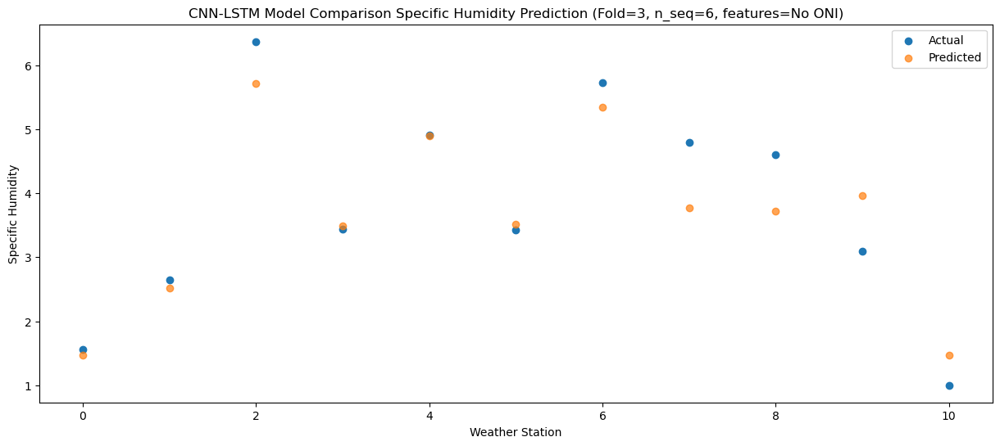

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.65   1.112386
1                 1    2.08   2.152388
2                 2    6.31   5.352336
3                 3    3.37   3.132386
4                 4    4.08   4.532385
5                 5    2.90   3.152385
6                 6    5.79   4.982358
7                 7    4.32   3.412342
8                 8    4.25   3.352334
9                 9    3.24   3.602369
10               10    0.86   1.112375


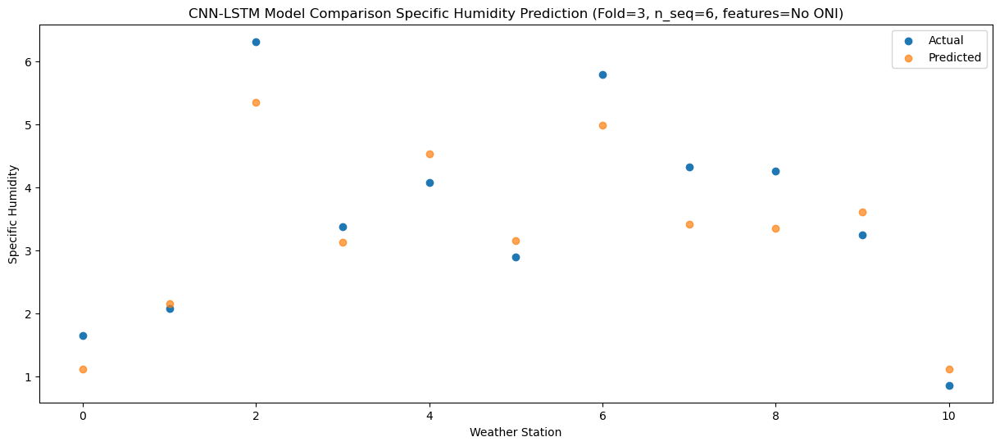

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    3.30   2.712219
1                 1    4.59   3.752226
2                 2    6.39   6.952010
3                 3    4.67   4.732215
4                 4    6.56   6.132214
5                 5    4.93   4.752217
6                 6    6.10   6.582098
7                 7    4.62   5.012033
8                 8    3.90   4.952004
9                 9    4.02   5.202150
10               10    2.14   2.712172


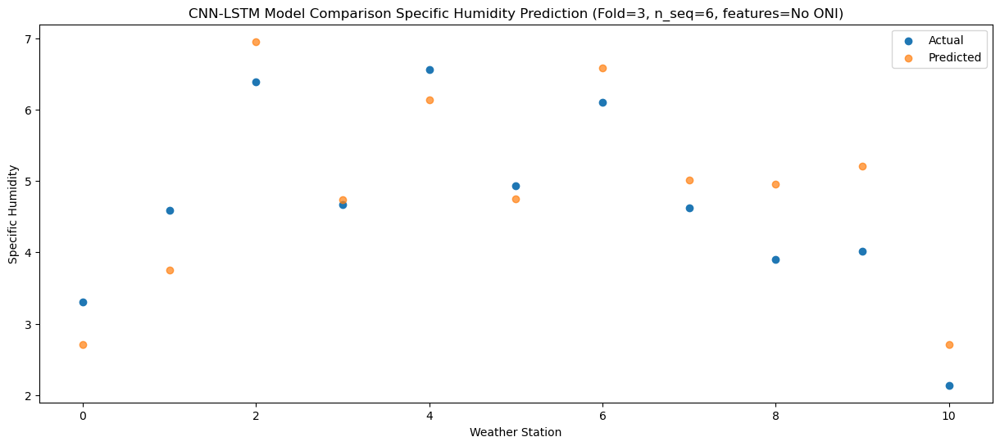

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    3.82   3.503632
1                 1    5.76   4.543639
2                 2    7.01   7.743464
3                 3    5.86   5.523630
4                 4    7.62   6.923629
5                 5    6.23   5.543631
6                 6    6.57   7.373535
7                 7    4.31   5.803483
8                 8    4.83   5.743460
9                 9    5.40   5.993577
10               10    3.55   3.503593


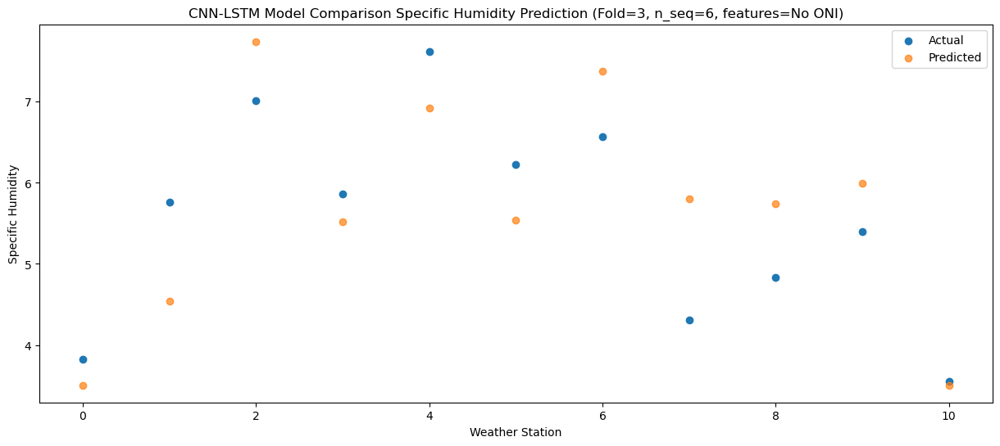

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    6.60   5.923102
1                 1    9.28   6.963111
2                 2    7.41  10.162975
3                 3    8.39   7.943103
4                 4   10.04   9.343102
5                 5    8.47   7.963104
6                 6    7.97   9.793030
7                 7    4.87   8.222990
8                 8    5.27   8.162972
9                 9    6.97   8.413059
10               10    5.14   5.923072


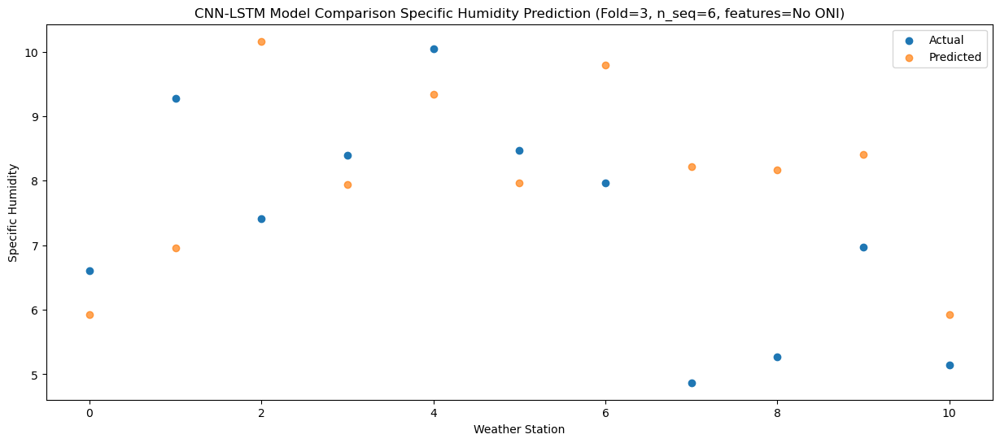

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   11.32  10.193320
1                 1   13.81  11.233329
2                 2    9.86  14.433238
3                 3   13.81  12.213323
4                 4   14.50  13.613322
5                 5   13.69  12.233324
6                 6    9.30  14.063274
7                 7    6.29  12.493247
8                 8    6.70  12.433236
9                 9   11.87  12.683292
10               10   10.01  10.193301


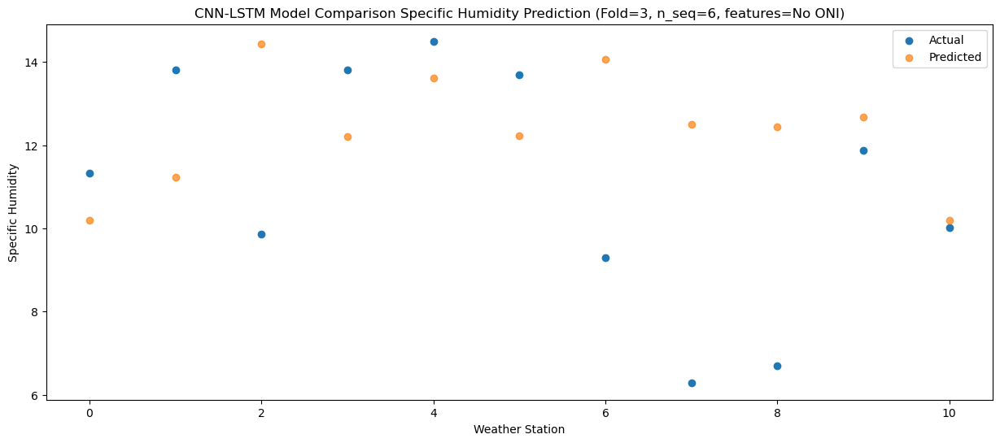

Model: "sequential_513"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_513 (Conv1D)         (None, 1, 256)            550144    
                                                                 
 max_pooling1d_513 (MaxPooli  (None, 1, 256)           0         
 ng1D)                                                           
                                                                 
 dropout_1539 (Dropout)      (None, 1, 256)            0         
                                                                 
 lstm_1026 (LSTM)            (None, 1, 1024)           5246976   
                                                                 
 dropout_1540 (Dropout)      (None, 1, 1024)           0         
                                                                 
 lstm_1027 (LSTM)            (None, 1024)              8392704   
                                                    

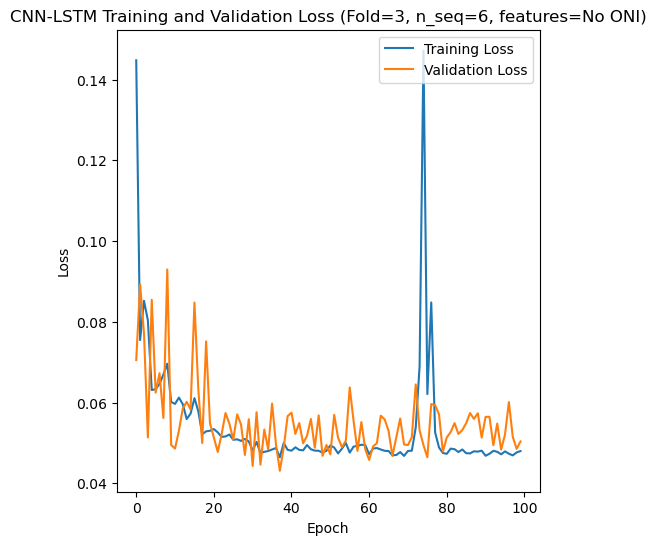

Epoch 1/100
84/84 [==============================] - 10s 63ms/step - loss: 0.1386 - accuracy: 0.6667 - mae: 0.1218 - rmse: 0.1386 - mape: 20.7435 - pearson: 0.6036 - val_loss: 0.1228 - val_accuracy: 1.0000 - val_mae: 0.0934 - val_rmse: 0.1228 - val_mape: 15.2066 - val_pearson: 0.2006
Epoch 2/100
84/84 [==============================] - 4s 48ms/step - loss: 0.0952 - accuracy: 0.7619 - mae: 0.0806 - rmse: 0.0952 - mape: 13.6081 - pearson: 0.6554 - val_loss: 0.0599 - val_accuracy: 1.0000 - val_mae: 0.0450 - val_rmse: 0.0599 - val_mape: 7.7787 - val_pearson: 0.7786
Epoch 3/100
84/84 [==============================] - 4s 46ms/step - loss: 0.0702 - accuracy: 0.7857 - mae: 0.0589 - rmse: 0.0702 - mape: 10.0583 - pearson: 0.7469 - val_loss: 0.0583 - val_accuracy: 1.0000 - val_mae: 0.0509 - val_rmse: 0.0583 - val_mape: 8.9754 - val_pearson: 0.8307
Epoch 4/100
84/84 [==============================] - 4s 48ms/step - loss: 0.0726 - accuracy: 0.7976 - mae: 0.0607 - rmse: 0.0726 - mape: 10.3800 - pe

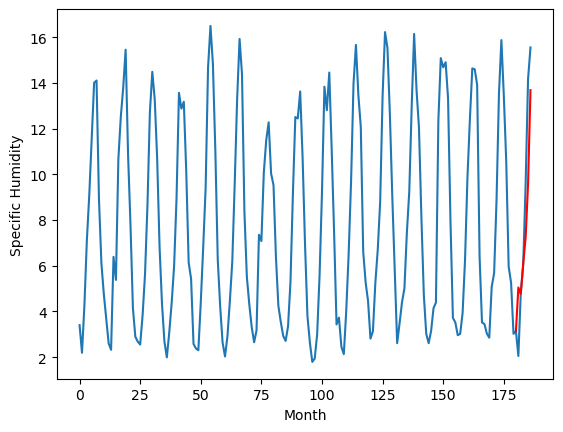

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.27		4.25		-0.02
6.26		4.12		-2.14
6.23		4.76		-1.47
6.98		5.40		-1.58
8.31		7.34		-0.97
12.60		9.80		-2.80
[180, 181, 182, 183, 184, 185, 186]
[7.79, 4.248568875789642, 4.122176317572594, 4.755054025053978, 5.400047509074211, 7.335265128016472, 9.800799576640129]


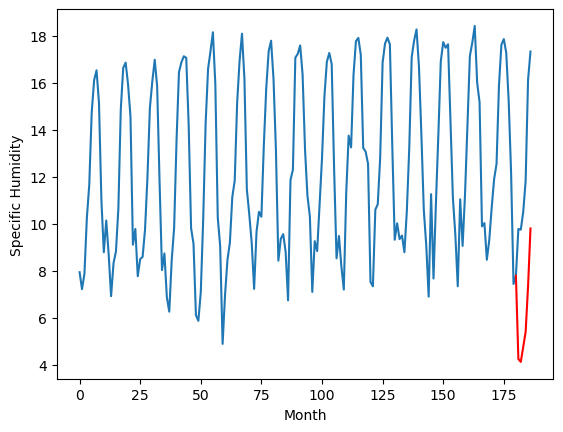

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.87		3.84		-0.03
3.75		3.58		-0.17
6.81		4.86		-1.95
7.06		5.96		-1.10
10.50		8.32		-2.18
14.74		12.30		-2.44
[180, 181, 182, 183, 184, 185, 186]
[5.03, 3.8437462109327316, 3.579501386284828, 4.859414096474648, 5.960460539460183, 8.322756643891335, 12.297855969071389]


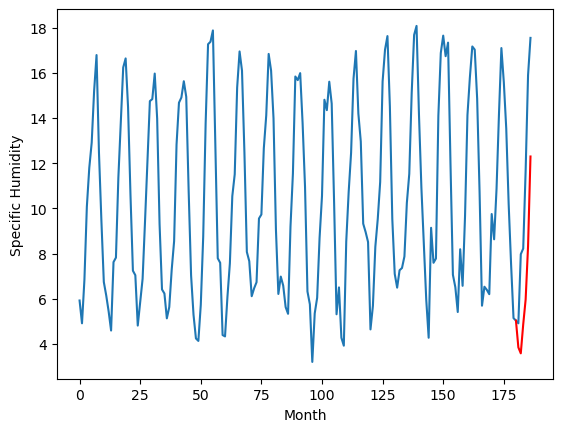

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.73		3.79		0.06
3.41		3.56		0.15
6.07		4.74		-1.33
7.36		5.76		-1.60
11.36		8.15		-3.21
15.05		11.85		-3.20
[180, 181, 182, 183, 184, 185, 186]
[4.41, 3.7927655653655528, 3.560086332410574, 4.742681227773428, 5.759601675122976, 8.154794536679983, 11.852757536023855]


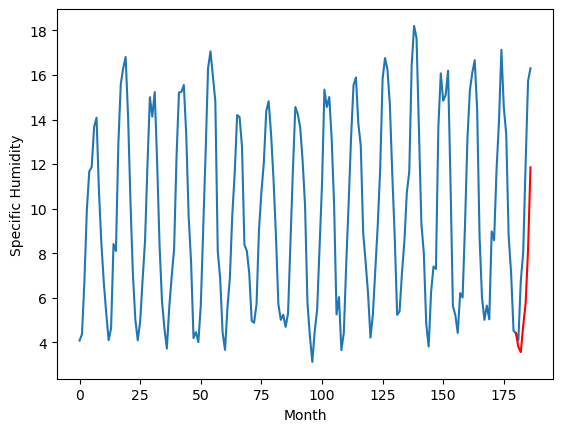

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.36		3.41		0.05
2.91		3.19		0.28
5.49		4.32		-1.17
6.85		5.29		-1.56
11.14		7.71		-3.43
15.02		11.26		-3.76
[180, 181, 182, 183, 184, 185, 186]
[4.29, 3.4079599376767873, 3.191941350325942, 4.324050634726882, 5.288182586058975, 7.706302970275283, 11.257946580275894]


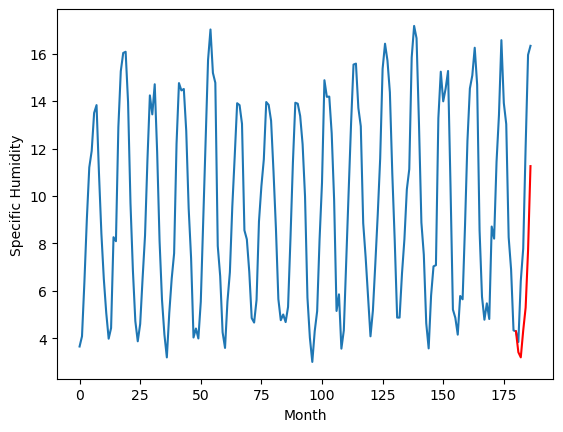

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.64		8.31		-0.33
8.00		8.19		0.19
9.49		8.79		-0.70
10.45		9.43		-1.02
15.00		11.25		-3.75
17.30		13.66		-3.64
[180, 181, 182, 183, 184, 185, 186]
[3.47, 8.312968584299089, 8.19472603738308, 8.788189756274225, 9.425754474997522, 11.249433802962304, 13.657607840895654]


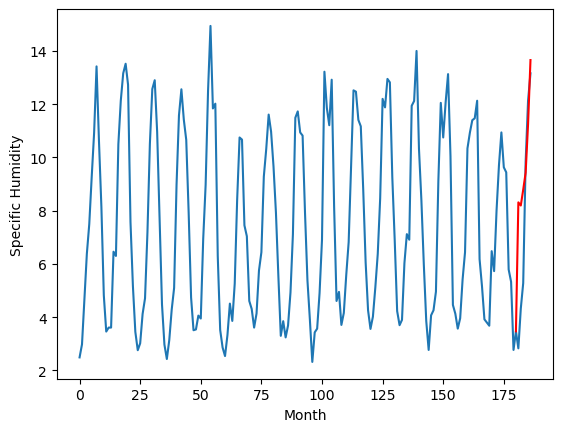

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.80		5.88		0.08
6.05		5.65		-0.40
7.76		6.83		-0.93
8.17		7.83		-0.34
11.15		10.23		-0.92
15.84		13.90		-1.94
[180, 181, 182, 183, 184, 185, 186]
[4.52, 5.883205900043249, 5.653675491064787, 6.826503926962614, 7.833306009024382, 10.233030254095793, 13.902818137854338]


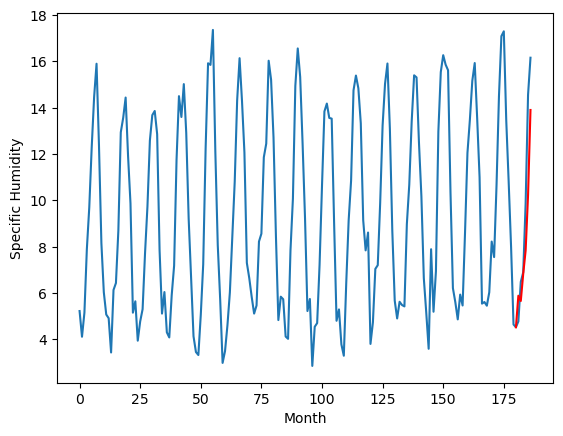

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.93		3.85		-0.08
3.30		3.57		0.27
5.67		5.06		-0.61
6.59		6.28		-0.31
9.75		8.59		-1.16
14.35		13.02		-1.33
[180, 181, 182, 183, 184, 185, 186]
[3.4, 3.852770553827286, 3.566130088567734, 5.057367967367172, 6.283767985105515, 8.585652397871018, 13.017095612287521]


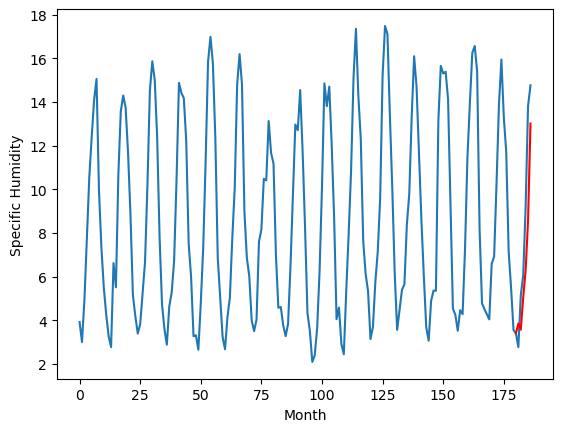

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.30		3.42		0.12
2.73		3.14		0.41
4.67		4.61		-0.06
6.00		5.83		-0.17
8.29		8.14		-0.15
13.35		12.55		-0.80
[180, 181, 182, 183, 184, 185, 186]
[2.82, 3.42396984398365, 3.136128643155098, 4.613691309094429, 5.834351518750191, 8.140150526165963, 12.550972440838814]


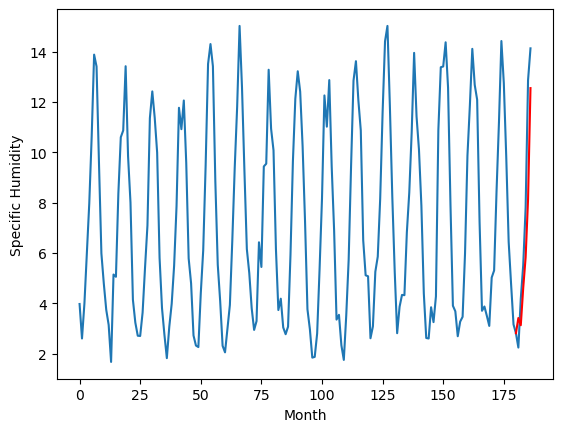

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.17		2.26		0.09
1.53		1.98		0.45
3.90		3.55		-0.35
5.21		4.79		-0.42
7.83		7.08		-0.75
12.58		11.62		-0.96
[180, 181, 182, 183, 184, 185, 186]
[2.86, 2.260568683743477, 1.97863260447979, 3.54512909591198, 4.790582572817803, 7.083763038516045, 11.621269618868828]


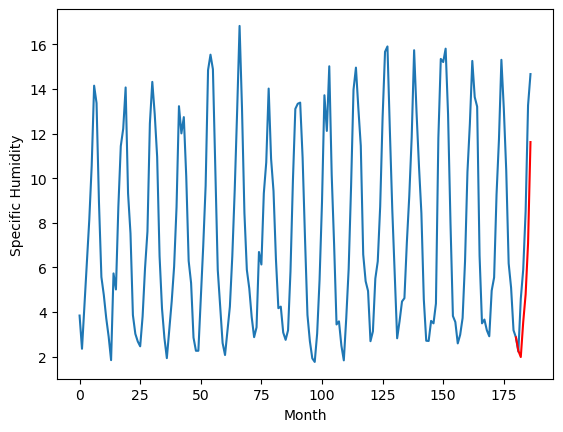

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.84		5.17		0.33
4.27		4.93		0.66
5.56		6.12		0.56
7.23		7.14		-0.09
8.83		9.54		0.71
13.84		13.24		-0.60
[180, 181, 182, 183, 184, 185, 186]
[2.61, 5.168648501187563, 4.9347269435226915, 6.121198644191026, 7.142121543437242, 9.535506476908921, 13.24463199570775]


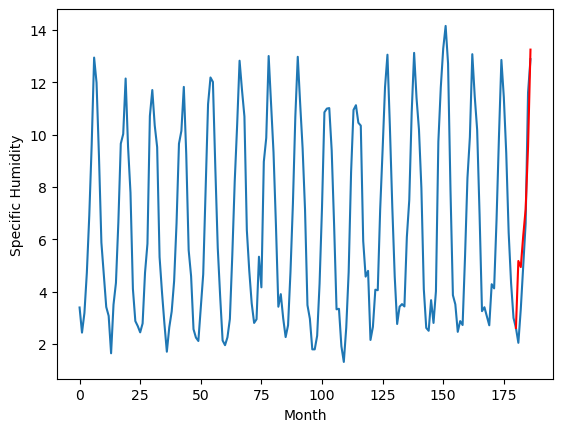

RangeIndex(start=1, stop=12, step=1)
[5.34, 4.269999999999999, 3.870000000000001, 3.7300000000000004, 3.3600000000000003, 8.64, 5.8, 3.93, 3.3000000000000003, 2.1699999999999995, 4.839999999999999]
[5.049564958810806, 4.248568875789642, 3.8437462109327316, 3.7927655653655528, 3.4079599376767873, 8.312968584299089, 5.883205900043249, 3.852770553827286, 3.42396984398365, 2.260568683743477, 5.168648501187563]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    5.34   5.049565
1                 1    4.27   4.248569
2                 2    3.87   3.843746
3                 3    3.73   3.792766
4                 4    3.36   3.407960
5                 5    8.64   8.312969
6                 6    5.80   5.883206
7                 7    3.93   3.852771
8                 8    3.30   3.423970
9                 9    2.17   2.260569
10               10    4.84   5.168649


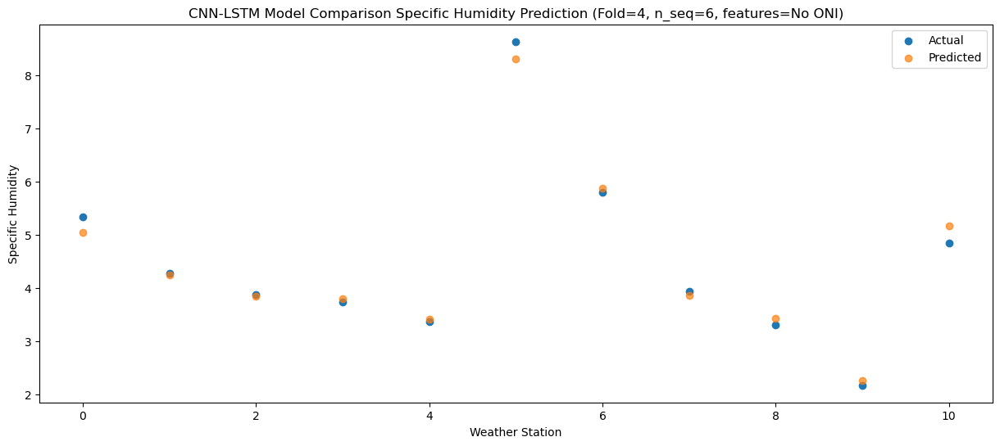

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.25   4.773108
1                 1    6.26   4.122176
2                 2    3.75   3.579501
3                 3    3.41   3.560086
4                 4    2.91   3.191941
5                 5    8.00   8.194726
6                 6    6.05   5.653675
7                 7    3.30   3.566130
8                 8    2.73   3.136129
9                 9    1.53   1.978633
10               10    4.27   4.934727


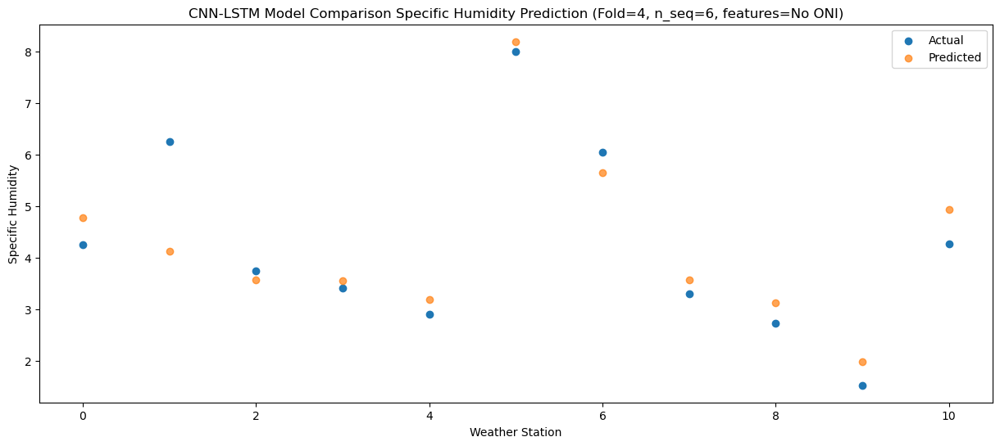

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.01   6.098438
1                 1    6.23   4.755054
2                 2    6.81   4.859414
3                 3    6.07   4.742681
4                 4    5.49   4.324051
5                 5    9.49   8.788190
6                 6    7.76   6.826504
7                 7    5.67   5.057368
8                 8    4.67   4.613691
9                 9    3.90   3.545129
10               10    5.56   6.121199


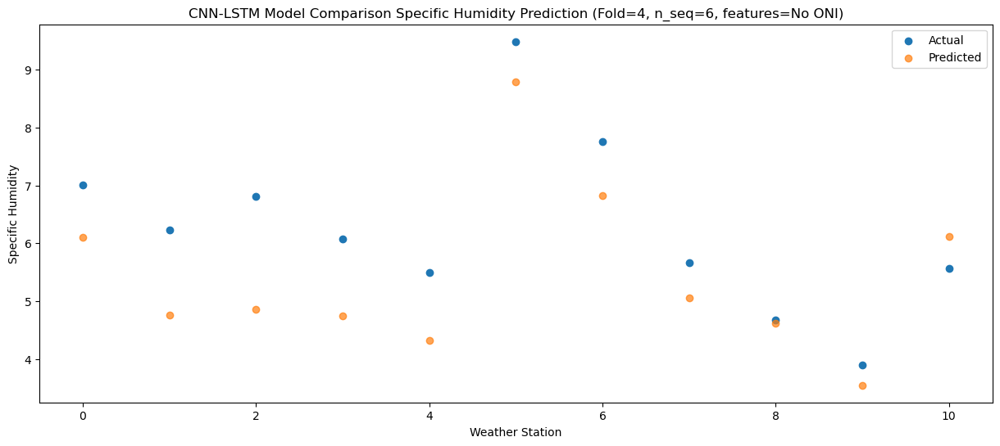

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    8.22   7.237044
1                 1    6.98   5.400048
2                 2    7.06   5.960461
3                 3    7.36   5.759602
4                 4    6.85   5.288183
5                 5   10.45   9.425754
6                 6    8.17   7.833306
7                 7    6.59   6.283768
8                 8    6.00   5.834352
9                 9    5.21   4.790583
10               10    7.23   7.142122


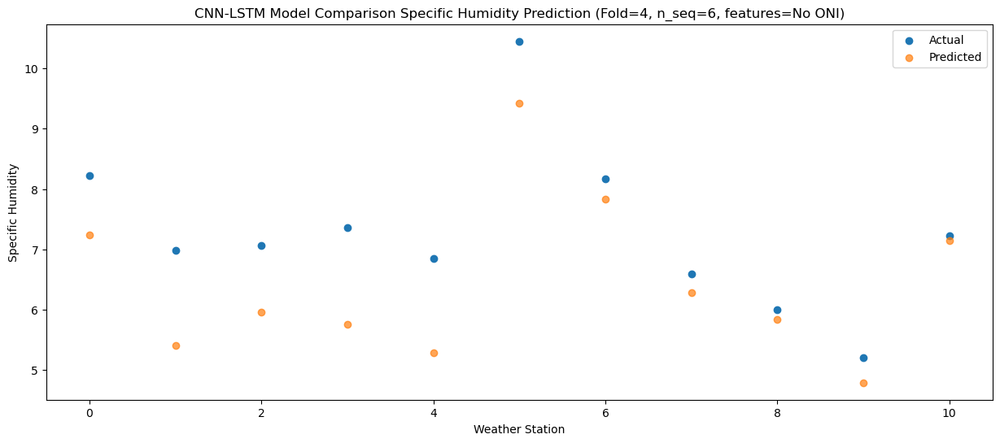

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   11.78   9.583811
1                 1    8.31   7.335265
2                 2   10.50   8.322757
3                 3   11.36   8.154795
4                 4   11.14   7.706303
5                 5   15.00  11.249434
6                 6   11.15  10.233030
7                 7    9.75   8.585652
8                 8    8.29   8.140151
9                 9    7.83   7.083763
10               10    8.83   9.535506


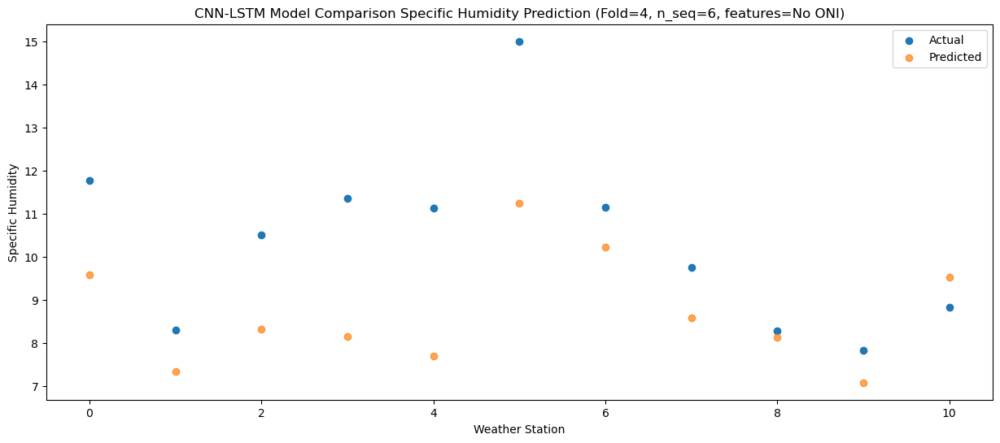

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   16.37  13.688449
1                 1   12.60   9.800800
2                 2   14.74  12.297856
3                 3   15.05  11.852758
4                 4   15.02  11.257947
5                 5   17.30  13.657608
6                 6   15.84  13.902818
7                 7   14.35  13.017096
8                 8   13.35  12.550972
9                 9   12.58  11.621270
10               10   13.84  13.244632


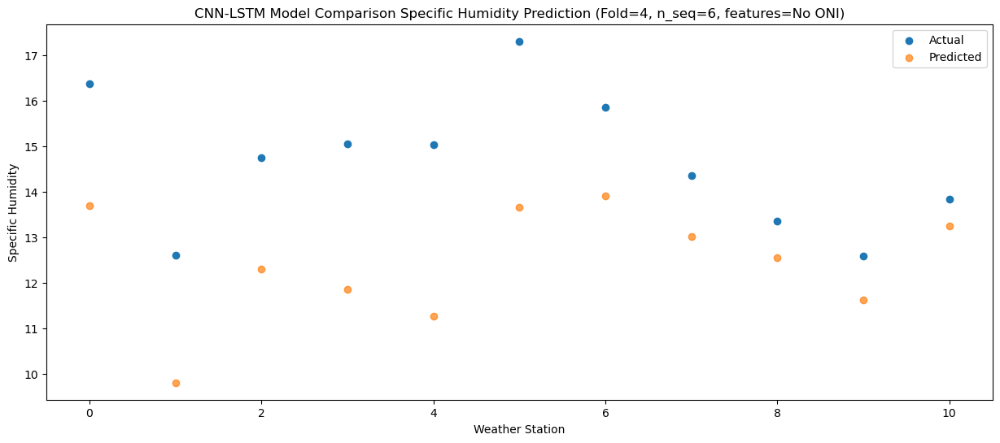

Model: "sequential_514"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_514 (Conv1D)         (None, 1, 256)            550144    
                                                                 
 max_pooling1d_514 (MaxPooli  (None, 1, 256)           0         
 ng1D)                                                           
                                                                 
 dropout_1542 (Dropout)      (None, 1, 256)            0         
                                                                 
 lstm_1028 (LSTM)            (None, 1, 1024)           5246976   
                                                                 
 dropout_1543 (Dropout)      (None, 1, 1024)           0         
                                                                 
 lstm_1029 (LSTM)            (None, 1024)              8392704   
                                                    

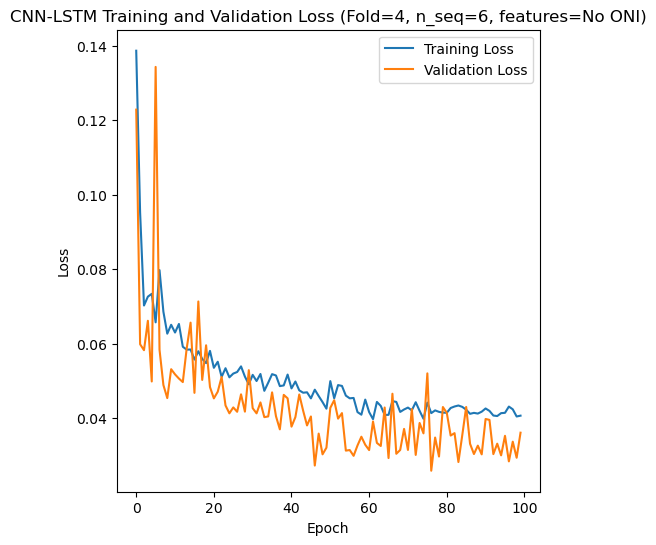

[[0.29077344683348577, 0.8458000146334155, 1.5486472068280168, 1.3166264288237473, 2.263751425196649, 3.045452696640014], [0.4601224424671539, 0.7055299213632404, 0.8357777580180794, 0.7711579744664554, 1.7470439382548992, 1.1622689087531373], [0.6227536940044623, 1.2527720086627092, 1.1055035316417483, 1.5742312869484876, 2.950579690963243, 4.281635413246833], [0.5591439863689199, 0.6040121190571814, 0.660534636087307, 0.8119464237512678, 1.9064066101609924, 3.4247059921590806], [0.1766246512014, 0.7415529478084442, 1.0494902438929217, 1.0063110016403172, 2.1302520321832508, 2.450864650512223]]
[[0.242870339236476, 0.6424117394198068, 1.3222521864013237, 1.1404426674680272, 1.9500567204031072, 2.9137165923823], [0.3627417271787473, 0.5774805027788339, 0.7195050705562944, 0.589845315326344, 1.4304000765627085, 0.9405964316021318], [0.4655259642817755, 0.8204343129423528, 0.8900470006059514, 1.296890567879786, 2.4737379592250694, 3.6548602374710826], [0.4251318979263306, 0.5216145464507

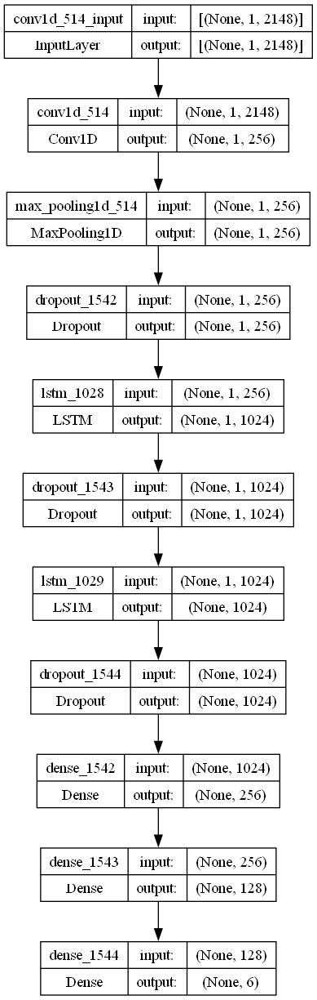

In [10]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

# fit the best CNN-LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    filters = 256
    lr = 0.0013981310767678947
    optimizer = Adam(learning_rate = lr)
    activation_function = 'relu'
    lstm_units = 1024
    dropout_rate = 0.19419075632399257

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# Make one forecast with a CNN-LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_cnnlstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_cnnlstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # Create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (specific humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='CNN-LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No ONI)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'CNN-LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No ONI)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "cnnlstm_model_optimized_SH_S6_No_ONI.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)